In [1]:
%load_ext autoreload
%autoreload 1
%aimport twitterClient

In [2]:
import tweepy
import json
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
file = open('COSC2671-assign1-Tax.json')
tweets = json.load(file)

In [4]:
tweets_df = pd.DataFrame (tweets['data'], columns = ['id', 'text', 'time', 'hastags', 'mentions', 'language', 'retweet count', 'like_count', 'country','author_id', 'username'])


In [5]:
tweets_df

,id,text,time,hastags,mentions,language,retweet count,like_count,country,author_id,username
0,1582282237978226688,RT @edwinhayward: Telegraph writers hoist thei...,2022-10-18 08:07:37+00:00,None,[edwinhayward],en,21,0,None,285194696,sanev61
1,1582282214968295427,RT @BBCBreakfast: 'An arsonist is still an ars...,2022-10-18 08:07:32+00:00,None,[bbcbreakfast],en,162,0,None,227242988,dracuk
2,1582282190272237568,RT @julieAn34464628: While the Tory government...,2022-10-18 08:07:26+00:00,None,[juliean34464628],en,124,0,None,862860726,Jem2355
3,1582282145498017792,RT @paulmasonnews: 9/ So what we are facing is...,2022-10-18 08:07:15+00:00,None,[paulmasonnews],en,4,0,None,1369970878973366275,KondratieffsWar
4,1582282135310077953,RT @hmtreasury: The changes to these Growth Pl...,2022-10-18 08:07:13+00:00,None,[hmtreasury],en,14,0,None,1357289132712751105,VincitOmniaVe18
...,...,...,...,...,...,...,...,...,...,...,...
43720,1581348295540346885,RT @JolyonMaugham: There are quite a number of...,2022-10-15 18:16:28+00:00,None,[jolyonmaugham],en,2049,0,None,2296231116,Protest_when
43721,1581348267459166209,RT @JolyonMaugham: There are quite a number of...,2022-10-15 18:16:21+00:00,None,[jolyonmaugham],en,2049,0,None,2766932951,petermartin991
43722,1581348258101989376,RT @SAINT0651: Coronation on 6 May for King Ch...,2022-10-15 18:16:19+00:00,None,[saint0651],en,18,0,None,859629938588229634,NikhithaSameerk
43723,1581348247905652736,12 years in government and history is repeatin...,2022-10-15 18:16:16+00:00,"[gtto, toriesunfittogovern]",None,en,1,1,None,193680125,steviweavi


In [6]:
tweets_df.dtypes

id                int64
text             object
time             object
hastags          object
mentions         object
language         object
retweet count     int64
like_count        int64
country          object
author_id        object
username         object
dtype: object

In [94]:
len(tweets_df)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


43725

In [7]:
tweets_df['id'] = tweets_df['id'].astype(str)

In [8]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43725 entries, 0 to 43724
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             43725 non-null  object
 1   text           43725 non-null  object
 2   time           43725 non-null  object
 3   hastags        3591 non-null   object
 4   mentions       37192 non-null  object
 5   language       43725 non-null  object
 6   retweet count  43725 non-null  int64 
 7   like_count     43725 non-null  int64 
 8   country        150 non-null    object
 9   author_id      43725 non-null  object
 10  username       43725 non-null  object
dtypes: int64(2), object(9)
memory usage: 3.7+ MB


In [9]:
from datetime import datetime

# for index in range(0, len(tweets_dict_list)):
#     tweets_dict_list[index]['time'] = datetime.datetime.strptime(tweets_dict_list[index]['time'], '%Y-%m-%d %H:%M:%S%z')
date_list = []
for tweet in tweets_df['time']:
    date_list.append(datetime.strptime(tweet, '%Y-%m-%d %H:%M:%S%z'))
#    tweets_df[tweet]['time'] = datetime.strptime(tweet['time'], '%Y-%m-%d %H:%M:%S%z')

In [10]:
tweets_df['time'] = date_list

In [11]:
tweets_df['year'] = tweets_df['time'].apply(lambda x: x.year)
tweets_df['month'] = tweets_df['time'].apply(lambda x: x.month)
tweets_df['day'] = tweets_df['time'].apply(lambda x: x.day)
tweets_df['hour'] = tweets_df['time'].apply(lambda x: x.hour)
hourly_tweets_df = tweets_df[['year','month', 'day', 'hour', 'id']].groupby(['year','month', 'day', 'hour']).count().reset_index()

In [12]:
hourly_tweets_df

,year,month,day,hour,id
0,2022,10,15,18,705
1,2022,10,15,19,1016
2,2022,10,15,20,877
3,2022,10,15,21,851
4,2022,10,15,22,512
...,...,...,...,...,...
58,2022,10,18,4,197
59,2022,10,18,5,286
60,2022,10,18,6,596
61,2022,10,18,7,805


In [13]:
hourly_tweets_df['time'] = pd.to_datetime(hourly_tweets_df[['year', 'month', 'day', 'hour']])

In [14]:
hourly_tweets_df

,year,month,day,hour,id,time
0,2022,10,15,18,705,2022-10-15 18:00:00
1,2022,10,15,19,1016,2022-10-15 19:00:00
2,2022,10,15,20,877,2022-10-15 20:00:00
3,2022,10,15,21,851,2022-10-15 21:00:00
4,2022,10,15,22,512,2022-10-15 22:00:00
...,...,...,...,...,...,...
58,2022,10,18,4,197,2022-10-18 04:00:00
59,2022,10,18,5,286,2022-10-18 05:00:00
60,2022,10,18,6,596,2022-10-18 06:00:00
61,2022,10,18,7,805,2022-10-18 07:00:00


Text(0, 0.5, 'Count')

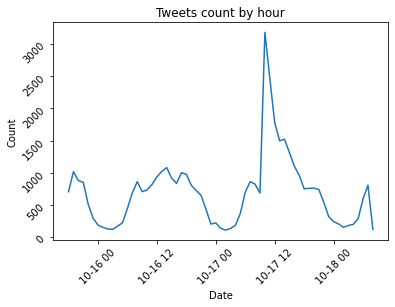

In [15]:

#plt.hist(tweets_df['created_at'], rwidth=0.7, bins = 7)
plt.plot(hourly_tweets_df['time'], hourly_tweets_df['id'])

plt.tick_params(labelrotation=45)
plt.title("Tweets count by hour")
plt.xlabel("Date")
plt.ylabel("Count")


In [16]:
top_users = tweets_df['username'].value_counts().index.tolist()[:10]


In [17]:
top_users_tweets = tweets_df[tweets_df['username'].isin(top_users)]

In [18]:
top_users_tweets = top_users_tweets[['username','id']].groupby(['username']).count().reset_index()

Text(0, 0.5, 'Count')

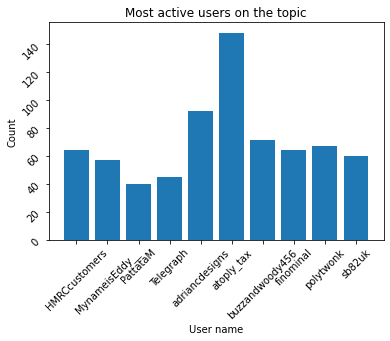

In [19]:
plt.bar(top_users_tweets['username'], top_users_tweets['id'])
plt.tick_params(labelrotation=45)
plt.title("Most active users on the topic")
plt.xlabel("User name")
plt.ylabel("Count")



In [20]:
top_liked_tweets = tweets_df.copy()


In [21]:
top_liked_tweets = top_liked_tweets.sort_values('like_count', ascending=False).head(10)



Text(0, 0.5, 'Count')

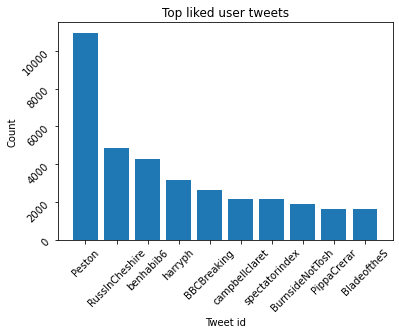

In [22]:
plt.bar(top_liked_tweets['username'], top_liked_tweets['like_count'])
plt.tick_params(labelrotation=45)
plt.title("Top liked user tweets")
plt.xlabel("Tweet id")
plt.ylabel("Count")



In [23]:
from collections import Counter

hashtags = []
hashtags_list_filter = filter(lambda x: (x != None), tweets_df['hastags'])

non_none_hashtags = list(hashtags_list_filter)

for hashtag in non_none_hashtags:
    hashtags.extend(hashtag)
    
hashtagsFreqCounter = Counter()
hashtagsFreqCounter.update(hashtags)

df = pd.DataFrame()
terms = []
counts = []
for term, count in hashtagsFreqCounter.most_common(10):
    terms.append(term)
    counts.append(count)


Text(0, 0.5, 'Count')

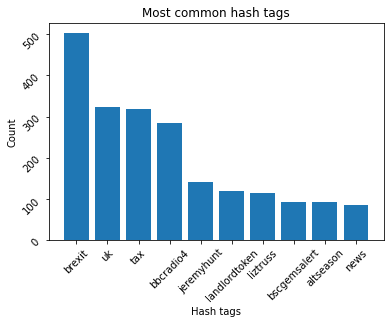

In [24]:
plt.bar(terms, counts)
plt.tick_params(labelrotation=45)
plt.title("Most common hash tags")
plt.xlabel("Hash tags")
plt.ylabel("Count")

In [25]:
def strip_links(text):
    link_regex    = re.compile('((https?):((//)|(\\\\))+([\w\d:#@%/;$()~_?\+-=\\\.&](#!)?)*)', re.DOTALL)
    links         = re.findall(link_regex, text)
    for link in links:
        text = text.replace(link[0], '')    
    return text

In [26]:
def processTweet(text, tokenizer, stemmer, stopwords):
    
    # coverting to lower case
    text = text.lower()
    text = strip_links(text)
    # tokenising the text
    lTokens = tokenizer.tokenize(text)
    
    lTokens = [token.strip() for token in lTokens]
    # separating into stems
    lStemmedTokens = set([stemmer.stem(tok) for tok in lTokens])


    # removing stopwords, digits, links, hashtags, and @mentions
    return [tok for tok in lStemmedTokens if tok not in stopwords and not tok.isdigit() and not tok.startswith("#") and not tok.startswith("@")]



In [27]:
import nltk
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
import re,string

tweetTokeniser = nltk.tokenize.TweetTokenizer()

lPunct = list(string.punctuation)

lStopwords = nltk.corpus.stopwords.words('english') + lPunct + [ 'via', '’']

tweetStemmer = nltk.stem.SnowballStemmer("english")

termFreqCounter = Counter()


token_dic = {}
for index, tweet in tweets_df.iterrows():
    
    tweetText = tweet['text']
    
    
    
    
    
     # coverting to lower case
    tweetText = tweetText.lower()
    tweetText = strip_links(tweetText)
    # tokenising the text
    lTokens = tweetTokeniser.tokenize(tweetText)
    
    lTokens = [token.strip() for token in lTokens]
    # separating into stems
    lStemmedTokens = set([tweetStemmer.stem(tok) for tok in lTokens])


    # removing stopwords, digits, links, hashtags, and @mentions


    
    lTokens = [tok for tok in lStemmedTokens if tok not in lStopwords and not tok.isdigit() and tok!= "rt" and not tok.startswith("#") and not tok.startswith("@")]
    
    
    #processTweet(text=tweetText, tokenizer=tweetTokeniser, stemmer=tweetStemmer, stopwords=lStopwords)
    
    
    
    
    
    
    
    
    
    token_dic[tweet['id']] = { 'time' : tweet['time'], 'tokens' : lTokens }
    termFreqCounter.update(lTokens)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/melvinmeshach/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [28]:
token_dic

{'1582282237978226688': {'time': Timestamp('2022-10-18 08:07:37+0000', tz='UTC'),
  'tokens': ['deeper',
   'nobodi',
   'land',
   'writer',
   'experienc',
   'delus',
   'hoist',
   '…',
   'consequ',
   '...',
   'head',
   'suppos',
   'backpack',
   'telegraph',
   'ani']},
 '1582282214968295427': {'time': Timestamp('2022-10-18 08:07:32+0000', tz='UTC'),
  'tokens': ['turn',
   'water',
   '…',
   'run',
   'arsonist',
   'even',
   'back',
   'bucket',
   'build',
   'burn',
   'still']},
 '1582282190272237568': {'time': Timestamp('2022-10-18 08:07:26+0000', tz='UTC'),
  'tokens': ['migrant',
   'tori',
   'econom',
   '…',
   'give',
   'illig',
   'govern',
   'crimin',
   'million',
   'billion',
   'pay',
   'day']},
 '1582282145498017792': {'time': Timestamp('2022-10-18 08:07:15+0000', tz='UTC'),
  'tokens': ['uk',
   'domin',
   'financi',
   'restor',
   '…',
   'fiscal',
   'c',
   'labour',
   'face',
   'credibl',
   'mean',
   'first']},
 '1582282135310077953': {'time

In [29]:
del termFreqCounter["…"]


In [30]:
termFreqCounter.most_common(10)

[('tax', 28489),
 ('uk', 19437),
 ('cut', 11166),
 ('£', 10017),
 ('truss', 8163),
 ('hunt', 7421),
 ('revers', 6802),
 ('chancellor', 6512),
 ('incom', 6061),
 ('minist', 4348)]

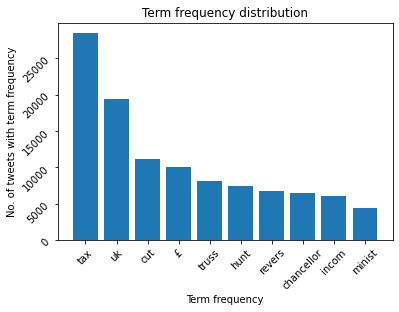

In [31]:
y = [count for tag, count in termFreqCounter.most_common(10)]
x = [tag for tag, count in termFreqCounter.most_common(10)]

plt.bar(x, y)
plt.tick_params(labelrotation=45)

plt.title("Term frequency distribution")
plt.ylabel('No. of tweets with term frequency')
plt.xlabel('Term frequency')
plt.show()

In [32]:
for term, count in termFreqCounter.most_common(100):
    print(term + ': ' + str(count))

tax: 28489
uk: 19437
cut: 11166
£: 10017
truss: 8163
hunt: 7421
revers: 6802
chancellor: 6512
incom: 6061
minist: 4348
liz: 4176
plan: 4111
jeremi: 3838
spend: 3772
32bn: 3315
say: 3306
public: 3200
year: 3187
new: 3169
million: 3066
sell: 2952
pro: 2890
real: 2884
receiv: 2825
estat: 2791
portfolio: 2790
commerci: 2776
3.3: 2772
rental: 2771
5.8: 2766
eton: 2766
come: 2694
rate: 2657
govern: 2631
mini-budget: 2614
corpor: 2527
pay: 2522
k: 2508
busi: 2403
scale: 2366
energi: 2346
biden: 2345
recess: 2171
tori: 2167
u: 2099
offic: 2054
goldman: 2046
econom: 2017
u-turn: 2001
quit: 1953
sach: 1936
...: 1933
move: 1912
announc: 1894
would: 1894
almost: 1821
regist: 1738
prime: 1718
support: 1715
rees-mogg: 1706
report: 1705
dublin: 1699
“: 1685
measur: 1653
turn: 1649
signific: 1643
becaus: 1613
pm: 1598
financi: 1521
compani: 1508
end: 1488
rais: 1484
set: 1483
avoid: 1443
reduct: 1436
financ: 1431
forecast: 1419
”: 1387
scrap: 1386
see: 1374
polici: 1364
includ: 1351
market: 1347
growt

In [33]:
def change_words(counter, dic, from_word, to_word):
    counter[to_word] = termFreqCounter[from_word]
    del counter[from_word]
    for tweet_id in dic:
        dic[tweet_id] = { 'time': dic[tweet_id]['time'] , 'tokens': list(map(lambda x: x.replace(from_word, to_word), dic[tweet_id]['tokens']))}


In [35]:
change_words(termFreqCounter, token_dic, "revers", "reverse")
change_words(termFreqCounter, token_dic, "incom", "income")
change_words(termFreqCounter, token_dic, "minist", "minister")
change_words(termFreqCounter, token_dic, "jeremi", "jeremy")
change_words(termFreqCounter, token_dic, "receiv", "receive")
change_words(termFreqCounter, token_dic, "estat", "estate")
change_words(termFreqCounter, token_dic, "commerci", "commercial")
change_words(termFreqCounter, token_dic, "govern", "government")
change_words(termFreqCounter, token_dic, "corpor", "corporate")
change_words(termFreqCounter, token_dic, "busi", "busy")
change_words(termFreqCounter, token_dic, "energi", "energy")
change_words(termFreqCounter, token_dic, "offic", "office")
change_words(termFreqCounter, token_dic, "econom", "economy")
change_words(termFreqCounter, token_dic, "announc", "announcment")
change_words(termFreqCounter, token_dic, "regist", "registration")
change_words(termFreqCounter, token_dic, "measur", "measurment")
change_words(termFreqCounter, token_dic, "signific", "significance")
change_words(termFreqCounter, token_dic, "becaus", "because")
change_words(termFreqCounter, token_dic, "financi", "finance")
change_words(termFreqCounter, token_dic, "compani", "company")
change_words(termFreqCounter, token_dic, "rais", "raise")
change_words(termFreqCounter, token_dic, "financ", "finance")
change_words(termFreqCounter, token_dic, "peopl", "people")



In [37]:
for term, count in termFreqCounter.most_common(100):
    print(term + ': ' + str(count))

tax: 28489
uk: 19437
cut: 11166
£: 10017
truss: 8163
hunt: 7421
chancellor: 6512
liz: 4176
plan: 4111
spend: 3772
32bn: 3315
say: 3306
public: 3200
year: 3187
new: 3169
million: 3066
sell: 2952
pro: 2890
real: 2884
portfolio: 2790
3.3: 2772
rental: 2771
5.8: 2766
eton: 2766
come: 2694
rate: 2657
mini-budget: 2614
pay: 2522
k: 2508
scale: 2366
biden: 2345
recess: 2171
tori: 2167
u: 2099
goldman: 2046
u-turn: 2001
quit: 1953
sach: 1936
...: 1933
move: 1912
would: 1894
announcment: 1894
almost: 1821
registration: 1738
prime: 1718
support: 1715
rees-mogg: 1706
report: 1705
dublin: 1699
“: 1685
measurment: 1653
turn: 1649
significance: 1643
because: 1613
pm: 1598
company: 1508
end: 1488
raise: 1484
set: 1483
avoid: 1443
reduct: 1436
finance: 1431
forecast: 1419
”: 1387
scrap: 1386
see: 1374
polici: 1364
includ: 1351
market: 1347
growth: 1327
back: 1316
top: 1316
ta: 1316
number: 1310
zahawi: 1295
nadhim: 1282
jacob: 1280
everi: 1268
need: 1267
joe: 1267
rise: 1240
wrongdo: 1230
th: 1192
bre

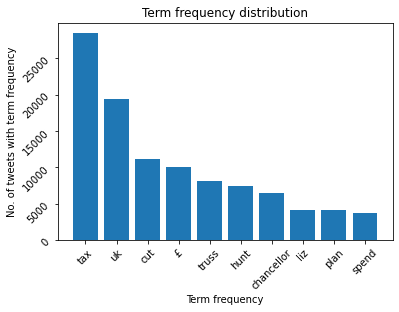

In [38]:
y = [count for tag, count in termFreqCounter.most_common(10)]
x = [tag for tag, count in termFreqCounter.most_common(10)]

plt.bar(x, y)
plt.tick_params(labelrotation=45)

plt.title("Term frequency distribution")
plt.ylabel('No. of tweets with term frequency')
plt.xlabel('Term frequency')
plt.show()

# Sentiment Analysis


In [39]:
import codecs

posWordFile = 'positive-words.txt'
negWordFile = 'negative-words.txt'

# loading the positive words
lPosWords = []
with open(posWordFile, 'r', encoding='utf-8', errors='ignore') as fPos:
    for sLine in fPos:
        lPosWords.append(sLine.strip())

setPosWords = set(lPosWords)


# load set of negative words
lNegWords = []
with codecs.open(negWordFile, 'r', encoding='utf-8', errors='ignore') as fNeg:
    for sLine in fNeg:
        lNegWords.append(sLine.strip())

setNegWords = set(lNegWords)


In [40]:
def vaderSentimentAnalysis():
    
    sentAnalyser = SentimentIntensityAnalyzer()

    lSentiment = []
    for tweet_id in token_dic:
        try:
            date = token_dic[tweet_id]['time']
            lTokens = token_dic[tweet_id]['tokens']

            dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))
            lSentiment.append([pd.to_datetime(date), dSentimentScores['compound']])

            
            print(*lTokens, sep=', ')
            for cat,score in dSentimentScores.items():
                print('{0}: {1}, '.format(cat, score), end='')
            print()

        except KeyError as e:
            pass


    return lSentiment

In [41]:
token_dic

{'1582282237978226688': {'time': Timestamp('2022-10-18 08:07:37+0000', tz='UTC'),
  'tokens': ['deeper',
   'nobodi',
   'land',
   'writer',
   'experienc',
   'delus',
   'hoist',
   '…',
   'consequ',
   '...',
   'head',
   'suppos',
   'backpack',
   'telegraph',
   'ani']},
 '1582282214968295427': {'time': Timestamp('2022-10-18 08:07:32+0000', tz='UTC'),
  'tokens': ['turn',
   'water',
   '…',
   'run',
   'arsonist',
   'even',
   'back',
   'bucket',
   'build',
   'burn',
   'still']},
 '1582282190272237568': {'time': Timestamp('2022-10-18 08:07:26+0000', tz='UTC'),
  'tokens': ['migrant',
   'tori',
   'economyyy',
   '…',
   'give',
   'illig',
   'governmentment',
   'crimin',
   'million',
   'billion',
   'pay',
   'day']},
 '1582282145498017792': {'time': Timestamp('2022-10-18 08:07:15+0000', tz='UTC'),
  'tokens': ['uk',
   'domin',
   'financee',
   'restor',
   '…',
   'fiscal',
   'c',
   'labour',
   'face',
   'credibl',
   'mean',
   'first']},
 '1582282135310077

In [42]:
def countWordSentimentAnalysis():
   
    lSentiment = []
    for tweet_id in token_dic:
            date = token_dic[tweet_id]['time']
            lTokens = token_dic[tweet_id]['tokens']

            posNum = len([tok for tok in lTokens if tok in setPosWords])

            negNum = len([tok for tok in lTokens if tok in setNegWords])
            sentiment = posNum - negNum

            lSentiment.append([pd.to_datetime(date), sentiment])


            for token in lTokens:
                if token in setPosWords:
                    print(Fore.RED + token + ', ', end='')
                elif token in setNegWords:
                    print(Fore.BLUE + token + ', ', end='')
                else:
                    print(Style.RESET_ALL + token + ', ', end='')

            print(': {}'.format(sentiment))


    return lSentiment


In [43]:
from colorama import Fore, Back, Style

def centiment_graph(frequency, sentiment_type, lSentiment):
    series = pd.DataFrame(lSentiment, columns=['date', 'sentiment'])
    
    series.set_index('date', inplace=True)
    
    series[['sentiment']] = series[['sentiment']].apply(pd.to_numeric)
    if( frequency == "daily" ):
        newSeries = series.resample('1D').sum()
    else:
        newSeries = series.resample('1H').sum()
    newSeries.plot()
    plt.title(sentiment_type + " " + frequency + " sentiment analysis")
    plt.show()

In [44]:
count_lSentiment = countWordSentimentAnalysis()

deeper, nobodi, land, writer, experienc, delus, hoist, …, consequ, ..., head, suppos, backpack, telegraph, ani, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day, : 0
uk, domin, financee, restor, …, fiscal, c, labour, face, credibl, mean, first, : 0
estim, growth, 32bn, chang, worth, around, £, tax, p, …, cost, year, polici, final, plan, : 1
stamp, growth, except, tax, chancellor, duti, recent, hunt, jeremy, reversee, governmentment, measurment, announcment, almost, plan, : 0
shine, stock, european, higher, publici, tax, u, k, reversee, : 1
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
uk, £, tax, …, energy, profit, giant, windfal, make, raise, year, expect, excess, 5bn, current, : 0
uk, tax, keep, let, roddi, rate, lowest, scotland, incomee, : 0
migrant, kept, illeg, £, tax, …, expens, hotel, million, payer, mention, .., day, : 0

countri, absolut, uk, skip, top, ️, 💨, tax, we'v, meal, affair, give, world, 😮, fam, governmentment, ❤, tri, sad, right, state, gm, gone, depress, first, ⭕, veri, ‍, break, : -1
uk, £, tax, …, energy, profit, giant, windfal, make, raise, year, expect, excess, 5bn, current, : 0
question, independ, tax, answer, …, hard, “, get, spend, length, currenc, trade, mention, : -1
uk, ensur, economyyy, anoth, septemb, reversee, governmentment, stabil, measurment, announcment, yet, bulk, tax-cut, emerg, action, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
uk, discrimin, lower, want, tax, competit, imagin, could, scenario, certain, ..., talk, even, say, rest, lost, rule, rate, ani, corporateate, 12.5, wale, people, much, company, : -1
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, inc

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
uk, growth, significance, …, outlook, report, said, recess, “, ”, expect, downgrad, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
alreadi, £, …, cost, kill, economyyyi, nonsens, figur, far, ir35, billion, contract, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
ministerer, uk, registration, r

extend, call, tax, borrow, debt, repeat, profit, oil, reev, giant, ..., 🗣, governmentment, rachel, said, windfal, labour, rather, “, gas, excess, : -1
plan, rusi, tax, accord, vat, pay, option, incomee, 5p, : 0
lie, truss, jame, heappey, 👇, either, liz, : -1
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
uk, employ, tax, post, well, onli, start, becom, busy, low, oper, attract, creat, grow, eu, place, like, singapor, regul, option, faster, never, know, : 3
improv, highlight, survey, call, tax, debt, system, credit, big, back, mani, face, plight, annual, link, bill, overpay, pay, famili, amid, : -2
parti, tax, way, fantasi, fund, project, money, spent, snp, time, document, public, servant, whi, get, payer, misus, civil, noth, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
reissu, request, chequ, becki, contact, week, need, process, hi, take, helplin, yes, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public,

migrant, kept, illeg, £, tax, …, expens, hotel, million, payer, mention, .., day, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
hunt, take, newspap, astound, headlin, charg, u-turn, tax, : 1
ignor, uk, parti, tori, 80k, tax, mandat, less, third, democraci, trash, pm, reckless, vote, mps, elect, cut, economyyyi, manifesto, member, chose, : -2
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
respons, emerg, statement, tax, chancellor, –, head, : 0
high, stock, uk, dick, liquid, hatr, tax, wipe, work, wealthi, billionair, good, hard, wealth, rest, drive, success, inflat, market, uninform, plung, people, avoid, quiet, veri, away, : 2
turn, water, …, run, arsonist, even, b

growth, £, brexit, also, tax, …, lose, 40bn, opposit, revenu, shut, treasuri, deliv, : -1
: 0
live, chang, free, tax, 📢, financee, …, help, support, train, teacher, get, avail, career, bursari, : 2
countri, lockdown, die, nobodi, …, dure, said, demonetis, mist, sorri, people, : -2
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
mortgag, chang, tax, interest, big, alway, regim, cut, gap, never, rate, inflat, gilt, go, 2.25, bond, : 0
would, helplin, case, recommend, call, rob, : 1
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
£, tax, p, …, hunt, energy, jeremy, hike, rise, pound, budget, 3,500, bill, impos, incomee, : 0
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day, : 0
plan, critic, tax, chancellor, liz, …, week, new, cut, governmentment, p

treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan, : 0
alreadi, £, …, cost, kill, economyyyi, nonsens, figur, far, ir35, billion, contract, : -1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
ppl, uk, live, whose, reassur, …, work, must, r, wors, million, thru, action, : 1
uk, nobodi, want, …, former, leader, you'r, go, officee, know, : 0
sta, 32bn, minut, £, tax, liz, restor, financee, space, …, hunt, jeremy, attempt, cut, axe, five-and-a-half, truss, : 0
household, £, debt, 227.3, alon, interest, repay, per, public, contextualis, year, 83,000, million, billion, spend, much, repres, 1,900, 5.2, day, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, uk, tax, liz, hunt, daili, jeremy, finance, new, reversee, ‘, almost, truss, plan, : 0
uk, 

turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
uk, look, wast, foreign, stop, tax, 🇬, contribut, money, spent, need, amount, 🇧, payer, aid, : 0
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
tax, averag, …, move, hike, make, higher, eu, bad, corporateate, : -1
uk, tax, clear, follow, nairobi, ranger, commiss, order, price, import, agent, 25,000, inclus, ford, deal, 4,453, cash, wildtrak, avail, eta, best, ksh, day, : 2
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
migrant, tori, economyyy, …, give, illig, governmentment, crimin, m

ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
turn, water, …, run, arsonist, even, back, bucket, build, burn, still, : -1
object, tax, …, countr, spent, make, pay, necess, : -1
uk, flat, si, la, può, conservatori, tax, una, ha, e, dire, italiani, mercati, espression, sorta, allarmato, premier, dei, é, promosso, avendo, speculazion, che, di, ag, non, fare, aspetti, scatenato, cosa, dopo, scusata, : 0
ppl, uk, live, whose, reassur, …, work, must, r, wors, million, thru, action, : 1
technol, uk, independ, consult, …, spotlight, work, week, new, member, : 1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
ministerer, payment, £, tax, …, hunt, jeremy, 🔴, interest, britain, cut, prime, trigg, 20bn, decis, save, tear, : 0
call, council, tax, …, help, low, wigan, make, receivee, qualifi, claim, pay, 💛, incomee, may, : 0
uk, household, hav, £, tax, hmrc, …, total, net, –, cut, wealth, whilst, 850bn, 40bn, held, know, : 0
enterpris, halligan,

mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
cover, star, gf, i'm, …, paraguay, healthcar, pregnant, everyth, level, paid, hotel, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
ministerer, payment, £, tax, …, hunt, jeremy, 🔴, interest, britain, cut, prime, trigg, 20bn, decis, save, tear, : 0
share, 1.5, £, given, tax, …, liechtenstein, campaign, anti-tax, hodg, margaret, https, :/, avoid, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
rememb, paid, might, report, jersey, n, : 0
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, htt

enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
ministerer, payment, £, tax, …, hunt, jeremy, 🔴, interest, britain, cut, prime, trigg, 20bn, decis, save, tear, : 0
ta, permi, less, …, work, govt, close, back, success, forc, pay, sh1tshow, company, : 2
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
deeper, nobodi, land, writer, experienc, delus, hoist, …, consequ, ..., head, suppos, backpack, telegraph, ani, : 0
us, l, …, reversee, recess, put, go, send, deep, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ministerer, payment, £, tax, …, hunt, jeremy, 🔴, i

uk, sha, …, dream, cost, lost, “, bnp, trade, ill-conceiv, fortun, ukip, : -1
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut, : -1
plan, uk, morn, tax, paus, dollar, recent, boost, low, reversee, ground, cut, risk, appetit, last, level, lost, session, almost, market, trade, slide, tuesday, 👇, test, : -1
uk, growth, love, tax, got, way, imf, degrad, outlook, recess, eu, smell, polici, rat, : 0
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善, : 0
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
exampl, truss, o

uk, tax, realli, simpli, money, simplist, withdraw, labour, mantra, super, rich, invest, leav, : 2
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
plan, uk, windfal, group, energy, share, tumbl, tax, treasuri, : 0
cover, star, gf, i'm, …, paraguay, healthcar, pregnant, everyth, level, paid, hotel, : 0
safe-haven, uk, us, treasuri, tax, monday, dollar, support, bullion, reversee, demand, cut, price, regain, lift, market, rose, eas, sentiment, unfund, decis, mark, : 1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
alreadi, blow, power, hold, …, move, huge, pressur, seen, truss, : -1
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori, : -2
hunt, bbc, newspap, take, astound, headlin, charg, u-turn, tax, news, : 1
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
32bn, £, tax, chancellor, k, …, come, reversee, c

uk, tax, canada, poilievr, …, trickl, cut, economyyyi, rich, meltdown, people, con, pierr, plan, : 0
excus, extortion, …, energy, reward, price, windfal, shitti, put, pay, we'r, impos, : 0
ministerer, uk, growth, tax, finance, charg, reversee, say, almost, read, plan, : 0
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
excus, extortion, …, energy, reward, price, windfal, shitti, put, pay, we'r, impos, : 0
one, parti, also, tax, anoth, washington, thati, thing, trader, post, group, unpopular, cut, say, public, rich, matter, british, conserv, much, quit, bond, : 0
cao, ya, en, situación, uk, canterburi, criticar, la, de, salió, el, gobierno, arzobispo, hasta, financeeera, un, al, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, clear, follow, nairobi, ran

refus, uk, 120bn, £, tax, loss, year, lose, compens, avoid, pay, everi, due, company, : -2
tax, debt, paul, paper, …, interest, good, public, creat, tension, polici, central, tucker, veri, burden, qe, : -2
ministerer, taken, urgent, tax, …, hunt, jeremy, finance, new, britain, mea, calm, almost, market, put, step, halt, : 0
ministerer, taken, urgent, tax, …, hunt, jeremy, finance, new, britain, mea, calm, almost, market, put, step, halt, : 0
truss, fast, go, chang, economyyy, apologis, ‘, liz, far, : 1
ministerer, taken, urgent, tax, …, hunt, jeremy, finance, new, britain, mea, calm, almost, market, put, step, halt, : 0
ago, ministerer, mini-budget, taken, urgent, tax, hunt, jeremy, week, finance, new, britain, measurment, announcment, calm, almost, market, put, step, three, halt, : 0
uk, remov, foreign, shop, predecessor, chancellor, …, vat-fre, new, visitor, exchequ, program, : 0
cover, star, gf, i'm, …, paraguay, healthcar, pregnant, everyth, level, paid, hotel, : 0
uk, parti, tori,

uk, china, want, tax, …, depart, credit, taiwan, suiss, shelv, seiz, cut, investment-bank, say, fast, chief, blinken, : 1
uk, live, covid, …, cost, come, bailo, without, sunak, would, scotland, resourc, : 0
uk, remov, foreign, shop, predecessor, chancellor, …, vat-fre, new, visitor, exchequ, program, : 0
…, : 0
driven, significance, …, fiscal, today, reject, u-turn, “, market, expan, : -1
…, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
owner, rs, child, tax, hold, surpris, oregon, dem, co-found, billionair, end, labor-employ, anyth, “, sweatshops-oper, year, ”, succeed, multi, fortun, dodg, : 1
uk, china, want, tax, …, depart, credit, taiwan, suiss, shelv, seiz, cut, investment-bank, say, fast, chief, blinken, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
…, biden, work, leadership, well, economyyyi, joe, conserv, inflat, batch, ask, : 2
32bn, £, tax, chancellor, k, …, come, reversee, cut, sc

chang, want, …, fail, pm, time, mani, bre, anybodi, continu, : -1
driven, significance, …, fiscal, today, reject, u-turn, “, market, expan, : -1
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
one, dom, bbc, tax, warn, shore, news, work, mogg, class, enough, cut, wealth, paid, scheme, u-turn, deal, spend, simpl, non, like, avoid, scari, use, auster, .., : 3
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
look, us, kiev, tax, dollar, …, 🤔, go, flame, : 0
displac, 1921-1925, hashom, famili, paramilitari, unsuccess, governmentment, haifa, edg, flee, peasant, ottoman, jaffa, 1,746, petit, villag, group, expel, shantytown, assist, al-fula, : -2
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
rise, earn, tax, backflip, ralli, cut, : 0
governmentment, would, risk, fair, collaps, rather, tax, financee, billionair, : 0
rip, treasuri, economyyy, monday, u

ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
plan, want, kwarteng, tax, …, corporateateat, reversee, raise, sunak, rishi, germani, corporateate, truss, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
monday, …, fiscal, detail, finance, new, governmentment, make, chief, emerg, statement, plan, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
rip, tax, …, hunt, pm, astound, guardian, u-turn, “, ”, tuesday, plan, : 

uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
war, uk, us, want, stop, tax, liz, alon, money, fleec, proxi, gone, payer, leav, : 0
subsidi, uk, tax, power, reut_r, bln, hunt, limit, say, raise, pound, : -1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
rip, tax, …, hunt, pm, astound, guardian, u-turn, “, ”, tuesday, plan, : 0
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break, : -1
ta, uk, turn, becau

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
tax, planetradio, hunt, energy, jeremy, support, scale, back, scrap, bill, fall, plan, incomee, : -1
uk, live, covid, …, cost, come, bailo, without, sunak, would, scotland, resourc, : 0
went, admit, ⁩, liz, …, ⁦, f, new, mistak, say, economyyyi, “, ”, sorri, made, truss, final, : 0
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
£, tax, p, …, hunt, energy, jeremy, hike, rise, pound, budget, 3,500, bill, impos, incomee, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
god, topic, carter, yesterday, presid, post, princ, strang, heheh, phenomena, oh, see, love, wrong, : 0
ministerer, restor, confid, finance, new, reversee, prime, chief, face, calm, bid, market, plan, : 1
vehicl, uk, love, mike, child, tax, principl, fund, adopt, realli, must, pollut, increas, transform, big, need, head, said

respond, uk, australia, similar, love, likewis, tax, least, move, help, need, reversee, cut, governmentment, decis, announcment, would, market, ill-conceiv, disproportion, : 1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus, : -1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, admit, …, accept, trash, w, pm, mistak, believ, make, economyyyi, latest, : -1
plank, council, power, …, resid, key, manifesto, creation, company, : 0
law, live, uk, tax, chancellor, hunt, boost, jeremy, cost, ..., cut, speech, economyyyi, raise, spend, inflat, consum, parliament, plan, incomee, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
mini-budget, uk, tax, liz, power, introduc, gave, busy, pressur, cut, right, fear, time, rec

uk, growth, love, tax, got, way, imf, degrad, outlook, recess, eu, smell, polici, rat, : 0
us, die, tax, way, …, work, dead, drawer, whe, ani, drop, pension, pay, plan, : -1
tax, debt, paul, paper, …, interest, good, public, creat, tension, polici, central, tucker, veri, burden, qe, : -2
alreadi, one, uk, tax, apart, …, highest, maintain, burden, current, day, : -1
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
promis, servic, truss, seem, public, whi, ‘, liz, cut, : 0
ministerer, uk, tax, …, hunt, jeremy, finance, cut, say, scrap, indefinit, plan, incomee, : -1
governmentment, cours, corporateate, market, us, uk, chang, tax, earn, ralli, cut, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporatea

disposit, ministerer, mini-budget, uk, mike, posit, tax, technic, director, week, equiti, finance, start, new, reversee, said, measurment, announcment, futur, prior, almost, portfolio, strategi, gibb, : 0
uk, 🏼, explain, tax, cc, hope, bring, need, elect, wealth, moment, incred, go, asap, next, win, 🙏, watch, : 1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, tax, …, sin, highest, incomeepet, governmentment, small, u-turn, conserv, briton, pay, fortun, : -1
peril, tax, hunt, pm, declar, u-turn, grow, clamour, truss, quit, plan, : -1
governmentment, april, uk, last, two-year, energy, onli, packag, support, : 1
formula, uk, share, tax, defenc, barnett, add, expenditur, contribut, economyyyi, get, corporateate, scotland, : 0
plan, confront, find, rip, economyyy, tax, liz, restor, hunt, cabinet, jeremy, 🔴, new, demand, britain, cut, credibl, spend, truss, tuesday, : -2
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾

ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
axe, uk, tax, chancellor, globel, new, news, –, cut, : 0
yea, tax, power, …, exact, vote, snp, document, payer, sure, deliv, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, growth, love, tax, got, way, imf, degrad, outlook, recess, eu, smell, polici, rat, : 0
look, ⁩, …, ⁦, billionair, mate, secur, go, demis, .., : 0
ministerer, plan, tax, monday, liz, restor, finance, new, britain, prime, decis, almost, calm, spend, british, market, truss, hoped-for, tear, : 1
alreadi, £, …, cost, kill, economyyyi, nonsens, figur, far, ir35, billion, contract, : -1
live, chang, economyyy, liz, speak, –, fast, ‘, far, truss, go, apologis, : 1
went, admit, ⁩, liz, …, ⁦, f, new, mistak, say, economyyyi, “, ”, sorri, made, truss, final, : 0
uk, shortest, tax, chanc

enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
4p, vow, take, bbc, sunak, tax, rishi, incomee, news, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
truth, uk, covid, siphon, beckon, tax, stay, hancock, money, probabl, cos, cum, satellit, whi, lot, bankrupt, payer, johnson, much, jail, era, company, stolen, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
cover, general, uk, tori, tax, debt, seem, come, huge, elect, strang, rich, deficit, ev

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
…, : 0
escal, strike, undo, commit, tax, damag, energy, work, hunt, short, cut, price, tri, join, moment, truss, polici, bill, spanner, fight, slash-and-burn, guarante, programm, : 0
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corpo

uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
ago, ministerer, plan, one, uk, rip, fourth, tax, monday, dollar, ralli, month, finance, ..., britain, prepar, 7h, mani, pound, budget, updat, spend, percent, jump, : -1
uk, hunt, budget, despit, tax, u-turn, face, tough, still, choic, analysi, : 1
alreadi, £, …, cost, kill, economyyyi, nonsens, figur, far, ir35, billion, contract, : -1
us, fuel, tax, …, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
obvious, day, enlighten, good, jew, u, you'r, identifi, pleas, zionist, : 1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
£, estatee, 5.8, …, real, co

economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi, : 0
stabber, track, tax, …, rubbish, cut, msm, back, opposit, made, : -1
ministerer, near, finance, tax, u, plan, k, reversee, cut, : 0
mortgag, uk, lower, because, tax, stay, exist, mobil, result, capit, wealthi, come, doe, milk, wealth, make, rise, back, higher, pound, rate, inflat, fall, invest, long, leav, know, : -1
ministerer, wave, chancellor, liz, goodby, …, jerem, mps, dure, prime, common, gone, opposit, truss, hous, leav, : 0
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
governmentment, windfal, domest, diesel, oil, tax, crude, hike, : -1
growth, pretend, given, trussonom, janet, tax, debt, born, mourn, everyon, mayb, low, make, economyyyi, actual, yesterday, daley, idea, telegraph, better, never, save, test, : -2
ta, uk, turn, because, tax, goldman, sign

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
high, alreadi, general, uk, tax, vote, elect, need, year, burden, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
blame, live, admit, kwarteng, also, tax, chancellor, brought, ironi, hunt, 🙄, cut, axe, humili, man, nhs, silent, budget, updat, brink, saviour, truss, portray, instead, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
covid, around, £, tax, …, 45p, raise, spend, billion, rate, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi, : 0
embarrass, uk, us, turn, tax, …, money, help, even, rid, incomeepet, good, cut, promis, economyyyi, mani, u, get, manag, ruin, hate, sure, neglig, .., : -2
look, uk, financee, system, …, hunt, low, stabil

common, …, live, polit, hunt, growth, jeremy, explain, scrap, london, disastr, latest, ‘, : -1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, disarray, also, economyyy, tax, liz, left, …, pm, cut, economyyyi, rich, unpr, truss, people, plan, .., : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ideolog, because, trussonom, choic, …, real, afraid, doe, dead, nonsens, mean, : -2
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put, : -1
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
uk, disarray, also, economyyy, tax, liz, left, …, pm, cut,

ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee, : 0
asset, law, uk, befor, everybodi, call, tax, certainti, accord, expropri, come, regim, ..., invest, plc, sharehold, expedi, acquir, polit, plan, know, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
uk, produc, gas, windfal, record, oil, call, tax, latest, grow, earn, bumper, : 0
ministerer, longest, uk, propos, die, later, might, job, tax, liz, less, month, reign, unpopular, probabl, second, prime, time, wild, economyyyi, crash, ever, lose, monarch, appoint, truss, histori, wildest, day, : -5
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi, : 0
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular

creativ, 840,000, babi, patriss, …, father, brother, founder, paid, se, cullor, 970,000, servic, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, live, tax, 📻, co-author, 6am, women, come, hour, cut, governmentment, mani, u-turn, listen, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
play, think, tax, …, fast, higher, sunak, would, truss, johnson, burden, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
stock, uk, wall, retreat, welcom, street, tax, surg, : -1
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
think, overpaid, tax, hmrc, method, exact, depend, usual, make, back, paid, refund, number, ani, claim, read, much, factor, click, : 0
uk, 120bn, £, tax, …, non-dom, chariti

job, scream, …, pm, c, useless, risk, anyon, seen, put, trade, scotgov, talk, : -3
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
find, employ, tax, check, detail, onlin, section, account, amandin, person, pay, : 0
ago, uk, genera, tax, …, auster, billionair, wealth, year, much, : 0
ago, mini-budget, uk, ditch, tax, chancellor, liz, මෝඩ, hunt, pm, jeremy, week, වුනේ, ස, cut, governmentment, දැක්කද, announcment, almost, වැඩෙන්, truss, three, මොකද්ද, : 0
ago, wage, lower, tax, liz, yrs, real, 1950s, 50s, highest, term, level, nhs, u-turn, knee, polic, court, truss, send, we'r, sinc, educ, auster, : 0
remov, £, stop, tax, legal, 0.01, took, add, tell, alon, money, non-dom, 25-30, even, status, windfal, let, citi, year, billion, avoid, trade, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
think, uk, tax, debt, borrow, fantasi, recent, –, nation, cut, allow, paid, offer, rocket, year, : -1
uk, tax, stupid, los

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, tori, tax, destroy, gr8, break, oligarch, shud, billionair, nation, traitor, russian, fascist, prosecut, onc, polit, influenc, treacher, : -4
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
moor, cover, seen, like, economyyyi, jame, anyth, never, year, : 1
uk, way, …, kind, thought, hole, see, genuin, greec, never, long, still, : 0
chang, want, …, fail, pm, time, mani, bre, anybodi, continu, : -1
feder, uk, us, lower, employe, tax, onli, healthcar, incredibil, benefit, florida, say, public, origin, instanc, pay, itali, incomee, earn, know, : 1
good, veri, : 1
cut, warn, scari, ‘, tax, u-turn, spend, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
plan, ditch, lewi, relief, tax, martin

threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
tender, tomorrow, …, htt, resign, wonder, time, effect, see, king, : 2
less, …, biden, fiscal, britain, name, failur, absurd, ‘, rate, inflat, perhap, reflect, reducti, : -1
live, tori, admit, tax, set, liz, fail, hunt, jeremy, need, –, mistak, say, decis, eye-wat, ‘, spend, made, truss, : -1
one, growth, want, do:, …, prove, good, pleas, truss, polici, retweet, : 0
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, pu

creativ, 840,000, babi, patriss, …, father, brother, founder, paid, se, cullor, 970,000, servic, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, enorm, tax, averag, norway, profit, oil, global, gas, company, : 0
chang, want, …, fail, pm, time, mani, bre, anybodi, continu, : -1
think, podcast, bbc, tax, great, news, compar, daili, move, well, world, report, articl, even, lay, cut, said, reaganom, frequent, : 2
household, tax, corrupt, …, cobbler, desper, cut, governmentmentm, “, ”, non, : -1
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, 

cover, independ, moor, jame, seen, economyyyi, anyth, year, like, never, : 1
complet, tax, got, …, profit, corp, big, wrong, mistak, extra, u-turn, pay, : -1
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
tax, hmrc, system, problem, need, mani, profess, account, familiar, much, invest, : -1
enforc, provid, effort, legalis, …, money, new, sourc, time, would, save, : 0
ministerer, tax, liz, reassur, …, hunt, jeremy, move, today, finance, new, britain, reversee, cut, prime, truss, plan, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
: 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
taxpay, uk, economyyyist, tax, warn, slash, fund, expenditur, freebi, bone, benefit, part, enough, cut, governmentment, unafford, level, public, nonsens, higher, utter, snps, servic, pension, pay, holyrood, : 2
refus, suffer, fuck,

ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori, : -2
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
asset, stock, uk, tax, …, boost, yie, surg, governmentment, risk, appetit, measurment, scrap, snapshot, almost, market, ust, : -1
creativ, 840,000, babi, patriss, …, father, brother, founder, paid, se, cullor, 970,000, servic, : 0
cant, tax, balanc, …, profit, book, global, forgot, winter, emili, still, factor, : 0
ago, chang, format, rememb, surpris, week, well, reversee, mini, digest, budget, almost, updat, confus, we'r, latest, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
suffer, uk, tori, tax, company, financee, energy, realli, they'v, oil, new, citizen, enough, windfal, whi, billion, harm, made, gas, people, psycholog, noth, emot, : -1
one, uk, fm, demonstr, glad, tax, fate, trigger, balanc, fiscal, prudenc, hang, new, abl, weather, scrap, see, cite, storm, polit, polici, truss, uncertainti, deni, : -1
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
urg, lawyer, propos, victim, tax, …, end, supp, scandal, account, advis, sign, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
cap, tax, set, …, cost, week, offs, windfal, wind, ‘, prevent, would, revenu, unveil, next, solar, company, : 0
lie, call, tax, anoth, worldwid, dopey, …, f, starmer, reev, windfal, wind, claim, duo, fall, : -2
illeg, brexit, boom, fund, immigr, work, profit, 

uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
cut, warn, scari, tax, u-turn, new, post, spend, : 0
tori, reveal, liz, …, grill, mp, common, key, backbench, truss, avoid, hous, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
high, absolut, uk, approach, tax, friedman, borrow, govt, earner, give, doe, support, busy, even, cut, correct, veri, grave, error, invest, : 1
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi, : 0
affect, tax, …, energy, money, governmentment, economyyyi, u-turn, bill, latest, incomee, : 0
staff, …, home

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori, : -2
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, realli, move, money, help, busy, let, economyyyi, rich, yeah, rate, : 1
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
mini-budget, highlight, tax, hunt, add, jeremy, ..., cut, said, scrap, whi, next, unfund, happen, : -1
bow, predecessor, chancellor, becki, …, recent, today, new, h, announcment, u-turn, much, :

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
investor, ministerer, uk, growth, liz, …, hunt, jeremy, sooth, finance, reversee, ‘, truss, plan, watch, : 0
ministerer, tax, liz, reassur, …, hunt, jeremy, move, today, finance, new, britain, reversee, cut, prime, truss, plan, : 0
amaz, much, chang, onli, mind, someon, month, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, windfal, truss, energy, sunak, tax, warn, sector, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, chancellor, way, show, month, laid, world, new, reversee, cut, said, mini, last, vital, budget, “, ”, pay, plan, : 0
il, tori, sconsigliano, anticip, ai, è, più, punti, nuov, toccato, ad, elezioni, labour, odierni, mentr, che, di, avanti, sondaggi, risponder, vedono, dopo, : 0
mortgag, b, uk, live, normal, averag, …, 5m, face, go, slide, deep, famil

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
uk, tax, great, introduc, …, addit, cost, custom, increas, busy, wealth, cohes, windfal, back, plus, creator, yeah, would, idea, ani, go, percentag, plan, : 1
precis, cours, uk, alter, econo, …, need, intent, would, opposit, serious, : 0
taxpay, shriek, …, hear, ha, hunt, horror, clued-up, busy, laughabl, communiti, u-turn, almost, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
alreadi, uk, vacuum, kk, pretend, notic, economyyy, hook, tax, context, otherwis, cut, 

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
ago, plan, economyyy, packag, includ, tax, monday, k, hunt, jeremy, week, reversee, cut, governmentment, announcment, chief, u, treasuri, incomee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
came, rava, …, hunt, back, osborn, public, year, servic, fall, invest, auster, : -1
tori, …, hunt, jeremy, reev, cut, rachel, labour, economyyyi, crash, no-on, spend, ask, fo, talk, —, : -1
refus, uk, funni, call, tax, …, biden, problem, economyyyi, joe, yet, massiv, acknowledg, plan, still, : -1
socialist, live, uk, befor, disarray, find, tori, glad, anoth, tax, way, unfortun, exodus, home, mass, governmentment, sell, labour, may, death, germani, better, wait, happen, win, invest, : 1
countri, one, uk, provid, shop, …, tax-fre, european, o

call, budget.h, …, hunt, exact, follow, cancel, mini, labour, dogma, : 0
reason, hostil, resum, resolv, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
owner, highlight, relief, seek, tax, trap, …, interest, articl, reli, lose, mclaughlin, potenti, company, mark, : -1
insid, nigel, …, realli, knowledg, ..., time, expos, go, : 0
rate, allow, find, tax, websit, updat, know, : 0
theorist, think, financee, …, global, believ, concern, genuin, conspiraci, past, people, mark, may, : -1
call, budget.h, …, hunt, exact, follow, cancel, mini, labour, dogma, : 0
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
tori, …, hunt, jeremy, reev, cut, rachel, labour, economyyyi, crash, no-on, spend, ask, fo, talk, —, : -1
mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spe

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, wave, chancellor, liz, goodby, …, jerem, mps, dure, prime, common, gone, opposit, truss, hous, leav, : 0
ministerer, uk, tax, way, hunt, noth, view, finance, tabl, reuter, drive, care, invest, company, away, : 0
sensat, feel, i'm, exact, horribl, triumphalist, someon, gut-wrench, impuls, see, almost, rope, lose, fire, sorri, they'r, know, : -1
uk, tax, chancellor, debt, way, discourag, gbp, hunt, noth, profit, must, gdp, oppos, octob, tabl, 31st, windfal, care, genuin, fall, percentag, invest, company, : -2
uk, cautious, tax, chancellor, way, discourag, …, hunt, noth, must, invest, company, : 0
one, catch-up, presid, sir, ukrainian, uq, got, committe, bradi, import, graham, ‘, meet, moment, person, lot, truss, —, chair, : 0
countri, uk, fuel, lower, shell, tori, because, tax, work, energy, move, give, need, fossil, hq, promis, veri, ever, rather, billion, renew, quick,

precis, cours, uk, alter, econo, …, need, intent, would, opposit, serious, : 0
uk, turn, elder, sector, tax, folli, profit, revera, alder, care-signatur, invest, accus, lifestyl, board, public, crown, proof, evas, senior, corporateate, pension, abus, mississauga, : 0
pub, blow, lik, duti, …, hunt, jeremy, breweri, huge, say, scrap, freez, industri, “, ”, alcohol, decis, : -2
precis, cours, uk, alter, econo, …, need, intent, would, opposit, serious, : 0
pub, blow, lik, duti, …, hunt, jeremy, breweri, huge, say, scrap, freez, industri, “, ”, alcohol, decis, : -2
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, cap, lower, reduc, …, energy, today, fallen, price, governmentment, exposur, far, gas, natur, : -1
pub, blow, lik, duti, …, hunt, jeremy, breweri, huge, say, scrap, freez, industri, “, ”, alcohol, decis, : -2
question, morn, monday, …, hunt, said, announcment, whi, friday, made, polici, bigger, : 0
ta, uk, turn, becau

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
estim, growth, 32bn, chang, worth, around, £, tax, p, …, cost, year, polici, final, plan, : 1
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi, : 0
teessid, verdict, sting, complet, mini-budget, disast, tax, u-turn, crisi, cut, : -1
stock, relief, tax, front, …, week, start, governmentment, mea, scrap, london, almost, market, foot, : 0
truss, pm, instead, question, sign, penni, great, liz, mordaunt, answer, : 1
teessid, verdict, sting, complet, mini-budget, disast, tax, u-turn, crisi, cut, : -1
mini-budget, conway, uk, tax, news, thing, near, ..., need, reversee, cut, governmentment, announcment, let, ed, u-turn, seven, st, know, : 0
mandat, …, vax, pm, agenda, believ, instal, de, full, con-socialist, facto, lock, swing, : 0
: 0
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous, : 0
ministerer, u

cover, seen, economyyyi, anyth, year, like, never, : 1
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand, : 0
uk, hunt, budget, despit, tax, u-turn, face, tough, still, choic, analysi, : 1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
rememb, paid, might, report, jersey, n, : 0
respond, highlight, tax, hmrc, way, social, …, danger, arrest, w, case, appeal, phish, repay, otherwis, return, fraud, email, promis, scheme, receivee, inform, men, made, four, media, larg, rebat, pay, : -1
uk, circa, lower, 40b, £, brexit, structur, debt, tax, differ, govt, fact, per, level, face, year, revenu, due, : -1
ministerer, stock, uk, propos, share, ul, tax, recent, finance, reversee, cut, higher, trade,

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
schemer, us, tori, …, well, reversee, recess, engin, predict, done, : 1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, independ, tax, …, could, cut, rest, rise, public, higher, face, spend, bigger, scotland, : 0
mini-budget, hunt, jeremy, bbc, tax, almost, reversee, cut, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, hunt, truss, jeremy, rip, entir, trussonom, chancellor, ne

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, provid, caus, stop, tax, price, windfal, raise, carbon, company, : 0
uk, owner, truth, live, want, free, martin, tax, shore, hide, news, fund, could, money, help, time, gb, back, rich, whi, forward, chill, get, trust, bank, channel, ask, put, go, much, richer, save, : 3
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
ministerer, alreadi, uk, £, trussonom, tax, …, hunt, jeremy, finance, meant, new, torch, last, billion, : 0
uk, blow, tax, liz, …, pm, move, huge, new, agenda, seen, scrap, chief, almost, “, tru, truss, treasuri, : -2
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
hail, uk, hunt

debt-fuel, tax, avert, fresh, month, …, cut, governmentment, chao, axe, last, humilia, almost, british, market, unveil, : 1
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
hail, uk, hunt, pm, jeremy, de, chancellor, facto, : 1
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori, : -2
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous, : 0
provid, radius, £, tax, innov, …, developi, work, credit, help, r, lead, market, secur, digit, servic, 15k, : 2
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
enforc,

ministerer, urg, liz, …, laugh, mps, detain, common, say, prime, penni, mordaunt, leader, opposit, truss, hous, jeer, : -1
uk, economyyy, …, week, stabil, risk, global, see, crisi, grow, wors, get, crucial, : -1
polit, horni, kiss, penni, predict, emoji, hack, chef, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
stock, retreat, uk, wall, welcom, idaho, street, tax, press, surg, : -1
: 0
mini-budget, rip, left, …, hunt, jeremy, common, penni, mordaunt, tear, : -1
mini-budget, hunt, jeremy, tax, almost, reversee, cut, : 0
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
rate, allow, requir, make, sure, info, we'v, updat, : 0
ana, uk, household, typic, chang, £, tax, …, 1,000, benefit, c, good, announcment, wors, parliament, due, : 2
ministerer, economyyy, packag, includ, k, …, recent, finance, reversee, governmentment, announcment, u, plan, incomee, : 0
hail, uk, 

uk, pretend, tax, profit, ad, say, windfal, take, higher, extra, rate, : -1
ignor, string, tori, hold, …, purs, even, governmentment, mis, devolut, you'r, still, : 0
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand, : 0
befor, tori, wade, …, biden, tell, problem, sort, home, joe, senior, british, polit, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, typic, tax, work, finance, new, cut, scrap, almost, bid, polit, market, plan, appeas, : 0
ta, off-payrol, …, basic, work, addit, reduct, repeal, plus, u-turn, rule, ir35, rate, incomee, : 1
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand, : 0
louis, live, request, call, council, tax, social, unabl, hi, back, assist, enquiri, thank, video, 0161 793 2500, chat, media, option, we'r, : 1
propos, chang, tax, chancellor, new, reversee, : 0
call, council, tax, …, help, low, wigan, m

mini-budget, entireti, growth, 32bn, £, controversi, predecessor, tax, chancellor, reform, hunt, jeremy, backtrack, come, new, cut, bin, scrap, almost, ir35, read, officee, plan, day, : 0
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
uk, tax, …, decad, larger, cut, rest, requir, rise, public, spend, would, first, like, bigger, : 1
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
alreadi, uk, tax, levi, …, total, profit, take, extra, done, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, s

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, 20p, abolish, £, tax, restor, basic, earner, 45p, highest, per, mini, 19p, rise, budget, shredder, credibl, year, rate, corporateate, incomee, 150k, : -1
governmentment, mini-budget, busy, uk, live, share, ditch, tax, pound, bond, –, ralli, cut, : 0
grim, : -1
cover, seen, like, economyyyi, anyth, never, year, : 1
uk, kwasi, kwarteng, predecessor, tax, chancellor, monday, news, …, hunt, jeremy, new, scrap, bulk, break, : -2
arrang, off-payrol, uk, tax, news, legisl, today, repeal, extens, reversee, governmentment, read, full, step, plan, stori, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
extend, chancellor, outlin, …, hunt, fiscal, jeremy, htt, common, ahead, gain, pound, latest, plan, : 1
ta, uk, turn, because, tax, goldman, significance, …, redu

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
countri, suffer, uk, migrant, half, tax, two, near, 1950s, popul, ad, onli, come, cannot, fact, year, million, cater, people, bill, refuge, infrastructur, : -1
high, uk, migrant, 49/50, tax, 1950s, popul, everyon, religi, no-wond, highest, say, governmentment, stuf, do-good, million, people, full, refuge, sinc, burden, : -1
ministerer, sunday, remov, kwasi, kwarteng, economyyy, tax, chancellor, goldman, liz, news, sach, outlook, report, britain, reversee, bloomberg, prime, freez, corporateate, analyst, truss, downgrad, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
disposit, ministerer, mini-budget, uk, mike, posit, tax, technic, director, week, equiti, finance, start, new, reversee, said, measurment, announcment, futur, prior, almost, portfolio, strategi, gibb, : 0
though, hate, agre, slasher, wrong, osbourn, : -2
di

overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament, : 0
bad, uk, market, felt, tax, bond, less, thing, : -1
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
adult, move, ..., : 0
uk, ensur, tax, includ, took, fiscal, cancel, act, et, ..., um, libertarian, gaslight, sustain, halfon, fright, rise, jihad, ever-increas, care, lot, al, spend, market, like, burden, bond, debat, : -1
hunt, well, done, : 1
screw, taxpay, tax, …, regim, england, british, polici, disastr, incomee, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
tank, tax, clear, …, give, cut, governmentment, let, super, rich, matter, keen, clariti, : 3
uk, live, befor, question, liz, answer, hunt, jeremy, mps, –, common, make, penni, mordaunt, polit, truss, instead, statement, : 0
alreadi, tori, ️, pl, tax, …, profit, ffs, windfal, labour, ♀, would, much, 🤦, ‍, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …

stock, uk, tax, america, boost, today, firm, higher, u-turn, bank, market, earn, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
lie, …, give, allow, platform, irrespons, polici, like, people, influenc, : 0
owner, minimis, top, registration, leed, thursday, aim, tax, keep, stay, compliant, help, busy, need, understand, let, visit, small, account, number, bill, know, : 2
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
alreadi, turn, …, follow, today, blog, ..., polit, quit, latest, day, : 0
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、, : 0
ministerer, gmt, mon, tax, k, near, finance, new, reversee, cut, york, time, oct, 14:03, u, plan, : 0
uk, welcom, street, tax, u-turn, wall, surg, : 0
ta, uk, turn, because, tax, goldman, significance, …, redu

mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
86.63, 3.953, plan, 5.962, uk, 4.185, wheat, two, tax, eur, gbp, yr, silver, govt, 1.136, oil, big, 4.425, pressur, cut, five, nat, 500trea, wti, gold, copper, dlr, 0.979, 3.452, overhaul, dow, gilt, gas, trea, fall, : 0
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
b, advic, tax, …, gateway, busy, get, local, digit, : 0
uk, us, brexit, thing, …, gave, benefit, abl, we'd, belief, bori, would, : 1
household, tax, corrupt, …, cobbler, desper, cut, governmentmentm, “, ”, non, : -1
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
mini-budget, 32bn, £, tax, …, reversee, cut, governmentment, announcment, raise, extra, al

mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
dismay, scrap, week, shop, retail, free, tax, u, three, k, : -1
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc, : 0
uk, tax, chancellor, …, finance, cut, said, delay, indefinit, 1p, emerg, statement, incomee, : -1
urg, propos, £, tax, marri, reduc, could, say, allow, year, coupl, partnership, marriag, yes, people, sign, civil, elig, : 0
indefinit, uk, scrap, tax, plan, incomee, cut, : -1
insight, share, major, hoyn, ceo, hunt, jeremy, u-turn, alastair, featur, done, : 0
ministerer, debt-fuel, tax, anoth, monday, …, hunt, jeremy, finance, turmoil, new, britain, cut, axe, calm, market, : 0
uk, tax, chancellor, …, finance, cut, said, delay, indefinit, 1p, emerg, statement, incomee, : -1
mini-budget, b, uk, economyyy, tax, bigges

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
insid, nigel, …, realli, knowledg, ..., time, expos, go, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, top, tax, …, list, say, 10th, public, receivee, concern, year, corporateate, avoid, consecut, : 0
ministerer, bid, uk, market, ..., scrap, appeas, finance, tax, plan, new, almost, cnbc, cut, : -1
ministerer, debt-fuel, tax, anoth, monday, …, hunt, jeremy, finance, turmoil, new, britain, cut, axe, calm, market, : 0
ilk, countri, uk, growth, towa, driven, destroy, prospect, …, yes, : -1
mini-budget, live, question, liz, hunt, jeremy, reversee, –, common, penni, face, mordaunt, place, truss, send, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, tax, chancellor, k, …, come, reverse

mini-budget, question, liz, …, hunt, jeremy, reversee, common, penni, face, mordaunt, place, truss, send, : 0
uk, top, tax, …, list, say, 10th, public, receivee, concern, year, corporateate, avoid, consecut, : 0
think, call, …, can't, ge, anyth, achiev, budget, next, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, 2026-27, tax, compar, …, today, gdp, reach, announcment, forecast, burden, : -1
: 0
alreadi, one, uk, tax, apart, …, highest, maintain, burden, current, day, : -1
declin, uk, inevit, explain, find, economyyy, anoth, tax, way, k, supper, simpli, well, increas, unless, zone, sad, delay, u, join, eea, perhap, : -1
hunt, well, done, : 1
one, l, watt, …, newnight, world, nichola, said, “, polit, editor, people, sure, : 0
uk, tax, …, decad, larger, cut, rest, requir, rise, public, spend, would, first, like, bigger, : 1
alreadi, cap, tori, ️, tax, …, profit, ffs, price, windfal, labour, plus, ♀, would, renew, much, impos, 🤦, ‍, .., : 0
g

uk, happili, tori, tax, corrupt, fk, off-shor, trash, tell, democrat, need, economyyyi, line, crimin, account, opportun, get, lot, self-serv, market, pocket, people, avoid, trade, bunch, : -2
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
tax, afp, …, hunt, jeremy, hang, finance, new, britain, thread, measurment, oct, chief, london, budget, truss, junk, : -2
pleas, explain, :), : -1
upset, uk, put, msm, context, tori, appar, mp, £, tax, receipt, billion, : -1
push, declin, uk, us, growth, tori, elector, tax, balanc, skin, liver, lili, book, ge, mps, attempt, order, tri, intest, hilt, rather, they'd, spiral, manag, next, they'r, trougher, save, downward, : 0
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
32bn, £, tax, chancellor, k, …, come, rev

uk, market, european, major, higher, tax, perform, margin, u-turn, cnbc, cut, : 0
bid, uk, hunt, market, scrap, tax, calm, cut, : 0
cnut, lower, thing, …, 🙄, jeremy, help, reversee, end, sunak, polic, would, truss, veri, earn, : 0
…, : 0
opportun, miss, save, : -1
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast, : 0
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut, : -1
one, l, watt, …, newnight, world, nichola, said, “, polit, editor, people, sure, : 0
bid, uk, hunt, market, scrap, tax, calm, cut, : 0
uk, tax, …, sin, highest, incomeepet, governmentment, small, u-turn, conserv, briton, pay, fortun, : -1
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid, : 0
uk, tax, …, sin, highest, incomeepet, governmentment, small, u-turn, conserv, briton, pay, fortun, : -1
governmentment, cut, plan, uk, near, chief, scrap, tax, treasuri, : -1
approv, tax, p, reduc, …, basic, pm,

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
governmentment, uk, growth, downgrad, ‘, outlook, tax, goldman, u-turn, bloomberg, : 0
last, year, : 0
tax, …, check, help, support, need, get, someth, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
5b, ditch, £, might, accommod, tax, …, num, benefit, cut, rise, taxi, pay, ride, incomee, save, : 1
uk, humili, govt, level, realli, point, utter, astound, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
uk, befor, loophol, tax, redistribut, way, stay, auster, money, offshor, windfal, close, catastroph, fortun, : 0
learn, plastic, two, packag, 📢, tax, …, week, return, octob, go, submit, pay, : 0
refus, uk, 120bn, £, tax, …, yea

ministerer, uk, tax, finance, new, cut, scrap, almost, bid, market, plan, cnbc, appeas, : -1
fuck, die, elder, vulner, cold'-lik, situat, end, mini, budget, poor, : -3
ministerer, plan, scrap, finance, tax, u, new, k, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, propos, includ, tax, compar, realli, dive, hope, reversee, cut, unpaid, specif, trump, next, pod, deep, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
list, islam, scrap, faisal, tax, plan, gone, : -1
uk, pub, tax, nft, lndlrd, reward, come, collect, merch, dyor, store, soon, beer, crypto, token, first, landlord, dev, doxx, ecosystem, 8vw35v, busd, releas, : 1
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cnbc, cut, : -1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, tr

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, predecessor, tax, chancellor, hunt, jeremy, reversee, cut, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
uk, tax, trigger, financee, decreas, everyon, thought, well, give, hard, global, back, crisi, would, go, people, happi, earn, : 0
alreadi, area, …, realli, seen, food, ‘, concern, extrem, bank, go, use, : -1
deeper, uk, sach, recess, see, tax, u-turn, goldman, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
: 0
governmentment, ministerer, uk, near, scrap, finance, tax, plan, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, includ, tax

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th, : 0
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
countri, uk, parti, tax, move, debt-ridden, problem, lead, price, tri, compound, rich, thatcher, spiral, control, bankrupt, ani, led, polit, doom, nationalis, noth, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
plus, much, revenu, quasi-windfal, tax, carbon, low, assum, : 0
mini-budget, uk, measurment, an

one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇, : 0
governmentment, ministerer, uk, measurment, finance, tax, reversee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
employe, hr, page, check, speak, payrol, status, governmentment, mani, care, meet, claim, criteria, people, use, .., : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
ministerer, uk, tax, chancellor, liz, hunt, energy, jeremy, entir, finance, expens, support, new, britain, reversee, cut, prime, scale, back, exchequ, british, truss, bill, : 1
uk, yield, chancellor, 4.18, basi, …, hunt, jeremy, http, surg, ahead, point, year, gilt, statement, bond, : 0
ministerer, bid, uk, market, scr

overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament, : 0
uk, provid, tori, chang, want, tax, stanc, work, gov, labour, health, travel, weird, life, educ, veri, know, : 0
governmentment, ministerer, uk, scrap, finance, tax, u-turn, new, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan, : 0
सभी, करने, योजनाओं, के, उलट, कर, को, ने, यूके, लगभग, आश्वस्त, दिया, बाजारों, लिए, : 0
ministerer, tax, …, near, repeal, report, governmentment, prime, measurment, announcment, break, : -1
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
hunt, bailey, go, strap, pay, tax, cut, : 0
live, uk, tax, hk, system, democraci, band, id, prefer, rather, person, standard, better, bad, dictatorship, : 1
governmentment, ministerer, uk, scrap, finance, tax, u-turn, new, cut, : -1
payment, befor, appear, edinburghl, account, year, e

mortgag, wage, stock, uk, household, fuel, tax, elsewher, dividend, recoveri, profit, alon, project, truli, arriv, benefit, deregul, can't, vs, product, low, firm, let, futur, far, spend, bill, pay, excess, invest, buyback, may, : 1
last, year, : 0
promot, plan, uk, growth, ideolog, tori, tax, goldman, borrow, result, sach, oppos, reversee, cut, sad, year, get, better, downgrad, veri, -0.4, ineffici, understand, : 0
stamp, mini-budget, because, duti, …, cut, winner, maintain, among, telegraph, count, hous, buyer, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, £, tax, liz, space, …, cost, onli, see, moment, billion, truss, payer, : 0
april, cap, hunt, energy, could, bill, tax, incomee, end, cut, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
threaten, …, letter, 1000s, wa, loyal, onc, sign,

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, bbc, tax, chancellor, set, liz, social, news, new, changer, measurment, see, spend, game, truss, media, : 0
mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spend, truss, stori, : 1
british, roll, gilt, hunt, back, soar, tax, pound, cut, : 0
mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spend, truss, stori, : 1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
fed, uk, tax, …, allow, gb, hotel, put, payer, we'r, cloth, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, explor, burrel, light, whether, patent, benefit, governmentment, time, attorney, intent, raise, scheme, april, william, : 1
uk, 📈, chancellor, …, hunt, jeremy, help, new, need, time, announcment, exchequ, corporateate, polici, plan, : 0
th

tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi, : 1
make, truss, rise, ..., cancel, percent, u-turn, : 0
uk, owner, various, structur, tax, implic, profession, main, liabil, today, busy, speak, sharehold, type, know, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
one, uk, collaps, obvious, tax, destroy, craziest, thing, fun, consid, ..., even, cut, make, whi, budget, bizarr, lot, ask, pend, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
🍳, uk, 🍗, 🍇, tax, 🥙, 🍑, 🥕, 🍍, oil, 🍐, hint, 🍌, 🥩, 🥨, 🍓, 🍈, windfal, 🍖, 🥓, 🍤, 🍊, sunak, 🍎, industri, u-turn, rishi, 🥚, gas, 🍉, 🌽, 🥑, 🍒, : 0
ago, ministerer, uk, tax, …, gov't, near, hunt, jeremy, week, finance, reversee, cut, announcment, plan, : 0
high, urg,

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, ditch, 32bn, chang, £, kwarteng, tax, chancellor, confirm, left, total, hunt, pm, jeremy, reversee, cut, common, make, measurment, 3.30, mani, hous, statement, 👇, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
hunt, jeremy, scrap, entir, budget, almost, mini, : -1
uk, hunt, tax, chancellor, decis, spend, difficult, : -1
tax, chancellor, …, sweep, new, britain, reversee, virtual, cut, said, governmentment, exchequ, would, plan, : 0
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond, : 0
uk, …, steroid, government

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
scale, hunt, truss, energy, jeremy, back, bbc, help, tax, liz, news, reversee, cut, : 0
affect, great, …, heat, hunt, jeremy, whatsoev, mani, rich, achiev, forc, : 2
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan, : 0
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee, : 0
equip, rebat, tax, miss, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
high, 70s, uk, suggest, tax, left, absenc, speak, dure, therebi, stewart, rate, like, people, avoid, pay, treasuri, rod, i

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
asset, uk, strip, tax, way, balanc, purs, profit, earner, money, onli, book, bring, low, wealth, hit, back, public, year, made, past, bill, much, pay, incomee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
per, deeper, uk, sach, recess, see, gs, tax, u-turn, goldman, bloomberg, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
hunt, energy, jeremy, announcment, affect, tax, huge, new, : 0
ryan, because, want, independ, evid, …, vote, dr, moniqu, public, polici, ba

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
high, mortgag, uk, ideolog, kwarteng, job, tax, steer, fantasi, hunt, energy, view, unhing, cut, recess, lost, calm, spend, inflat, market, truss, people, pay, auster, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, growth, co, economyyy, tax, denier, …, cut, recess, futur, weak, perform, : -1
ministerer, uk, hunt, jeremy, scrap, ⁦, controversi, ⁩, finance, tax, cut, : -1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
lie, …, give, allow, platform, irrespons, polici, like, people, influenc, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ministerer, plan, tax, 

mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
mini-budget, explain, raise, 32bn, £, u-turn, treasuri, : 0
indefinit, uk, hunt, scrap, tax, plan, incomee, cut, : -1
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
uk, growth, provid, lower, cgt, job, tax, fund, accept, richard, either, need, even, fear, abl, wealth, invest, end, drive, nhs, creator, realiti, burgeon, never, sure, auster, away, : -1
uk, treasuri, £, freeport, tax, anoth, great, leak, reform, dividend, could, cost, week, good, zone, justic, ahead, see, indic, full-fat, ir35, rate, longer, off-book, go, 12bn, mention, invest, : 2
uk, growth, parti, question, tori, tax, reform, …, immigr, vote, pro, low, control, would, instead, still, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mailonlin, illeg, star, keep, heat, scrounger, deed, hotel, comment, four, : 0
32bn, £, includ, tax, financee, …, hu

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
。, 彭博社, uk, 英国财政大臣杰里米, hunt, jeremy, ，, 因为他对引发市场动荡的小预算进行了全面改革, ：, 宣布政府将无限期取消计划中的所得税减免并缩短能源账单支持计划, 突发事件, ·, 亨特, bloomberg, 英国, : 0
uk, windfal, gas, sea, oil, tax, company, need, north, : 0
high, uk, tax, …, holiday, vat, ..., wonder, skill, whi, moron, corporateate, pension, pay, admin, : 1
tori, tax, hunt, 🙄, alway, reversee, u-turn, budget, “, ”, million, put, truss, bloodi, latest, incomee, break, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
hunt, follow, jeremy, scrap, ‘, chancellor, tax, latest, almost, —, cut, : -1
mini-budget, dividendtax, tax, 6mths, restrict, onli, help, corptax, cancel, repeal, reversee, cut, effect, see, use, pay, : -1
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan, : 0
bar, subsidis, westminst, payer, eateri, palac, stop, money, tax, : 0
32bn, £,

indefinit, uk, hunt, scrap, tax, plan, incomee, cut, : -1
32bn, £, includ, tax, j, financee, …, hunt, energy, ftt, support, reversee, end, raise, year, transact, : 1
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker, : 0
york, mayor, west, tax, u-turn, support, react, cut, : 1
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit, : 1
remov, file, tax, self, late, interest, alway, return, order, good, penalti, assess, hassle-fre, ani, earli, read, guid, potenti, : 1
urgent, question, nowher, near, pm, dure, make, engag, get, wed, truzzz, sure, microphon, elsewher, : -1
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
governmentment, plan, time, near, uk, india, scrap, chief, tax, treasuri, –, cut, : -1
complet, uk, …, total, shit, ha, recent, can't, joke, reversee, make, ummm, ir35, : -2
war, one, think, fate, way, liz, p, …, effect, conserv, polit, truss, civil, current, : 0
war, one, 

uk, economyyy, posit, tax, brexit, implement, financee, sanction, cut, thus, remind, would, better, welcom, much, ourselv, impos, : 1
economyyy, tax, answer, …, support, reversee, cut, public, crisi, servic, current, : 1
befor, ️, council, tax, debt, straight, contact, credit, tell, help, arrear, need, situat, card, ⤵, mean, prioriti, like, pay, away, : 0
ministerer, abov, uk, tax, finance, reversee, cut, roil, pound, almost, 1.13, market, jump, : 0
uk, registration, ensur, tax, …, profit, oil, busy, dont, rich, avoid, trade, : 1
governmentment, ministerer, uk, near, finance, tax, plan, reversee, cut, : 0
stamp, tax, month, duti, …, reversee, ❌, cut, governmentment, purc, last, announcment, 🏠, paid, almost, hous, : 0
high, tori, unelect, tax, …, exact, pro, remedi, wit, polici, disast, itali, : 0
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
mini-budget, uk, live, tax, hunt, energy, near, jeremy, support, dead, reversee, schr

turn, ladi, want, u-turn, : 0
mini-budget, uk, live, tax, near, hunt, energy, jeremy, support, –, reversee, cut, scale, back, scheme, polit, bill, : 1
univers, uk, yield, tax, gbp, k, yr, basi, 🇬, hunt, energy, today, support, cut, measurment, announcment, scrap, raise, point, 🇧, u, april, indefinit, shorten, gilt, 32b, plan, incomee, : 0
per, deeper, uk, sach, recess, see, gs, tax, u-turn, goldman, bloomberg, : 0
scale, energy, back, bbc, help, tax, chancellor, new, reversee, cut, : 0
subsidi, uk, tax, power, bln, hunt, limit, say, raise, pound, : -1
governmentment, plan, time, near, uk, india, scrap, chief, tax, treasuri, –, cut, : -1
vehicl, driver, tax, licenc, anyon, public, actual, ani, highway, car, use, : 0
uk, 2026-27, 32bn, £, tax, 6bn, 1bn, …, dividend, 2bn, cut, say, raise, treasuri, incomee, : 0
mini-budget, uk, live, tax, near, hunt, energy, jeremy, support, –, reversee, cut, scale, back, scheme, polit, bill, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale,

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, kwasi, effort, kwarteng, predecessor, packag, tax, chancellor, monday, news, slash, hunt, energy, jeremy, support, new, desper, cut, governmentment, scrap, calm, market, bulk, break, : 0
tax, chancellor, …, hunt, energy, jeremy, new, kamikwasi, mini, bonfir, budget, wit, full, plan, stori, tear, : 0
mini-budget, hunt, jeremy, tax, u-turn, incomee, reversee, cut, : 0
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put, : -1
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
ministerer, bid, uk, near, market, scrap, appeas, finance, tax, plan, new, cut, : -1
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
cap, vow, reveal, tax, chancellor, trussonom, keep, …, trash, hunt, energy, jeremy, entir, onli, new, end, mini, cut, scrap, budget, april, almost, ni, bill, incomee, :

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
live, tax, warn, liz, hour, cut, governmentment, promis, gone, truss, listen, go, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, wef, tax, debt, keep, usa, slave, money, societi, crook, genocid, creat, anyth, hidden, bankrupt, sociopath, stolen, : -5
uk, tax, chancellor, liz, …, hunt, jeremy, mini-bu, reversee, cut, announcment, almost, friday, appoint, truss, full, : 0
special, cut, market, measurment, bonfir, tax, regim, react, light, : 0
say, subsidi, limit, uk, hunt, reuter, power, raise, tax, pound, bln, : -1
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギ

mkts, countri, uk, except, yield, xi, provid, scarc, china, tax, govt, move, anytim, covid-zero, stk, reversee, end, cut, signal, jinp, announcment, soon, asia, usd, led, polici, plan, bond, : 1
plan, uk, brexit, tax, hunt, govt, india, jeremy, cut, hi, 🇮, scrap, chief, almost, go, treasuri, 🇳, .., : -1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
uk, cargo, various, tax, way, less, thing, differ, problem, need, nation, mini, cut, requir, produc, engag, thatcher, see, cult, budget, spend, easi, agre, : -1
taken, growth, tax, chancellor, set, legisl, follow, reversee, governmentment, measurment, announcment, almost, forward, polici, longer, parliament, plan, : 0
improv, think, uk, teeth, tax, hunt, mind, safe, anyon, recess, economyyyi, anyth, moment, corporateate, put, hand, pair, : 1
mini-budget, round, parti, tax, parliamentari, warn, follow, vote, support, start, mps, reput, cut, attract, enhanc, sunak,

uk, tax, chancellor, hunt, energy, jeremy, shoulder, increas, cut, price, signal, scrap, april, consum, next, plan, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
busy, agent, chang, tax, new, guidanc, post, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
uk, contest, economyyy, financee, zero, hunt, follow, jeremy, leadership, stabilis, support, dure, actual, sunak, rishi, market, polici, truss, role, final, stage, : 1
stamp, uk, kwasi, effort, kwarteng, predecessor, tax, chancellor, duti, hunt, jeremy, new, reversee, cut, measurment, remain, almost, calm, market, bulk, junk, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
purs, public, bea

general, kk, also, tax, brought, hunt, jeremy, thought, today, interest, elect, lt, reversee, cut, etc, public, thank, budget, forward, 31/10, petit, parliament, day, debat, : 1
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
growth, also, brexit, tax, …, gdp, c, huge, nation, inflict, undermin, hit, take, union, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ago, chang, top, tax, chancellor, two, news, stay, reform, dividend, unpopular, week, direct, cancel, increas, even, cut, contractor, rise, gone, ir35, bad, corporateate, plan, incomee, : 0
hunt, jeremy, mini, simplif, budget, officee, doe, tax, save, mean, : 0
alreadi, blow, power, hold, move, huge, pressur, seen, truss, : -1
tax, chancellor, month, hunt, jeremy, reversee, cut, governmentment, said, last, announcme

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, kwasi, kwarteng, predecessor, tax, chancellor, monday, news, …, hunt, jeremy, new, scrap, bulk, break, : -2
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, tax, borrow, week, ..., need, cut, broke, rise, massiv, gone, spend, three, : -1
fantasi, druppel-drup, de, economyyyi, eind, van, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
squeal, perspect, es, …, onli, argu, scotti

ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break, : -1
frank, find, critici, imf, …, took, unpreced, pretti, senior, weird, step, veri, spokesperson, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
mini-budget, find, loser, hunt, jeremy, winner, u-turn, telegraph, ❓, : 0
stamp, duti, mini-budget, roll, retain, hunt, back, chang, tax, cut, : 0
uk, kwasi, kwarteng, predecessor, tax, chancellor, monday, news, …, hunt, jeremy, new, scrap, bulk, break, : -2
brave, approach, …, exact, new, need, cannot, orthodoxi, believ, budget, cave, truss, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
governmentment, plan, near, scrap, chief, tax, u, treasuri, new, k, cut, : -1
brave, approach, …, exact, new, need, cannot, orthodoxi, believ, budget, cave, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend,

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
trussonom, tax, …, basic, surpri, –, cut, back, abolit, rate, roll, especi, extent, : 0
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
ministerer, uk, l, tax, chancellor, …, hunt, jeremy, reversee, cut, prime, announcment, remain, exchequ, almost, : 0
mini-budget, uk, tatter, tax, chancellor, set, liz, hunt, pm, jeremy, reversee, measurment, almost

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ministerer, alreadi, uk, seek, £, trussonom, tax, reassur, hunt, energy, jeremy, finance, meant, support, new, britain, torch, cut, scale, last, back, scheme, massiv, billion, market, stabl, : 1
stamp, tax, chancellor, insur, duti, …, c, nation, cut, delay, indefinit, happen, incomee, break, : -2
ministerer, uk, peril, tax, pm, finance, reversee, grow, clamour, truss, quit, plan, : -1
governmentment, would, risk, fair, collaps, rather, tax, financee, billionair, : 0
compassion, alreadi, …, roll, energy, back, quit, support, despic, : 2
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend,

ago, uk, growth, tax, …, week, start, reversee, measurment, announcment, almost, three, parliament, plan, : 0
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, employ, £, …, 141,005, combin, 🇮, 54.4, indian, billion, people, revenu, 🇳, : 0
truss, tori, mp, fourth, resign, call, join, : 0
ministerer, free-market, economyyy, tax, chancellor, monday, liz, hunt, ..., jeremy, sweep, new, desper, britain, reversee, virtual, cut, said, governmentment, prime, exchequ, would, bid, truss, plan, away, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, hunt, truss, jeremy, tax, almost, reversee, cut, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, revers

uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee, : -1
mini-budget, find, ️, tax, calcul, hunt, jeremy, cost, 🔍, ⬇, u-turn, much, use, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break, : -1
tough, chancell

indefinit, uk, hunt, scrap, tax, plan, incomee, cut, : -1
mini-budget, cap, foreign, kwasi, rip, tax, slash, hunt, energy, jeremy, end, cut, whi, almost, bill, aid, disastr, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut, : -1
mini-budget, uk, live, tax, near, hunt, energy, leadership, jeremy, support, reversee, cut, –, scale, everyth, bin, back, scheme, whi, polit, truss, bill, still, : 1
miljardia, 2,5, tililtä, …, maailman, pankkiryöstö, suurin, toimintakyvyn, katosi, korruptio, valtion, tuhonnut, irakin, : 0
uk, polit, gilt, sterl, jeremy, hunt, scrap, tax, latest, ralli, cut, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0


ago, uk, growth, tax, …, week, start, reversee, measurment, announcment, almost, three, parliament, plan, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
cover, extend, tax, could, sea, onli, oil, windfal, import, north, renew, easili, : 0
uk, till, tax, got, 😪, reduc, real, dramat, energy, seem, week, today, must, wrong, support, reversee, cut, time, believ, safe, announcment, economyyyi, mess, april, 🤔, year, 👇, long, still, hand, : 0
review, propos, energy, labour, bill, tori, egg, face, support, meet, afterward, need, month, : 1
mini-budget, tax, chancellor, almost, news, reversee, cut, : 0
ministerer, reversee, uk, hunt, energy, finance, tax, support, plan, new, rein, : 1
uk, except, tax, fund, …, popul, energy, profit, wherea, labour, plan, company, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, ch

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
truss, noth, agenda, left, : 0
screw, we'r, still, : 0
threaten, …, letter, 

tank, uk, live, tax, clear, destroy, energy, result, cost, give, confid, support, cut, governmentment, promis, let, super, rich, offer, matter, keen, market, longer, clariti, : 3
tax, slash, energy, 𝗠𝗜𝗥𝗥𝗢𝗥, help, 𝗣𝗼𝗹𝗶𝘁𝗶𝗰𝘀, cut, scrap, see, u-turn, budget, 1p, bill, gigant, incomee, : -1
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit, : -1
governmentment, plan, near, tax, u, pound, new, k, reversee, ralli, bond, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
wealth, brainier, tax, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
offset, tax, legalis, price, massiv, would, ani, fall, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, 

tough, chancellor, difficult, …, necessari, hunt, govt, jeremy, say, take, deci, decis, whatev, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
wealth, tax, : 0
us, prospect, …, busy, hard, global, de, figur, eu, panick, : -2
countri, flagship, mount, tax, trigger, financee, fishi, even, pressur, iranian, see, crisi, rule, polici, go, sinc, someth, : 0
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
coalit, truss, anti-growth, mention, liz, part, : 0
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit, : 1
worsen, 注目すべきポイントは, around, economyyy, normal, chancellor, set, 」, interest, world, return, situat, said, sourc, global, 正常な金融政策へ戻る, rise, sens, “, ”, rate, ！, polici, monetari, 「, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend,

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
uk, covid, top, countless, tax, sound, recent, hunt, cost, 500bn, cut, time, lucki, thousand, billion, spend, better, sensibl, unfund, escap, : 2
went, uk, tax, argu, rich, whi, would, people, leav, : 1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
cap, abov, deduct, £, tax, god, mayb, end, price, rise, april, depress, ofgem, go, happen, : -1
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £

mini-budget, household, tax, month, 🔺, hunt, energy, jeremy, today, support, cut, last, announcment, scrap, almost, april, “, ”, updat, bill, curtail, plan, : 0
chang, tax, chancellor, liz, kee, hunt, sweep, act, ..., agenda, governmentment, first, gut, truss, struggl, tax-cut, plan, deliv, : 0
countri, mini-budget, economyyy, chancellor, prospect, confid, governmentment, said, remain, extrem, so-cal, “, ”, long-term, tear, : -1
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
: 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
meteogib, client, intern, advic, …, sponsor, proactiv, weather, plan, deliv, : 0
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss, : 0
32bn, £, tax

loan, uk, forgav, chang, tax, debt, biden, fiasco, pass, increas, climat, student, see, joe, get, billion, corporateate, hate, pay, address, watch, 10k, someth, : -3
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
univers, uk, tax, hunt, energy, support, cut, scrap, april, indefinit, shorten, plan, incomee, : 0
uk, us, two, tax, third, …, fun, money, territori, close, let, back, get, link, : 1
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
uk, us, £, 450,000, tax, …, biden, wrong, cut, said, salari, pay, incomee, : -1
investor, around, tax, chancellor, monday, mor, borrow, news, dollar, …, hunt, jeremy, cost, fell, governmentment, measurment, gain, pound, spend, sterl, 1.13, rose, welcom, trade, fast-track, : 0
uk, 32bn, £, kwarteng, demonstr, tax, chancellor, today, come, reversee, cut, mini, scale, seen, public, u-turn, budget, year, irrespons, spend, truss, like, noth

look, befor, he'd, …, book, say, make, yet, almo, friday, ani, decis, : 0
mini-budget, complet, uk, live, 🏳, trussonom, 🇬, hunt, energy, jeremy, 👎, onli, help, 🤬, dead, –, 🌈, 😎, guardian, 🇦, 🇺, promis, make, ♿, 🇧, u-turn, april, 2year, ️‍, expect, polit, emerg, statement, : -1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
hunt, jeremy, incomee, scrap, tax, includ, plan, almost, cut, : -1
uk, chancellor, …, basic, new, unchang, announcment, remain, indefinit, rate, incomee, elsewher, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, …, near, hunt, e

abov, uk, £, tax, keep, 1bn, …, status, billionair, wealth, allow, hypothet, would, everi, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
uk, hunt, measurment, announcment, sept, tax, almost, reversee, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut, : -1
axe, energy, 1p, bill, help, tax, u-turn, budget, gigant, incomee, slash, cut, : 0
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break, : -1
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut, : -1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
countri, one, uk, live, remov,

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
indefinit, uk, hunt, scrap, tax, plan, incomee, cut, : -1
price, cap, hunt, energy, jeremy, scrap, tax, incomee, cut, : -1
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav, : 0
⚠, 32bn, intervent, ️, £, tax, …, energy, sh, reversee, good, cut, raise, bad, revenu, worri, : 0
stamp, chang, tax, social, levi, duti, dividend, hunt, cut, whilst, announcment, proceed, u-turn, health, care, abolit, “, rate, longer, continu, : 0
mini-budget, cap, kwasi, chang, kwarteng, also, tax, includ, apr, swipe, boss, hunt, energy, jeremy, onli, abandon, say, anno

mini-budget, hiiii, tax, set, measuw, pwan, …, weav, hunt, wiz, owiginaw, aww, jewemi, wevews, chancewwow, twuss, awmost, : 0
indefinit, uk, hunt, scrap, tax, plan, incomee, cut, : -1
mini-budget, tax, set, …, hunt, jeremy, 🔴, new, reversee, cut, announcment, almost, : 0
mini-budget, tax, set, …, hunt, jeremy, 🔴, new, reversee, cut, announcment, almost, : 0
befor, chancellor, j, show, …, hunt, jeremy, week, hour, becom, need, say, last, nhs, spend, : 0
mini-budget, uk, predecessor, tax, chancellor, set, way, tough, necessari, alway, new, reversee, governmentment, measurment, announcment, take, almost, pay, decis, whatev, : 1
univers, uk, tax, chancellor, …, hunt, energy, support, cut, scrap, april, indefinit, shorten, plan, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
rate, basic, uk, hunt, remain, tax, chancellor, incomee, indefinit, : 0
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, pl

absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, tax, company, shore, fund, steroid, disgrac, governmentment, hit, allow, list, rich, scheme, utter, year, contract, payer, go, consecut, avoid, protect, auster, : 2
univers, uk, tax, gbp, hunt, energy, support, cut, scrap, april, indefinit, shorten, plan, incomee, : 0
tax, innov, fund, work, credit, kind, r, qualifi, mob, company, : 1
indefinit, uk, scrap, tax, plan, incomee, cut, : -1
univers, uk, tax, difficult, hunt, energy, come, support, cut, decis, scrap, april, indefinit, spend, shorten, plan, incomee, : -1
one, growth, want, do:, …, prove, good, pleas, truss, polici, retweet, : 0
⚠, ministerer, uk, ️, tax, reform, dividend, hunt, work, jeremy, finance, reversee, payrol, cut, reuter, proceed, rate, longer, : 2
⚠, ministerer, uk, ️, tax, difficult, hunt, finance, reuter, spend, decis, : -1
: 0
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもで

economyyy, tax, answer, …, support, reversee, cut, public, crisi, servic, current, : 1
bid, appoint, hunt, make, market, jeremy, newli, later, today, statement, chancellor, calm, volatil, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
…, mind, witter, man, level, listen, best, pay, littl, : 1
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇, : 0
uk, secur, trade, sure, deal, i'm, post, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
mount, oust, tax, …, metro-'liber, campaign, mega, unceas, bitchi, hack, minor, truss, reverseee-ferret, : -1
uk, way, …, kind, thought, hole, see, genuin, greec, never, long, still, : 0
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇, : 0
countri, ministerer, monday, …, hunt, w, jeremy, finance, new, britain, governmentment, announcment, pound, rose, bond, : 0
ministerer, uk, hunt, jeremy, statement, finance, tax, plan, new,

uk, site, employe, £, tax, debt, spideconomyyy, march, reduc, everyon, profit, week, benefit, busy, nation, per, windfal, nhs, take, generat, billion, goe, ani, put, 1p, base, everi, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, basement, live, evid, hunt, gag, bring, –, say, labour, ‘, chequer, forward, overhaul, polit, full, decis, : 0
high, absolut, uk, young, because, economyyy, tax, dublin, gdp, ireland, big, rubbish, develop, whi, outsid, citi, translat, region, republ, map, people, drove, leav, : -1
hide, irredentist, shallow, …, behind, hunt, languag, pro-eu, mani, generic, bureaucrat, intellectu, stori, : -1
uk, later, bbc, tax, chancellor, two, set, news, hunt, jeremy, week, today, new, spend, expect, statement, plan, earlier, —, break, : -1
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi, : 1
younger, alreadi, one, retir, stop, famili, commit, doctor, tax, we'v, work, overtim, older, tie, certain, even, nhs, take, 

staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, chancellor, anoth, set, liz, …, hunt, jeremy, big, speak, pressur, rise, market, truss, go, day, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
high, urg, uk, covid, economyyy, tax, got, …, zealot, mess, spend, su, listen, deep, we'r, : -2
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
urg, lawyer, propos, victim, tax, …, end, supp, scandal, account, advis, sign, : -1
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
economyyyist, apart, goldman, ralli, …, sach, either,

…, hunt, rishi, 👇, probabl, wonder, earth, : 1
us, wave, bishop, ⁩, social, feel, recent, cope, ⁦, come, someon, need, monstrous, said, hit, ‘, meet, dioces, “, ”, like, go, know, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, kwasi, morn, kwarteng, predecessor, tax, chancellor, monday, …, hunt, jeremy, new, torch, cut, bulk, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
high, urg, uk, covid, economyyy, tax, got, …, zealot, mess, spend, su, listen, deep, we'r, : -2
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
nfts, uk, coingecko, tax, lndlrd, ✅, reward, dytjz, beer, first, doxx, busd, earn, shill, : 1
investor, ministerer, stem, uk, seek, tax, liz, …, gover, dramat, schomberg, hunt, jeremy, confid, loss, finance, new, prime, reuter, london, among, rout, forward, rush, british, truss, william, plan, bond, : -1
mini

➡, ️, tax, chancellor, set, …, hunt, jeremy, today, cut, make, measurment, spend, expect, mo, unveil, incomee, : 0
learn, plastic, two, packag, 📢, tax, …, week, return, octob, go, submit, pay, : 0
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
forward, uk, hunt, live, cost, bring, fall, tax, pound, plan, busy, borrow, –, ralli, spend, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
mtd, hesit, ️, hmrc, vat, view, blog, deadlin, busy, need, list, assist, matter, urgenc, ⤵, ani, pleas, step, use, touch, action, latest, : -1
chang, tax, legal, council, ban, could, busy, report, governmentment, argu, borough, rule, contract, read, avoid, pay, win, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan, : 0
£, tax, consult, naimah, 

ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan, : 0
transfer, tax, sibl, inherit, consid, lord, certain, matter, exempt, advis, hous, plan, : 0
also, savag, post, …, bridgen, andrew, today, mp, beleagu, blog, 🗣, leicestershir, write, north, truss, west, ms, earlier, : 0
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan, : 0
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put, : -1
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn, : 0
forward, uk, hunt, live, cost, bring, fall, tax, pound, plan, busy, borrow, –, ralli, spend, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
jami, parti, given, toda, liz, 🔵, …, wrote, could, hint, remain, walli, conserv, tonight, truss, officee, quit, : 0
mortgag, alreadi, uk

high, look, taken, uk, holland, shell, tax, less, move, money, 30k, earn, someon, low, believ, rich, 85k, therefor, lose, they'll, fair, richer, incent, due, ain't, away, : 2
uk, us, £, 450,000, tax, …, biden, wrong, cut, said, salari, pay, incomee, : -1
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, share, tax, wion, news, pm, app, finance, declar, hike, sack, download, corporateate, truss, : -1
forward, uk, hunt, live, cost, bring, fall, tax, pound, plan, busy, borrow, –, ralli, spend, : -1
countri, ministerer, monday, …, hunt, w, jeremy, finance, new, britain, governmentment, announcment, pound, rose, bond, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, intern, tax, two, …, loss, confid, back

uk, growth, tax, goldman, reduc, …, govt, sach, today, doe, outlook, u-turn, corporateate, happen, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, tori, tax, guess, clue, devolv, band, onli, earner, obr, ffs, part, incomeepet, allow, westminst, matter, mean, expect, .., lowest, forecast, scotland, continu, happi, parliament, : 0
ahh, uk, drive, success, labour, tax, invest, way, away, : 1
stamp, mini-budget, tax, insur, sound, duti, …, trash, cut, n, measurment, plus, remain, like, despit, : 0
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put, : -1
mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spend, truss, stori, : 1
mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spend, truss, stori, : 1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond, : 0
deepe

uk, £, free, independ, tax, debt, ur, set, split, border, cost, 56.5, help, need, 190bil, everyth, 24bil, scottish, 369bil, join, budget, u, eu, get, 59bil, billion, go, scotland, loos, : -1
live, uk, explain, because, chequ, tax, adress, i'm, month, work, tell, septemb, return, sent, hi, whi, get, past, still, current, : 1
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond, : 0
learn, plastic, two, packag, 📢, tax, …, week, return, octob, go, submit, pay, : 0
ministerer, presid, tax, liz, thrash, unit, reform, biden, new, abandon, head, mistak, cut, prime, state, joe, right-w, budget, under-fir, leader, “, ”, crisi, british, conserv, truss, dub, plan, talk, : 0
push, uk, obvious, free, tax, thing, democraci, detriment, govt, rise, manipul, ever, neither, corporateate, market, people, heard, decis, : 0
ministerer, tax, two, race, hunt, jeremy, —, week, today, finance, new, ..., reuter, measurment, announcment, spend, british, earli

loan, look, uk, find, stop, tax, mayb, could, profit, money, interest, offshor, maximum, repay, allow, public, rich, evas, rate, contract, link, fair, avoid, poor, company, earn, : 1
tax, rec, …, start, hike, governmentment, announcment, england, grave, ritualist, moment, market, forc, : 0
mini-budget, uk, live, evid, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis, : -1
blame, lockdown, uk, growth, covid, splurg, £, economyyy, tax, endless, woe, hunt, appar, 500bn, demand, cut, rest, furlough, 2.5, bonker, plus, economyyyi, crash, higher, sunak, encourag, yet, bn, rate, led, stifl, tini, solut, they'r, : -2
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever, : -1
payment, tax, tough, chancellor, choic, …, today, ie, cut, rise, “, ”, get, spend, market, statement, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
deeper, growth, caus, want, tax, way, goldilock, busy, recess, flip-flop, idea, 

uk, till, bbc, liter, 90s, suggest, tax, smoke, confirm, credit, benefit, oppos, even, right, rest, ubi, art, mirror, 80s, mean, death, arguabl, seri, version, watch, test, : 0
£, tax, chancellor, …, hunt, could, consid, jeremy, said, windfal, raise, billion, bank, option, may, : 0
parlour, uk, foreign, ice-cream, tax, diplomat, …, biden, pm, interfer, criticis, cut, blunder, : -1
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever, : -1
mini-budget, uk, live, evid, …, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, growth, significance, outlook, report, said, recess, “, ”, expect, downgrad, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, m

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
plan, cover, taxpay, kwazi, tax, anoth, set, liz, hunt, chancer, increas, expens, wonder, cut, everyth, mess, liar, manifesto, spend, conserv, made, expect, truss, pay, cockup, : -1
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, tax, 👍, gbp, week, come, start, new, bio, cut, u-turn, link, recov, day, : 0
think, hunt, destroy, outlook, incred, .., : -1
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond, : 0
: 0
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
made, corporateate, hunt, tax, u-turn, chancellor,

pivot, uk, later, £, ralli, open, …, hunt, fiscal, today, ahead, market, messag, discipli, statement, bond, break, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
…, plan, live, polit, hunt, make, jeremy, fiscal, today, london, emerg, statement, latest, chancellor, : 0
uk, chancellor, anoth, set, liz, …, hunt, jeremy, big, speak, pressur, rise, market, truss, go, day, : 0
mini-budget, ☠, bbc, morn, ️, predecessor, chancellor, set, accord, chris, …, hunt, jeremy, today, mason, reversee, make, 🏴, updat, polit, editor, statement, latest, ‍, : 0
mini-budget, uk, live, evid, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, 𝗢𝗕𝗦𝗘𝗥𝗩𝗘𝗥, 𝗚𝗨𝗔𝗥𝗗𝗜𝗔𝗡, full, decis, : -1
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee,

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
pivot, uk, later, £, ralli, open, …, hunt, fiscal, today, ahead, market, messag, discipli, statement, bond, break, : -1
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid, : 0
pivot, uk, later, £, ralli, open, …, hunt, fiscal, today, ahead, market, messag, discipli, statement, bond, break, : -1
pivot, uk, later, £, ralli, open, …, hunt, fiscal, today, ahead, market, messag, discipli, statement, bond, break, : -1
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
blame, improv, live, uk, tax, financee, …, billionair, governmentment, measurment, spend, turbul, son, save, : -1
one, befor, request, call, council, tax, debt, straight, contact, credit, tell, money, arrear, need, situat, talk, card, back, advis, prioriti, like, pay, away, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eto

absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
uk, chancellor, open, …, hunt, fiscal, jeremy, surg, governmentment, ahead, statement, plan, bond, break, : -1
countri, look, illeg, brexit, tax, wef, difficult, run, immigr, today, come, ..., highest, time, globalist, msm, face, far, year, invas, done, : -1
uk, tax, pm, cut, time, truss, defer, 1p, incomee, sign, : 0
tax, might, reduc, recent, boost, give, increas, becom, busy, suppos, time, requir, temporari, raise, may, corporateate, revenu, avoid, happi, invest, still, know, : 1
ministerer, uk, discuss, kwasi, later, morn, effort, kwarteng, predecessor, tax, chancellor, monday, hunt, jeremy, new, torch, cut, meet, calm, spend, market, bulk, curb, : 1
uk, chancellor, open, hunt, fiscal, jeremy, surg, governmentment, ahead, statement, plan, bond, break, : -1
ta, ministerer, stem, uk, seek, finance, rout, forward, bond, rush, : 0
ta, ministerer, stem, uk, seek, finance, rout, forward, bond, rush, 

absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
live, treasuri, chancellor, hunt, fiscal, follow, jeremy, today, 🔴, say, make, london, updat, polit, emerg, statement, latest, plan, 👇, : 0
: 0
…, hunt, rishi, 👇, probabl, wonder, earth, : 1
deeper, uk, sach, recess, see, tax, u-turn, goldman, : 0
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
miljardia, 2,5, tililtä, …, maailman, pankkiryöstö, suurin, toimintakyvyn, katosi, korruptio, valtion, tuhonnut, irakin, : 0
deeper, uk, sach, recess, see, tax, u-turn, goldman, : 0
uk, round, growth, eg, lower, chang, side, disagre, includ, tax, got, way, reform, harder, wrong, desper, need, amateur, cut, actual, higher, sunak, sens, incred, no-on, ani, simpl, polici, suppli, much, plan, : 0
uk, covid, side, system, …, class, empow, pol, fptp, eu, heaven, woo, gift, : 2
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, 

lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid, : 0
uk, lower, brexit, tax, red, ban, less, open, fund, tape, benefit, becom, busy, need, fear, reg, eu, rate, pain, aid, use, : -1
tax, chancellor, warn, 🔵, …, hunt, andrew, jeremy, bailey, herald, mind, cut, h, back, england, delay, ‘, meet, bank, 1p, : -1
uk, tax, warn, set, goldman, significance, …, gr, sach, recess, ‘, u-turn, bank, truss, analyst, downgrad, invest, : 0
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
ministerer, stem, tax, two, monday, hunt, fiscal, jeremy, week, confid, loss, finance, new, tri, governmentment, measurment, announcment, spend, british, plan, earlier, schedul, : -1
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora,

uk, covid, side, system, …, class, empow, pol, fptp, eu, heaven, woo, gift, : 2
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier, : 0
blame, brexit, …, behind, sent, recess, evil, forc, purpos, : -2
ministerer, stem, uk, hunt, jeremy, seek, finance, tax, rout, plan, forward, bond, rush, : 0
deeper, growth, because, want, slam, goldman, hunt, realli, sach, week, well, report, home, last, recess, sunak, despit, downgrad, action, done, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, hunt, rise, sign, tax, face, warn, clear, trussonom, : 1
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
live, worth, two, chancellor, set, tax, debt, hunt, follow, jerem

ministerer, plan, turn, around, monday, hunt, fiscal, week, confid, loss, finance, 17/10, new, said, tri, governmentment, measurment, announcment, ‘, british, previous, earlier, schedul, : -1
ministerer, stem, uk, seek, finance, tax, rout, plan, forward, bond, rush, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
deeper, hunt, growth, singl, forc, recess, downgrad, hand, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
tax, chancellor, set, today, hope, stabilis, finance, increas, support, new, cut, nhs, public, pound, billion, spend, expect, .., emerg, statement, plan, save, : 1
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier, : 0
uk, estim, 📍, stay, significance, …, differ, could, result, recess, higher, whi, ‘, year, perhap, forecast, go, next, downgrad, afloat, burden, : -1
illeg, £, 135,453, 1,854, …, immigr, cost, (8

countri, suffer, insight, look, uk, remov, presid, collaps, econmi, advic, tax, yiur, affair, sl, world, need, thro, economyyyi, ex, modi, first, sri, made, lanka, bankrupt, ask, polici, people, poor, apologis, incomee, : -3
cours, one, look, befor, …, six, pm, 6am, piec, bleak, say, futur, announ, written, : -1
cours, one, look, befor, …, six, pm, 6am, piec, bleak, say, futur, announ, written, : -1
enterpris, one, green, uk, plough, tori, tax, social, pm, energy, money, bit, need, busy, ..., wealth, invest, produc, nhs, rich, small, smaller, care, get, would, put, mate, next, radic, : 1
uk, chancellor, …, dramat, hunt, jeremy, case, today, wake, pound, forward, rush, billion, : 0
plan, live, sterl, hunt, ahead, higher, tax, ftse, spend, : 0
plan, live, sterl, hunt, ahead, higher, tax, ftse, spend, : 0
went, uk, share, tax, hunt, cut, say, hi, fast, page.thanks.j.r.thakur, ‘, far, technonprofit, truss, like, : 2
uk, later, tax, chancellor, two, set, hunt, jeremy, week, today, new, spen

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, news, hunt, jeremy, afternoon, u-turn, telegraph, publish, polit, 👀, seri, latest, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
hunt, mean, : 0
sunday, uk, tax, liz, hunt, report, cut, time, tweet, chequer, truss, defer, 1p, sign, incomee, : 0
uk, issu, gmt, tax, chancellor, …, hunt, new, common, make, measurment, spend, expect, 10:00, statement, : 0
sunday, iraqi, l, tax, …, author, said, 2.5, investig, theft, billion, officeei, : 0
publish, polit, hunt, 👀, jeremy, afternoon, seri, tax, latest, u-turn, news, : 0


uk, discuss, tax, bnn, bloomberg, surg, cut, pound, u-turn, gilt, officeei, : 0
one, remov, asap, whip, anoth, need, : 0
push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr, : 0
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier, : 0
corporateate, make, truss, economyyyist, er, recess, warn, tax, u-turn, sever, goodby, : -1
uk, tax, pm, cut, time, truss, defer, 1p, incomee, sign, : 0
uk, tax, pm, cut, time, truss, defer, 1p, incomee, sign, : 0
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier, : 0
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder, : 0
time, uk, truss, pm, defer, 1p, tax, incomee, sign, cut, : 0
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier, : 0
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex

countri, uk, secret, question, tax, i'm, fund, oh, work, neighbour, money, qatar, hope, funder, help, offshor, awar, pay, invad, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
fund, hunt, rise, tax, health, care, need, : 0
3.1, kwarteng, goldman, …, sach, interest, r, slight, end, verdict, sack, u-turn, inflat, fall, quicker, latest, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
barrier, uk, tori, chancellor, month, …, swung, auster, crisi, europ, trade, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
barrier, uk, tori, chancellor, month, …, swung, auster, crisi, europ, trade, : 0
£, estatee, 5.8, …, real, co

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
tori, クリスピン, blunt, ）, liz, …, ・, mp, becom, ブラント議員はトラス首相に辞任を要求した最初の保守党議員となった, crispin, demand, ボリスはどうしているのだろう, first, 。, truss, （, resig, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, council, tax, …, transport, spent, rent, feed, currenc, bill, cloth, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
barrier, uk, tori, chancellor, month, …, swung, auster, crisi, europ, trade, : 0
want, brexit, martin, tax, …, folk, yer, hard, labour, scottish, creat, scotland, son, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
liz, urg

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, take, britain, histor, gambl, tax, ‘, bond, sell-off, cut, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
tax, 🇬, move, abandon, cut, governmentment, asia, higher, 🇧, pound, u-turn, made, polici, earli, seri, trade, : 0
plan, biden, uk, pm, truss, criticis, tax, blunder, liz, cut, : -1
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
say, ministerer, made, uk, govt, hunt, jeremy, rise, finance, ‘, tax, warn, new, mistak, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
green, invest, uk, windfal, generat, threaten, ta

play, uk, look, also, tax, way, wish, i'm, plain, fee, gp, norway, howev, snp, level, ahead, public, see, almost, servic, ani, better, yes, scotland, pay, everi, still, metric, infrastructur, : 1
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori, : 0
execut, tax, liz, restor, …, 🔴, onli, stabil, temporari, rise, measurment, chief, corporateate, market, truss, ne, : 0
look, uk, box, parti, reform, …, immigr, tick, i'v, lot, especi, : 1
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
uk, tumbl, 1.09, £, packag, tax, pound, 45bn, cut, : 0
uk, liabl, tax, yr, …, must, vote, represent, taxat, without, old, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
urg, tori, call, blunt, liz, …, bridgen, andrew, pm, mp, becom, new, crispin

uk, tax, unjust, packag, po, system, …, energy, govt, say, whi, care, billion, people, pay, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
worldwid, plan, inflat, amid, tax, u, bide, abandon, k, mistak, cut, : 0
uk, us, conservative-l, turkey, because, suggest, tax, authoritarian-l, detail, interest, low, fell, cut, anyth, pound, would, rate, inflat, ruin, els, all-tim, : -2
uk, bp, fail, quell, windfal, pledg, call, tax, invest, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfol

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
fed, uk, tax, …, allow, gb, hotel, put, payer, we'r, cloth, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
us, destroy, …, biden, consid, world, sourc, humili, economyyyi, joe, abysm, com, eye, : -1
truss, mini, sach, shock, horror, budget, goldman, endors, : -1
one, tax, thing, …, fled, reason, whi, control, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
mortgag, uk, parti, £, …, end, guardian, five, rise, par, face, year, million, conserv, famili, 5,100, : 0
octob, scam, self, assess, ahead, issu, deadlin, tax, hmrc, warn, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
say, governmentment, uk, windfal, energy, decid, major, must, rev

: 0
analyst, growth, see, previous, -0.4, : 0
propos, chang, council, tax, consult, …, charg, increa, say, budget, servic, save, : 0
deeper, uk, truss, sach, recess, see, tax, u-turn, bloomberg, goldman, report, wors, get, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
fed, uk, tax, …, allow, gb, hotel, put, payer, we'r, cloth, : 0
urg, lawyer, propos, victim, tax, …, end, supp, scandal, account, advis, sign, : -1
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid, : 0
uk, find, tax, …, depart, addit, e, cut, governmentment, rise, back, spend, ask, we'r, : 0
uk, growth, came, tax, goldman, …, hunt, sach, outlook, u-turn, di, downgrad, sinc, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail

uk, propos, growth, tax, revis, whether, increas, quo, report, status, sad, let, correct, see, we'll, corporateate, forecast, truss, polici, media, stick, due, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
think, worsen, tax, liz, borrow, still, fiscal, smear, campaign, support, stress, cut, sunak, lost, rishi, far, would, better, truss, media, seri, option, due, : -2
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
asset, strip, dom, tax, …, money, status, make, u, sun, shine, n

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
one, uk, luxon, cracker, tax, liz, paper, least, consist, wrote, nzherald, wealthi, deceit, prescient, nz, thrall, cut, time, nat, conserv, truss, still, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
burnout, live, graveyard, ribena, got, ea, post-uk-sugar-tax, franchis, onc, bottom, veri, : 0
⚠, mini-budget, deeper, ️, tax, liz, …, turmoil, britain, recess, u-turn, corporateate, market, truss, plung, : -1
significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn, : 0
confidenc, juli, …, bridgen, letter, andrew, conf

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀, : -1
significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, £, tax, add, ticket, lost, whi, cancl, true, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, fuel, tax, heat, florida, home, milk, plenti, say, grass, thank, cow, incomee, eat, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, growth, tax, goldman, reduc, …, govt, sach, today, doe, outlook, u-turn, corporateate, happen, : 0
uk, £, job, tax, p, min, competit, counterproduct, profit, oil, cut, fca, windfal, public, uneth, crash, lost, account, depress, spend, billion, rank, gas, 2023-2024, revenu, avoid, done, fine, : -

high, asset, socialist, uk, yield, jami, lower, top, tax, less, move, help, wealthi, prove, stagger, rich, higher, rate, histori, hate, much, percentag, pay, poor, elsewher, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀, : -1
propos, later, economyyy, tax, illiter, sharper, even, cut, said, governmentment, amaz, traitor, recess, spiv, abolit, charlatan, mean, would, truss, imbecil, disast, day, shill, : 0
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc, : 0
£, estatee, 5.8, …, real, commercialal

countri, look, uk, lower, tax, fdi, well, project, onli, headlin, –, said, attract, level, minor, rate, corporateate, link, tini, best, veri, ridicul, tenuous, mark, : 1
page, …, pm, economyyyi, d-day, u-turn, monday, save, front, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
high, live, uk, tax, whole, cost, money, rent, take, food, tamsport, veri, cloth, : 0
uk, question, tax, energy, come, need, back, bori, whi, pleas, company, : -1
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀, : -1
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still, : 1
push, look, remov, growth, 🤡, chang, tax, insan, corp, ..., market, forecast, mention, never, : 0
one, uk, relat, snail, pace, silenc, mike, opinion, tax, 1000s, everyth, silent, cross, goe, invas, channel, payer, like, go, spong, still, condemn, : 1
archbishop, canterburi, criticis, ⁦, rich, ⁩, tax, cut, : 1
zahawi, ..., wrongdo, 

uk, taken, owner, effort, £, tax, opinion, way, rang, 125k, busy, plus, effect, 100k, mani, whi, extra, would, rate, ni, put, pay, earn, away, know, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
find, chang, 🇬, thought, 🇷, regim, right, 🇺, 🇧, leader, west, struggl, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, elit, ideolog, area, want, tax, human, cancer, must, onli, benefit, decenc, unless, cut, greed, conservativ, rich, dodg, get, self-serv, satisfi, greedi, pay, never, everi, toxic, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mo

staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
read, 👇, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
relat, might, : 0
jami, parti, given, toda, liz, 🔵, …, wrote, could, hint, remain, walli, conserv, tonight, truss, officee, quit, : 0
jami, parti, given, toda, liz, 🔵, …, wrote, could, hint, remain, walli, conserv, tonight, truss, officee, quit, : 0
treasuri, £, tax, …, still, addit, f, even, raise, u-turn, 20bn, rate, corporateate, incomee, : 0
uk, tax, …, follow, seem, gov, demand, cut, scottish, like, done, : 1
rebel, tori, oust, liz, …, week, 🔴, author, demand, say, lost, truss, officee,

uk, owner, tori, magnat, tax, …, billionair, allow, popular, sun, get, like, pay, press, liverpool, away, : 2
tax, worldwid, k, unpopular, middl, abandon, need, class, big, mistak, cut, right, time, raise, see, cuz, u, bide, congress, spend, inflat, plan, amid, : 0
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
one, socialist, uk, subsidis, ensur, tax, biggest, reduc, energy, profit, decad, governmentment, price, seen, maintain, ever, payer, polici, pay, company, : 0
uk, widespread, tax, target, incorporateate, obv, accept, well, hypothec, increas, alway, labour, manifesto, specif, would, polit, like, sporad, people, happen, pledg, : 2
general, sir, …, help, elect, rocco, last, tycoon, bankrol, hotel, conserv, multi-millionair, victori, fort, : 0
ooh, : 0
uk, £

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
uk, …, reconcili, perc, instant, card, announcment, immin, irrespect, eu, plan, publiic, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
obvious, economyyy, tax, o-level, liz, …, onli, increas, busy, even, anyon, recess, raise, fall, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
;-), think, chang, fanci, coffe, tabl, didnt, read, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still, : 1
obvious, economyyy, tax, o-level, liz, hunt, onli, increas, wrong, busy, even, right, anyon, recess, raise, fall, : -1
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next, : 0
look, liz, …, doubt, week, stagger, –, coalit, truss, like, next, quit, anti-green, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, r

countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, foreign, dodger, tax, fund, vest, interest, probabl, even, governmentment, flag, display, iron, union, heart, : 0
us, caus, insur, …, check, f, healthcar, travesti, busy, million, people, scari, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
countri, uk, taken, realis, us, presid, tax, world, wealthi, piss, cut, make, money-driven, dosen't, noth, condemn, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, e

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
parlour, biden, uk, pm, foreign, interfer, criticis, ice-cream, diplomat, tax, blunder, cut, : -1
retir, uk, us, live, tax, legal, anywher, w

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
vehicl, tax, …, histor, <--, saloon, p6, rover, exempt, sale, petrol, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
one, uk, ensur, tax, amazon, appli, starbuck, etc, dodgi, receivee, whi, evas, rate, pay, incomee, company, : 0
vehicl, saloon, petrol, rover, histor, p6, <--, tax, exempt, sale, : 0
mini-budget, biden, truss, take, joe, aim, liz, mistak, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
general, sir, …, help, rocco, elec, last, tycoon, bankrol, hotel, conserv, multi-millionair, fort, : 0
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
mini-budget, deeper, economyyyist, tax, warn, liz, turmoil, britain, wild, recess, brace, u-turn, pound, citi, bond, corporateate, market, truss, plu

uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
6/6, live, follow, develop, blog, latest, 👇, : 0
plan, uk, tax, diplomat, biden, pm, criticis, onli, fool, cut, first, blunder, : -2
possibl, uk, tax, lectur, mind, governmentment, witter, man, level, get, listen, best, pay, littl, : 1
uk, kwasi, rebuild, kwarteng, chancellor, …, hunt, jeremy, economyyyi, aft, sack, tax-cut, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
countri, one, uk, wealthiest, tax, way, thing, result, world, ireland, taxat, wealth, generat, point, mean, ref, agre, : 0
high, alreadi, uk, equal, tax, social, gp, agreement, can't, ..., sad, solid, drive, etc, nhs, public, yet, knee, get, scandinavian, year, ni, much, passport, stronger, servic, .., test, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
🏽, tax, slow, goldma

uk, pub, tax, jxvmhj, nft, lndlrd, reward, come, collect, merch, dyor, store, soon, beer, crypto, token, first, landlord, dev, doxx, ecosystem, busd, releas, : 1
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next, : 0
uk, live, energy, cost, odd, tax, crisi, break, : -2
urg, truss, pm, jami, becom, tori, mp, quit, latest, walli, liz, news, third, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
10x, uk, us, 20x, estatee, tax, kick, less, left, inherit, levi, zilch, add, 4th, world, vs, even, highest, 1/2, trump, far, would, rate, europ, joint, decend, counter, although, : 1
uk, pub, tax, nft, fjo, lndlrd, rewa

find, worth, half, post, imagin, today, onli, someon, even, figur, chase, get, earli, yes, away, : 1
debacl, show, …, recent, fiscal, work, britain, whi, polici, tandem, monetari, : 1
high, alreadi, countri, uk, staff, tax, job, averag, mobil, mnc, move, money, inde, oecd, increas, plenti, take, rich, salari, extrem, senior, place, best, pay, burden, : 1
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
ministerer, kwasi, kwarteng, chancellor, liz, …, expiri, bonus, date, prime, say, loyalti, truss, episod, : 1
high, uk, want, tax, …, fail, globalist, heavi, establish, eu, regul, model, continu, impos, : -1
parlour, biden, uk, pm, foreign, interfer, criticis, ice-cream, diplomat, tax, blunder, cut, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tank, think

tabl, didnt, think, ;-), read, chang, coffe, fanci, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next, : 0
ministerer, mission, uk, chang, way, liz, …, right, prime, announcment, u-turn, truss, corporateateati, deliv, : 1
proflig, record, chequ, …, outrag, blank, support, hs2, anyon, boondoggl, “, continu, still, break, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
£

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
analyst, growth, see, previous, -0.4, : 0
rebel, tori, oust, liz, …, week, 🔴, author, demand, say, lost, truss, officee, : -1
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
live, jami, tori, ️, liz, third, …, follow, 🚨, mp, htt, resign, blog, ⬇, becom, demand, walli, updat, truss, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, millio

ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
one, look, discuss, question, tax, kick, least, direct, oppos, start, fundament, talk, even, governmentment, get, singl, people, bigger, redistributor, day, facilit, : 0
tax, chancellor, warn, 🔵, …, hunt, andrew, jeremy, bailey, herald, mind, cut, h, back, england, delay, ‘, meet, bank, 1p, : -1
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tori, blunt, anoth, liz, …, accept, 1st, mp, support, crispin, say, public, sunak, truss, go, lea, : 0
general, co, stop, fishi, simpli, elect, fool, make, rishi, british, pleas, people, : -2
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, re

think, urg, jami, tori, stop, liz, news, …, third, bridgen, andrew, pm, mp, usual, becom, walli, truss, suspect, quit, latest, : -1
3.1, kwarteng, goldman, …, sach, interest, r, slight, end, verdict, sack, u-turn, inflat, fall, quicker, latest, : -1
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
growth, gone, : 0
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg, : 0
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, 

urg, tori, blunt, liz, news, pm, becom, crispin, public, first, truss, go, latest, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, thing, oh, thought, cut, 🧐, scrap, ever, wors, get, pain, 😬, who'd, : -2
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀, : -1
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀, : -1
£, tax, chancellor, …, hunt, could, consid, jeremy, said, windfal, raise, billion, bank, option, may,

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
die, 1990s, tax, …, lure, wealthi, island, mani, tourism, struggl, local, incent, th, : -2
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
general, sir, threaten, bye, tax, liz, help, elect, britain, rocco, good, last, tycoon, u-turn, bankrol, hotel, conserv, corporateate, multi-millionair, victori, truss, leav, fort, : 0
biden, uk, polit, ..., nose, joe, need, keep, : 0
sourc, uk, 2/2, niesr, bloomberg, 📍, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
read, interes

ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
call, street, liz, …, bridgen, andrew, 🔴, mp, becom, second, conserv, rank, truss, read, quit, break, : -1
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
read, : 0
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, outlook, downgrad, weaker, amid, : -1
uk, area, freeport, …, iz, 2,811, pm, requir, 16th, deregulat, 6.40, clariti, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
us, lower, tax, debt, …, nation, mistak, mista, higher, far,

staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, truss, struggl, premiership, tax, u-turn, liz, latest, news, save, : 0
chancellor, anoth, balanc, …, basic, hunt, pm, cut, futur, delay, u-turn, ra, plan, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
uk, truss, struggl, premiership, tax, u-turn, liz, latest, news, save, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
say, prime, ministerer, dumb, uk, biden, ass, truss, tax, plan, liz, mistak, cut, : -1
look, deign, question, ⁩, …, pm, could, depart, ⁦, onli, take, get, wait, stage, :

tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
analyst, growth, see, previous, -0.4, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break, : -1
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, 

war, uk, phoney, around, rs, doubl, call, tax, way, come, support, ..., otherwis, visit, economyyyi, sunak, indian, wife, spend, polit, forc, pay, poor, reciproc, visa, .., someth, : 0
uk, parachut, …, trash, hunt, sup, man, economyyyi, : -1
analyst, growth, see, previous, -0.4, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
plan, biden, uk, pm, criticis, tax, anoth, blunder, cut, : -1
live, ️, call, street, liz, bridgen, andrew, 🔴, mp, blog, ⬇, becom, second, conserv, rank, truss, read, quit, break, : -1
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit, : -1
analyst, growth, see, previous, bloomberg, -0.4, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
think, uk, growth, .
., top, 83/70, tax, usa, could, dont, higher, see, whi, stimul, rate, drop, much, use, laffer, curv

high, one, cap, household, compet, ️, …, energy, help, start, larger, mani, ✍, place, much, plan, incomee, : 0
high, one, cap, household, compet, ️, …, energy, help, start, larger, mani, ✍, place, much, plan, incomee, : 0
break, complex, automot, envi, industri, electr, ‘, invest, tax, spawn, : -2
till, top, tax, kick, usa, rate, 480,000, earn, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
altern, one, alreadi, uk, tax, jersey, set, hold, i'm, say, april, rate, corporateate, go, next, company, : 0
high, one, cap, household, ️, energy, help, start, larger, competitor, mani, ✍, place, much, plan, incomee, : 0
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco, : -1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
refus, uk, 1

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
rate, us, uk, truss, lower, tax, got, even, cut, : 0
uk, us, £, tax, …, start, equival, 50,270, rate, 80,000, : 0
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg, : 0
uk, record, tax, implement, could, exact, profit, well, reason, oil, btw, windfal, gas, easili, company, : 1
3.1, kwarteng, goldman, …, sach, interest, r, slight, end, verdict, sack, u-turn, inflat, fall, quicker, latest, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, recei

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
uk, tax, …, ad, big, turmoil, cut, governmentment, prepar, massiv, u-turn, market, plan, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
alreadi, think, taxpay, us, question, notic, tax, differ, case, insolubl, regim, time, scottish, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
look, find, …, world, decad, bega, let, see, someth, : 0
first, telegraph, urg, truss, pm, go, becom, tori, public, latest

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, tax, chancellor, advoc, …, shoul, new, cut, rise, announcment, ahead, sturgeon, pain, nicola, still, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, com

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
countri, uk, independ, tax, worst, choic, privat, 6th, increas, taxat, governmentment, richest, paid, higher, state, control, polici, scotland, pension, pay, easili, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
urg, tori, blunt, liz, news, pm, becom, crispin, public, first, truss, go, latest, : -1
ministerer, us, uk, presid, call, liz, …, laid, biden, agenda, mistak, prime, joe, “, ”, truss, tax-cut, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn, : 1
uk, £, brexit

uk, us, growth, lower, tax, 📍, …, significance, outlook, hike, governmentment, say, boe, 1/2, u-turn, ‘, rate, expect, bank, analyst, forecast, downgrad, predict, break, : -1
fed, uk, discuss, record, parti, tori, tax, post, lock-step, profit, pass, spoon, usual, even, windfal, greed, gop, quarter, lot, 80s, inflat, corporateate, people, they'r, sinc, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, us, tax, compar, …, ie, corporateate, broad, current, : 0
tax, low-carbon, liz, …, energy, onli, oil, firm, windfal, whi, ‘, u-turn, renew, truss, gas, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prim

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, covid, brexit, tax, fund, recoveri, energy, benefit, huge, eu, would, happen, still, company, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, approv, want, tax, near, profit, interest, onli, support, big, mpc, low, enough, program-a, disaster-low, function, windfal, labour, economyyyi, problem-so, electr, stint, rate, much, design, : 2
time, tobin, hate, money, because, tax, iea, part, : -1
ministerer, sacrific, surviv, truss, scrap, fight, finance, tax, plan, : -1
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
zahawi, ..., wro

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
ministerer, uk, presid, ⁩, tax, liz, …, biden, ⁦, mistak, cut, say, prime, n, truss, plan, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
uk, us, co-op, interlock, employe, tax, legisl, director, pass, eisenhow, bring, oper, back, board, grow, moni, akin, ani, corporateate, minimum, done, schedul, earn, break, : -1
look, uk, want, …, follow, pm, anyon, take, playbook, pp, know, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ooh, : 0
uk, us, tax, imf, …, work, 🚨, week, spent, citizen, cut, announcment, economyyyi, derail, past, non, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, e

uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
fli, critic, warn, blind, …, andrew, bailey, 🔴, appar, finance, public, uncost, option, : -2
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, outlook, downgrad, weaker, amid, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, 

turn, goldman, k, significance, …, sach, mini, recess, ‘, u, budget, “, ”, comment, expect, : 0
inherit, racehors, queen, …, charl, sell, king, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, presid, tax, liz, less, …, biden, mistak, cut, say, prime, take, truss, plan, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
castig, chancellor, set, …, wheel, brown, y

uk, area, freeport, 3.45, 15th, …, iz, pm, requir, deregulat, clariti, 2,807, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
read, interest, ever, chancellor, wonder, new, articl, : 1
tori, blunt, anoth, liz, …, accept, 1st, mp, support, crispin, say, public, sunak, truss, go, lea, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, us, lower, kept, tax, …, profit, outdid, corp, even, cut, right, boorish, extrem, leader, far, truss, johnson, europ, : 1
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact, : 0
isa, guid, account, individu, : 0
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike, : 0
consult, specialist, today, initi, advic, free, tax, book, plan, need, inherit, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : 

turn, goldman, k, significance, …, sach, mini, recess, ‘, u, budget, “, ”, comment, expect, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
governmentment, growth, read, downgrad, tax, outlook, u-turn, bloomberg, stori, : 0
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
…, uk, payer, pay, tax, https, : 0
£, estatee, 5.8, …, real, commercialal

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut, : 0
john, socialist, allan, surpris, : 0
cover, swap, payment, safu, ️, fiat, tax, nft, protocol, websit, 0/0, on-ramp, project, farm, 🟪, ticket, stake, 🧑, qroniswap, ⬜, crypto, 🛎, 💻, cross-chain, ecosystem, telegram, defi, trade, ‍, : 0
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut, : 0
biden, uk, call, tax, plan, abandon, mistak, cut, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
staff, …, home, deal, hotel, asylum, fire, workforc, hous, re

illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “, corporateate, polici, truss, : 0
complet, us, tax, …, leadership, elect, promis, make, raise, “, corporateate, truss, ms, uncom, decis, break, : -1
uk, kwarteng, £, tax, borrow, fiscal, view, noth, cost, project, lender, capit, wrong, clown, low, cut, faith, soar, 150k, monetari, rate, polici, truss, feasibl, incomee, : 0
push, deeper, uk, growth, turn, job, tax, accord, …, stuck, gs, mini, recess, lost, u, budget, truss, revenu, gun, whoever, : -2
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
complet, brexit, …, pr, must, transform, new, britain, –, promis, almost, squander, itali, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, 

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
crise, live, uk, befor, £, tax, way, banker, hr, experienc, cost, cleaner, fkn, abt, plus, nigeria, 4hrs, 8/, daft, senior, ni, earn, current, day, : 1
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut, : 0
economyyy, tax, welbi, trickl, archbishop, criticis, cut, time, rich, canterburi, justin, : 1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
lie, blame, uk, truth, ownership, tori, tax, post, restrict

uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
सुनक, आग, पूरे, समय, बाँटना, कि, हो, महँगाई, में, …, हुए, काटना, इस, कहा, परवाह, घी, डालना, जीत-हार, न, प्रचार, करते, ऋषि, टैक्स, और, पैसा, ने, की, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, 

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, propos, critic, tax, …, biden, w, even, good, cut, make, point, whi, sens, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact, : 0
payment, corporateate, everyth, instal, quarter, need, know, : 0
£, estatee, 5.8, …, real, 

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, truss, struggl, premiership, tax, u-turn, liz, save, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercia

feder, uk, us, around, £, tax, 80k, 62k, e, 90k, 55k, home, virtual, equival, fica, take, approx, salari, state, whi, rate, leav, pay, local, conveni, mention, incomee, : 0
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg, : 0
tax, liz, …, herald, new, mini, cut, time, announcment, budget, truss, mini-budg, unfund, auster, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
first, telegraph, urg, truss, pm, go, becom, tori, public, latest, blunt, liz, news, crispin, : -1
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
posit, chancellor, confirm, medium-term, fiscal, octob, bank, surcharg, plan, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
jupit, transpar, tax, fund, …, becom, global, gain, manag, first, exemplar, : 2
ministerer, uk, registration, tax, rees-mogg, …, move, 

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
archbishop, canterburi, criticis, rich, tax, cut, : 1
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, truss, struggl, premiership, tax, u-turn, liz, save, : 0
think, hunt, auster, jeremy, level, period, return, : 0
look, liz, …, doubt, week, stagger, –, coalit, truss, like, next, quit, anti-green, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jaco

look, street, tax, set, liz, doubt, week, direct, oil, big, stagger, –, tufton, windfal, announcment, renew, coalit, truss, like, backer, next, quit, anti-green, : 0
one, uk, lower, want, job, tax, power, fund, thrive, tick, increas, prove, low, good, say, right, exampl, etc, laffer, take, servic, would, corporateate, pay, invest, inward, curv, : 3
excel, tori, parti, brexit, tax, post, democrat, problem, patriot, britain, cut, traitor, courtesi, british, best, noth, : 1
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
payment, live, £, cost, announcment, updat, gazettel, wait, : 0
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee, : 1
cours, cynic, uk, shop, because, tax, way, sum, off-shor, compar, everyon, reason, need, economyyyi, amount, small, benefici, extra, thousand, grow, million, spend, vast, like, best, plan, : 2
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, ou

payment, live, credit, cost, claimant, receivee, £, tax, dwp, updat, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
payment, live, credit, cost, claimant, receivee, £, tax, dwp, updat, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn, : 1
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
think, us, lower, top, tax, work, whi, rate, incomee, : 2
us, uk, lower, tax, biden, move, can't, wealthi, point, rich, encourag, rate, agre, people, omit, understand, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, mi

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
super-wealthi, biden, american, pay, joe, doe, ‘, tax, know, : 0
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may, : -3
urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre, : -2
countri, 72bn, £, klaxon, left, …, refer, thought, black, obr, finance, c, say, hole, labour, truss, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact, : 0
lo

uk, befor, council, tax, heathrow, pass, transport, spent, come, rent, feed, london, currenc, bill, cloth, : 0
archbishop, canterburi, criticis, rich, tax, cut, : 1
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “, corporateate, polici, truss, : 0
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
ministerer, befor, share, question, worth, £, reveal, tax, chancellor, hmrc, hear, affair, offshor, zahawi, flag, raise, whi, ‘, face, trust, appoint, 20m, held, nadhim, alert, officeei, famili, stori, : 2
uk, top,

treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, implic, …, consid, loss, point, number, crop, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
sunday, kwasi, kwarteng, side, mail, …, give, gist, fault, “, forc, stori, : -1
telegraph, first, urg, truss, pm, go, becom, tori, public, latest, blunt, liz, news, crispin, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
archbishop, canterburi, criticis, rich, tax, cut, : 1
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
asset, uk, look, share, tori, around, tax, thing, consumpt, move, project, decad, labour, economyyyi, forward, grow, m

governmentment, uk, growth, downgrad, tax, outlook, u-turn, goldman, : 0
uk, abov, us, also, tax, oh, vat, start, low, forget, allow, 100k, almost, sale, person, quit, servic, disappear, : 0
analyst, growth, see, latest, previous, -0.4, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
us, tax, great, …, consumpt, differ, panel, time, join, —, debat, : 1
want, tax, reduc, candid, …, leadership, penc, cut, right, promis, sunak, rishi, quit, everi, incomee, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
proflig, record, chequ, …, outrag, blank, support, hs2, anyon, boondoggl, “, continu, still, break, : 0
uk, wish, …, visit, see, u, opportun, far, syst, day, : 0
analyst, growth, see, latest, previous, -0.4, : 0
push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr, : 0
analyst, growth, see, latest, previo

uk, tax, choic, feck, becom, ..., rest, rich, like, instead, avoid, pay, poor, leav, : 1
uk, tax, franc, evid, zero, whole, livelihood, per, risk, year, opposit, tourist, quit, : -1
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
us, fuel, tax, …, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout, : 0
ministerer, mission, uk, chang, way, liz, …, right, prime, announcment, u-turn, truss, corporateateati, deliv, : 1
alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois, : 1
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, e

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, £, brexit, tax, left, cost, gdp, need, rise, bn, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
refus, propos, want, tax, chancellor, liz, …, hunt, pm, jeremy, low, dump, say, economyyyi, “, rule, ”, truss, : -1
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
less, …, biden, fiscal, britain, name, failur, absurd, ‘, rate, inflat, perhap, reflect, reducti, : -1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, poli, economyyy, experienc, …, follow, mad, success, long-term, self-damag, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
refus, cours, chap, insist, liz, news, hunt, pm, jeremy, charg, old,

illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, make, world, tax, whirlwinf, sens, month, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
refus, propos, want, tax, chancellor, liz, …, hunt, pm, jeremy, low, dump, say, economyyyi, “, rule, ”, truss, : -1
war, loan, us, £, borrow, convert, …, could, 2.5, merci, sunak, 700m, leav, 100yr, : 0
uk, realis, lower, free, independ, tax, sovereignti, system, competit, main, could, howev, alon, protectionist, hope, benefit, attempt, zone, le

possibl, complet, uk, shell, tax, set, oh, work, realli, payris, poorest, busy, economyyyi, whi, eu, decent, get, cheapest, go, yes, instead, base, leav, noth, clueless, : 1
uk, tax, company, shore, fund, steroid, disgrac, governmentment, hit, allow, whilst, list, scheme, utter, year, contract, payer, go, consecut, avoid, protect, auster, : 1
lie, one, luxon, tax, liz, chris, total, …, differ, nz, trus, cut, say, complicit, media, bribe, : -2
push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
countri, uk, stop, high-tax, generalis, clear, : 1
feder, uk, presid, tax

ministerer, sunday, hamm, …, hunt, prime, retreat, pair, join, chequer, mr, expect, truss, ms, officeei, : -1
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, assault, saturday, warfar, warn, 🔵, open, …, night, right, “, ”, conserv, brink, : 0
uk, top, want, two, tax, thing, energy, could, earner, meaning, increas, bring, start, windfal, recess, would, rate, plung, revenu, avoid, much, sure, impos, incomee, company, auster, : 1
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “, corporateate, polici, truss, : 0
cover, think, uk, co, tax, unjust, way, poverti, system, i'm, energy, exact, everyon, credit, cost, give, profit, someon, windfal, winter, would, better, minim, resolv, like, much, use, talk, : 1
£, estatee, 5.8, …, real

investor, countri, one, uk, tax, tv, p, stay, oligarch, light, differ, norway, e, tell, say, dont, windfal, take, billion, four, channel, pay, flee, stori, : -1
uk, befor, free, …, come, paid, health, people, use, irish, treatment, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
proflig, record, chequ, …, outrag, blank, support, hs2, anyon, boondoggl, “, continu, still, break, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
countri, clear, …, interest, made, quit, true, : 1
power, …, realli, time, last, labour, repair, histori, happen, know, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
household, tax, averag, distribut, …, benefit, part, 📊, freez, lose

urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre, : -2
us, lower, top, also, tax, affair, need, rate, butt, incomee, : 1
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
uk, because, tax, america, unlik, show, onli, game, subject, win, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
tax, hmrc, necessari, wealth, success, ani, specialist, plan, leav, mitig, : 1
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
ministere

illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
war, countri, loan, us, £, borrow, convert, run, could, 2.5, entiti, england, merci, sunak, bank, market, non, 700m, leav, 100yr, : 0
cover, swap, payment, safu, ️, fiat, tax, nft, protocol, websit, 0/0, on-ramp, project, farm, 🟪, ticket, stake, 🧑, qroniswap, ⬜, crypto, 🛎, 💻, cross-chain, ecosystem, telegram, defi, trade, ‍, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, liz, …, herald, new, mini, cut, time, announcment, budget, truss, mini-budg, unfund, auster, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn, : 1
countri, il, tax, …, enter, benefit, squeez, bed, board, offer, whi, expect, payer, pulp, : 1
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
zahawi, ..., wrongdo, quit, number, r

share, employ, tax, stay, everyon, reduct, privat, home, attract, nhs, take, see, join, rather, get, mean, would, go, people, pay, incomee, sign, : 0
uk, pub, 9c, tax, nft, lndlrd, cqzz, reward, come, collect, merch, dyor, store, soon, beer, crypto, token, first, landlord, dev, doxx, ecosystem, busd, releas, : 1
tax, liz, …, herald, new, mini, cut, time, announcment, budget, truss, mini-budg, unfund, auster, : 0
feder, uk, threshold, us, presid, top, tax, kick, anywher, 37pc, depend, 630k, ie, status, make, remark, higher, ludicr, 3x, rate, ni, yes, local, : 1
one, tax, liz, biden, thought, onli, mistak, cut, joe, truss, : 0
cover, feder, uk, us, explain, tax, system, levi, compar, tell, nation, tri, governmentment, mani, state, u, pleas, full, local, friend, incomee, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
think, £, stop, tax, chancellor, …, hunt, jeremy, anyon, 18,000, 18,00, payoff, much, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, in

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
£, l, month, …, east, end, winner, card, first, renfrewshir, pick, win, sign, gift, : 2
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may, : -3
steerpik, propos, ️, accommod, consider, america, liz, less, left, fiscal, wealthi, britain, super, ‘, ✍, would, destin, truss, still, current, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, question, tax, wef, financee, gave, ireland, increas, advantag, demand, whi, eu, republ, would, corporateate, lowest, disastr, serious, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
uk, employ, …, case, corp, punish, across, mani, higher, year, people, next, company, : -1
confer, tori, …, disabl, low, kid, feed, reli, u, get, messag, sick, pay, : -1
countri, wage, think, uk, find, tori, want, tax, amazon, backhand, …, tell, give, help, becom

push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr, : 0
children, revert, parent, tori, sick, type, disabl, tax, anoth, : -2
mkt, uk, financee, …, govt, whether, persuad, care, manag, commentariat, much, : 0
us, fuel, tax, …, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout, : 0
mini-budget, caus, halligan, financee, …, decisi, turmoil, catalyst, ensu, truss, liam, : -1
germani, uk, us, energy, polici, wade, blew, tax, : 0
cgt, tax, racehors, queen, late, charl, evad, monarchi, sell, paid, scrap, king, iht, treasur, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “, corporateate, polici, truss, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
uk, growth, inflow, foreign, doubl, tax, k, net, greater, gdp

war, ppl, think, arm, gonna, nato, monger, affect, tax, well, bomber, start, common, sell, flaunt, putin, first, place, nuclear, payer, : 0
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, polit, truss, tear, : 0
uk, worth, £, tax, mere, least, …, net, offshor, bring, billion, would, held, : 1
ta, countri, find, …, comprehens, wealthi, studi, across, year, span, perhap, read, : 0
reclaim, ..., : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
uk, record, googl, tax, amazon, differ, microsoft, profit, ireland, doe, jurisdict, busy, facebook, make, transact, europ, : 0
us, fuel, tax, …, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout, : 0
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
cut, hunt, jeremy, deep, tax, chancellor, 

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee, : 0
high, think, us, top, want, tax, liz, reduc, …, biden, top-rat, enough, rate, truss, : 2
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder, : 0
613,99, illeg, £, 135,453, 1,854, …, immigr, cost, (8, annualis, : 0
countri, refus, insist, economyyy, tax, liz, hunt, jeremy, charg, cut, u-turn, rule, truss, polici, still, : 0
improv, live, uk, tax, repeat, privat, unconstitut, proven, product, nation, governmentment, farcic, wealth, raise, effect, far, spend, idea, standard, histori, people, program, invest, : 1
uk, includ, westinghous, edf, company, nuke, credit, etc, massiv, gone, respons, taxpay, loan, floor, ratepay, price, despit, handout, tax, vogtl, bankrupt, build,

draghi, alli, similar, refer, mario, jeremy, observ, joke, –, diari, yesterday, “, ”, would, made, technocrat, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
lockdown, spread, insist, martin, spoon, overreact, close, diseas, tim, would, wetherspoon, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
…, ministerer, move, officee, jacob, rees-mogg, busy, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
meteogib, client, intern, advic, …, sponsor, proactiv, weather, plan, deliv, : 0
uk, introduc, …, problem, lead, governmentment, labour, back, fella, hubri, incomee, current, : 0
refus, propos, want, tax, chancellor, liz, …, hunt, pm, jeremy, low, dump, say, economyyyi, “, rule, ”, truss, : -1
613,99, illeg, £, 135,453, 1,854, …, immigr, cost, (8, annualis, : 0
market, 

broadsid, tax, liz, biden, brand, 𝗠𝗜𝗥𝗥𝗢𝗥, 𝗣𝗼𝗹𝗶𝘁𝗶𝗰𝘀, mistak, cut, blister, see, joe, truss, plan, : -1
refus, insist, liz, news, hunt, pm, jeremy, charg, u-turn, rule, truss, still, : 0
would, competit, uk, us, threat, take, therefor, tax, : -1
none, assert, tax, set, basi, …, realli, short, truss-kwarteng, asid, spend, nightmar, : 0
one, tax, unlik, fund, …, immigr, credit, access, benefit, nation, etc, public, eu, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
call, tax, …, energy, even, forget, windfal, potenti, company, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
uk, illeg, £, tax, 135,453, wipe, 1,854, total, 11.28, immigr, 4.75, work, cost, 30,000, popul, entir, (8, 9.88, 613,996, 28,526, 2.08, ave, take, est, salari, bn, annualis, year, far, 65,000, billion, : 1
ministerer, alreadi, uk, job, liz, month, …, ground, prime, premiership, shaki, truss, : 0
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “,

high, absolut, uk, growth, tax, includ, abil, age, popul, liabil, european, welfar, f, product, low, western, level, public, cked, state, explod, build, model, pension, poor, infrastructur, : -1
ministerer, ➡, kwasi, kwarteng, £, tax, warn, …, increas, dure, ️the, prime, raise, sack, billion, corporateate, despit, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
lie, uk, foreign, china, tax, belov, thief, probabl, highest, sell, nhs, remain, penni, vanish, see, bidder, neither, cash, medicin, steal, littl, : -2
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori, : 0
team, tax, knowledg, speak, make, industri, inform, specif, opportun, corporateate, : 0
…, global, liber, market, govt, privat, terror, spendin, neo, eco

illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
warn, hide, …, behind, governmentment, happen, : 0
went, think, live, tax, principl, whether, cost, hope, someon, dure, mini, say, right, richest, fast, budget, crisi, far, corporateate, ask, polici, eas, spite, : 1
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, liv, face, senior, polit, truss, tear, : 0
countri, capabl, kwasi, kwarteng, tax, liz, bounc, fiasco, lead, 45p, rid, drunk, robber, get, lot, truss, go, lizard, hors, : -1
countri, senil, k, keep, becom, need, fool, old, u, focus, polit, shithol, : -1
discuss, insist, want, chancellor, liz, …, said, sourc, sajid, truss, familiar, full, three, javid, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
voic, lol, think, internet, uk, fuck, water, stop, council, tax, month, mayb, english, can't, franchis, rent, phone, food, electr, get, bill, 

ministerer, realis, partial, commit, tax, multibillion-euro, levi, 🏚, least, enter, 🙄, multi-year, pass, ideal, custom, new, home, without, mica, “, repair, ”, ani, solut, pay, : 1
one, uk, loophol, tax, code, evad, need, penalti, close, tweet, proof, overhaul, thorough, avoid, purpos, unfit, serious, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
pro-growth, tax, …, hannan, cut, prepar, measurment, counten, spend, conserv, daniel, : 0
uk, live, 🏳, tori, economyyy, packag, chancellor, hell, liz, compassion, 🇬, hunt, jeremy, 👎, 🤬, conservat, mps, new, mutini, –, class, 😎, guardian, 🇦, 🌈, 🇺, 2.0, ♿, 🇧, face, ️‍, senior, polit, truss, auster, tear, : 0
⚠, ministerer, possibl, uk, want, ️, tax, keep, hunt, finance, cut, reuter, mani, rule, plan, noth, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
mini-budget, hunt, truss, jeremy, explain, u-turn, liz, news, pressur, : 0
investor, countri, truth, uk, compet, tori, tax, money, worl

castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
uk, us, hurt, call, tax, liz, biden, fiscal, abandon, mistak, cut, say, nation, “, ”, truss, polici, full, worri, plan, stori, may, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
mini-budget, make, hunt, 1p, scrap, tax, anoth, u-turn, incomee, : -1
ministerer, assault, saturday, warfar, warn, 🔵, open, …, night, right, “, ”, conserv, brink, : 0
growth, economyyyist, suggest, …, low, seen, forecast, : 0
uk, live, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, truss, polit, tear, : 0
us, fuel, tax, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout, : 0
complic, live, uk, affect, also, tax, ur, gst, necessari, doubt, euro, sita, r, skill, even, item, make, everyth, neutral, sud, logic, nirmala, pound, u, achiev, raman, ask, impos, know, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, offic

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, us, employe, form, tax, loss, charg, huge, good, clean, make, store, food, legitim, anyth, theft, protest, get, write, claim, ruin, like, vandal, poor, mess, : -2
taxpay, £, also, tax, basic, profit, decommiss, outrag, 18bn, sea, oil, huge, paid, receivee, 2019-2021, north, million, gas, foot, bill, company, infrastructur, break, : -1
uk, boo, tax, …, g7, increas, cut, rate, corporateate, lowest, still, : 0
wage, uk, live, remov, 10hrs, day, £, x, tax, month, 11.95, 20,941, week, cleaner, hour, 2,390, 25,080, even, per, london, exchang, 597.5, rate, shut, 2,090, earn, n835, 17m, : 1
one, tax, unlik, fund, …, immigr, credit, access, benefit, nation, etc, public, eu, : 1
make, could, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps,

pro-growth, tax, …, hannan, cut, prepar, measurment, counten, spend, conserv, daniel, : 0
uk, live, tori, economyyy, packag, chancellor, liz, hunt, jeremy, mps, new, mutini, –, face, senior, polit, truss, tear, : 0
hike, ministerer, uk, hunt, finance, acknowledg, tax, warn, new, mistak, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
fiasco, truss, kwasi, kwarteng, tax, liz, bounc, 45p, : -1
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, polit, truss, tear, : 0
ci, flat, la, tax, purgano, punto, …, hanno, così, sulla, come, mercati, legg, prima, che, di, l'uk, sto, speriamo, sia, con, quella, fatto, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ooh, : 0
mini-budget, caus, ha

uk, dealt, tax, got, borrow, energy, huge, windfal, anyon, economyyyi, rather, crisi, would, ani, metric, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, liv, face, senior, polit, truss, tear, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
respons, uk, growth, financee, zero, less, economyyy, tax, need, borrow, spend, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
one, uk, major, treasuri, also, tax, coffin, damag, nail, receipt, reduc, result, becom, probabl, highest, hike, smes, card, bac

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
lie, one, uk, luxon, turn, caus, tax, liz, chris, total, differ, pm, cancel, hastili, turmoil, nz, becom, cut, say, chao, u, complicit, market, truss, polici, media, happen, bribe, : -3
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, us, foreign, die, estatee, tax, …, low, you'r, sometim, much, subject, invest, may, : -1
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
mortgag, …, real, shrink, cost, equiti, interest, return, rise, higher, rate, negat, avoid, incomee, mark, : 0
check, articl, : 0
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
£, estatee, 5.8, …, real, commer

prime, ministerer, amid, uk, truss, recess, backtrack, fear, tax, liz, cut, : -1
remoan, blame, uk, tori, brexit, tax, keep, surpress, behind, give, world, cut, dont, rest, economyyyi, 🤮, never, fook, 1p, happen, fall, plan, : -2
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
liz, biggest, troubl, big, yet, u-turn, truss, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
alreadi, pace, …, fail, hunt, pm, jeremy, alway, say, slower, far, roll, polit, go, much, wen, : -2
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
castig, chancellor, set, …, wheel, brown, yet, former

aka, uk, similar, tori, brexit, tax, republican, biden, taliban, cut, platform, back, domest, realiti, state, relationship, like, purpos, loos, veri, : 1
uk, because, normal, tax, iea, guy, make, assess, paid, effect, nonsens, point, rate, confus, corporateate, fair, : 1
uk, spaf, siphon, tax, alway, wall, effici, revenu, noth, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
chancellor, anoth, balanc, …, basic, hunt, pm, cut, futur, delay, u-turn, ra, plan, : -1
countri, uk, us, live, foreign, die, lower, estatee, tax, ..., citizen, advantag, nomad, even, friendlier, level, you'r, sometim, like, singapor, much, subject, invest, little-discuss, may, : 0
zahawi, ..., wro

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
chancellor, anoth, balanc, …, basic, hunt, pm, cut, futur, delay, u-turn, ra, plan, : -1
ministerer, uk, economyyy, liz, thing, …, new, prime, make, economyyyi, yet, shambl, far, wors, british, truss, disastr, : 0
bnb, hc, 👉, safu, pinksal, buy, tax, pancakeswap, audit, kyc, presal, metavers, 🏻, ✅, start, 2022.10, list, time, sell, king, sc, bunni, contract, link, upcom, utc, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
upon, tax, k, centr, must, money, crack, offshor, launder, oper, close, london, outdat, evas, u, citi, prosecut, dark, corporateate, mafia, treasuri, : -2
ministerer, uk, tax, warn, …, finance, new, report, hike, imper, said, loom, : 0
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still, : 1
negat, may, offer, retire, long-term, posit, tax, ‘, incomee, surfac, cut, : 0
tax, could, usual, electr, ani, car, company,

mission, realis, tax, blind, delus, seem, must, finish, fact, say, cut, essenti, remain, u-turn, achiev, sun, claim, robot, sure, earlier, : -1
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, ➡, kwasi, kwarteng, £, tax, warn, …, increas, dure, ️the, prime, raise, sack, billion, corporateate, despit, : -1
uk, introduc, …, problem, lead, governmentment, labour, back, fella, hubri, incomee, current, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
sir, threaten, tax, riddanc, britain, good, rocco, u-turn, truss, backer, quit, fort, : 0
uk, economyyy, liz, exacerb, significance, …, woe, shift, ge, britain, without, truss, polici, deep, : -1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
push, one, tax, …, cut, impac, make, back, sens

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, australia, zealand, tax, canada, dollar, usa, …, busy, new, nazi, longer, send, : 0
ministerer, cours, economyyy, tax, warn, reform, dramat, finance, new, reversee, hike, prime, right-w, loom, trussliz, jeremy_hunt, radic, programm, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
high, cover, uk, tax, habit, trash, immigr, mass, governmentment, terribl, function, globalist, etc, economyyyi, authoritatian, spend, polici, like, singapor, go, pick, ridicul, : 0
check, articl, : 0
uk, propos, disprov, notic, tax, …, govt, somehow, cut, suppos, mmt, everyth,

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
liz, mini-budget, biden, polici, truss, take, disagre, joe, aim, mistak, : 0
high, vehicl, uk, turn, top, tax, chancellor, social, hunt, pm, jeremy, new, blaze, u, citi, dous, fire, ukrain, corporateate, appoint, truss, media, flame, : 1
saddest, …, week, vote, commiss, need, realiti, matter, event, eu, mediocr, welcom, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
uk, fairi, tax, …, pm, cut, accus, take, tale, ‘, u-turn, ring, true, crucial, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, tax, code, work, knowledg, snp, common, rest, actual, thank, sturgeon, rule, ms, people, scotland, pay, s1, : 2
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, fairi, tax, pm, cut, accus, take, tale, ‘, u

🍳, uk, major, 🍇, tax, 🍲, 🥕, energy, must, oil, 🍐, 🍌, 🥩, new, 🥨, 🍓, say, governmentment, 🍈, windfal, 🍤, 🍎, 🥚, decid, revenu, 🍉, use, 🌽, 🥑, 🍒, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
say, governmentment, uk, windfal, energy, decid, major, must, revenu, use, oil, tax, new, : 0
sir, threaten, tax, riddanc, britain, good, rocco, u-turn, truss, backer, quit, fort, : 0
🍯, 🍳, uk, 🍇, call, tax, 🍲, €, 🍑, 🥕, energy, eni, 🍍, 🥦, 🍐, 🍌, 🍅, 🍓, 🥖, invest, 🥫, windfal, 2.5, 🍊, bn, 🍎, 🥞, 🍋, grow, 🥚, 🍉, 🌽, 🍞, plan, 🥐, : 0
reuter, corporateate, uk, rise, pm, truss, tax, u-turn, : 0
40k, feder, uk, us, lower, tax, averag, exampl, level, bracket, take, account, rate, pay, dame, incomee, 10k, : 0
say, went, uk, hunt, truss, jeremy, fast, ‘, tax, liz, far, cut, : 1
one, tax, liz, biden, thought, onli, mistak, cut, joe, ‘, truss, : 0
one, tax, liz, biden, thought, onli, mistak, cut, joe, ‘, truss, : 0
one, tax, liz, biden, thought, onli, mistak, cut, joe, ‘, truss,

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
mkt, uk, tax, packag, financee, govt, energy, whether, persuad, unrestrict, time, scale, 19p, massiv, care, exposur, manag, commentariat, drop, much, potenti, incomee, : 0
ministerer, plan, predecessor, suggest, liz, new, britain, reversee, mistak, prime, chief, conserv, made, truss, much, tax-cut, acknowledg, treasuri, may, : 0
say, biden, truss, joe, tax, plan, liz, mistak, cut, : 0
uk, long, chang, tax, 📍, interest, governmentment, announcment, whi, «, », bond, rate, shoot, polici, 4.4, 4.8, : 0
uk, tax, reduc, 🇬, hunt, rtrs, say, 所得税の減税案, 🇧, delay, 、, year, 1年先送りへ, rate, 可決は, ハント財務相, plan, incomee, : -1
finan, top, tax, …, everyon, new, britain, mistak, cut, sacrific, make, period, ‘, rate, ask, : 1
tortur, tori, rig, …, vote, mp, starmer, sack, whi, 🧵, : -1
discuss, insist, want, chancellor, liz, …, said, sourc, sajid, truss, familiar, full, three, javid, : 0
uk, admit, tax, chancellor, warn, 

treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
uk, wast, £, cook, tax, heat, energy, wood, problem, gov, anymor, part, burnt, told, 25,000, paid, kindl, people, use, : -1
propos, tax, brussel, …, hunt, exact, lackey, cut, toler, eu, go, : -1
octob, scam, self, assess, ahead, issu, deadlin, tax, hmrc, warn, : -1
ministerer, uk, admit, tax, warn, news, …, world, finance, new, hike, guardian, mistak, h, nigeria, : 0
john, swinney, brand, reckless, tori, hypocrit, ‘, tax, call, bunch, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
went, uk, tax, chancellor, liz, hunt, cut, fast, ft, far, truss, : 1
tax, …, fork, hundr, per, sit, pound, payer, spe, hol, serious, day, : 0
alreadi, tax, chancellor, got, yr, …, hunt, j

ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
uk, economyyy, liz, exacerb, significance, …, woe, shift, ge, britain, without, truss, polici, deep, : -1
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
uk, similar, tax, burden, follow, layer, increas, governmentment, unsurpris, extra, devolut, along, prolifer, : -1
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
mandat, …, vax, pm, agenda, believ, instal, de, full, con-socialist, facto, lock, swing, : 0
turn, liz, chancel, …, incomeepet, innumer, liar, bori, sack, charlatan, truss, : -2
one, given, thing, month, …, 🚨, laugh, i'v, polit, like, next, predict, happen, : 1
went, mini-budget, admit, tax, chancellor, hunt, jere

nfts, uk, team, coingecko, tax, cmc, check, lndlrd, 1wgbz3, reward, 100b, list, soon, 🍺, physic, token, landlord, util, doxx, suppli, busd, : 1
look, uk, cap, pub, tax, lndlrd, low, good, dyor, take, 8yyxlv, beer, physic, first, util, ecosystem, market, best, long, : 2
general, sir, …, help, elect, rocco, last, tycoon, bankrol, hotel, conserv, multi-millionair, victori, fort, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
nfts, uk, team, coingecko, tax, cmc, check, lndlrd, reward, 100b, list, soon, 🍺, physic, token, landlord, util, doxx, suppli, 9dy3wi, busd, : 1
look, uk, cap, pub, tax, lndlrd, low, good, dyor, take, beer, physic, first, util, bf1wqa, ecosystem, market, best, long, : 2
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
nfts, uk, team, 9mmfps, coingecko, tax, cmc, check, lndlrd, reward, 100b, list, soon, 🍺, physic, token, landlord, util, doxx, suppli, busd, : 1
look, uk, cap, pub, tax, lndlrd, 4z6gmr, low, good, dyor, take, beer, physic, first, util, 

ministerer, economyyy, tax, chancellor, liz, hunt, jeremy, hour, new, cut, prime, promis, public, exchequ, spend, british, truss, junk, strategi, littl, : -1
went, uk, tax, chancellor, liz, hunt, cut, fast, ft, far, truss, : 1
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
…, wrong, huge, man, borrowi, michael, unfund, plan, : -1
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
say, went, uk, hunt, truss, jeremy, fast, ‘, tax, liz, far, cut, : 1
uk, tax, reduc, 🇬, hunt, rtrs, say, 所得税の減税案, 🇧, delay, 、, year, 1年先送りへ, rate, 可決は, ハント財務相, plan, incomee, : -1
time, sunday, uk, hunt, hole, report, billion-pound, black, delay, 

uk, foreign, dom, around, because, loophol, tax, way, exact, everyon, rich, wife, rather, rishi, complain, would, better, non, people, instead, found, avoid, use, pay, : 1
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
stg, time, uk, hunt, black, delay, tax, anoth, plug, hole-sunday, bln, cut, : -1
verdict, truss, confer, press, snap, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
high, uk, look, live, whose, parti, merg, forev, tax, littl, domin, keep, accept, aspir, sophi, conservat, low, rich, gone, polit, go, people, parliament, lump, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, th

alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois, : 1
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
realis, tori, want, …, hunt, fail, jeremy, nation, terrifi, recess, essenti, consign, market, extraordinari, deep, : -1
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee, : 0
yea, repeat, …, broken, constant, lnp, promis, line, made, media, instead, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, 

tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
⁩, tax, …, ⁦, headlin, reversee, hike, say, right, firm, almost, corporateate, stand, : 1
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee, : 0
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact, : 0
mini-budget, anoth, hunt, jeremy, input, make, sunak, u-turn, revert, truss, origin, plan, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
loop, growth, ... 

..., ta

cap, tax, borrow, unit, …, energy, give, money, governmentment, price, back, payer, natur, pay, company, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
suffer, bbc, tax, chancellor, warn, banker, news, reward, squeez, rise, spend, truss, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
uk, us, tori, tax, increas, reconcili, percept, instant, card, announcment, back, amount, immin, irrespect, difficulti, eu, option, plan, auster, publiic, save, : 0
ministerer, uk, vi, tax, warn, liz, …, pm, finance, new, rise, u-turn, truss, sign, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, uk, registration, tax, rees-

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
uk, tax, reduc, 🇬, hunt, rtrs, say, 所得税の減税案, 🇧, delay, 、, year, 1年先送りへ, rate, 可決は, ハント財務相, plan, incomee, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee, : 0
one, bbc, tax, chancellor, warn, news, guess, ..., squeez, rise, rich, 🤔, spend, first, pay, poor, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
sunday, uk, tax, anoth, 

incredul, tax, chancellor, …, hunt, jeremy, new, cut, delay, https, :/, surviv, 1p, bizi, lizi, incomee, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
👉, uk, us, 🎧, …, code, claim, audibl, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may, : -3
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r, : -2
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, j

mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee, : -1
check, context, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
countri, learn, uk, major, tax, light, compar, recent, burden, sophi, britain, low, even, uni, western, rise, oct, studi, anyth, eu, research, still, : -1
rise, bbc, thank, tax, chancellor, warn, 🙏, news, squeez, spend, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
rema, us, uk, sold, 😂, selena, 🤌, tax, unit, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
tax, chancellor, warn, work, surpris, benefit, increas, disabl, squeez, rise, chanc, spend, goe, ani, like, pip, percent, noth, earn, : 3
uk, live, dom, want, tax, …, go

castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco, : -1
estatee, jubile, p, billio, brought, …, alon, paid, crown, year, billion, treasuri, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
lie, moral, american, valu, principl, stop, 🤥, tax, remind, : -1
high, economyyy, job, tax, unit, …, suicid, wealth, drive, creator, line, kingdom, https, bott

mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
respons, uk, growth, financee, zero, less, economyyy, tax, need, borrow, spend, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
investig, 👇, mean, : 0
urg, uk, tax, great, power, …, progress, jimmi, echo, reid, ‘, polici, rat, : 2
uk, because, tax, …, vote, mind, finish, said, small, would, ukrain, corporateate, put, step, never, mess, company, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ooh, : 0
countri, uk, defin, registration, tax, depend, low, yes, pay, incomee, company, : 0
possibl, uk, conclus, tax, keep, garbag, anywher, affair, montana, come, log, equival, cabin, state, far, year, manag, go, next, pay, away, littl, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco, : -1
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0


tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
opposit, rise, bbc,

🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat, : 0
uk, tax, …, shambol, ireland, raise, eu, would, corporateate, 12.5, : 0
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul, : 0
urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre, : -2
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
hunt, 1p, jeremy, delay, tax, chancellor, incomee, cut, : -1
tax, …, basic, well, reversee, cut, april, rate, ni, incomee, : 1
ministerer, uk, registration, tax, 

one, disappea, £, tax, …, hunt, soundbit, 19p, sunak, delay, rate, 5billion, plan, incomee, save, : -1
investor, uk, remov, growth, tori, tax, less, worst, thing, increas, manufactur, busy, need, talk, recip, evolv, closur, bori, see, encourag, inflat, made, egress, action, decis, watch, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
detail, anyon, need, know, : 0
tax, chancellor, hunt, jeremy, well, new, cut, delay, 1p, go, incomee, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
alreadi, law, uk, befor, hybrid, tax, least, fyi, well, i'v, ..., measurment, point, actual, mani, rule, mismatch, made, sinc, although, exit, : 1
along, tuesday, tax, consider, report, corp, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
whose, wave, he'd, tax, wooden, core, campaign, flood, flag, belief, entryist, anyth, ran, palestin, lose, dementia, polici, defi, best, perform, may, : 0
z

ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
urg, uk, tax, great, power, …, progress, jimmi, echo, reid, ‘, polici, rat, : 2
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
alreadi, us, kwasi, bbc, tax, chancellor, warn, news, sleight, alway, finish, wonder, end, good, squeez, time, make, rise, almost, crisi, spend, they'll, game, disast, hand, : 2
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair, : -1
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, ea

alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois, : 1
mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee, : -1
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin, : 1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
: 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
: 0
uk, pub, nft, websit, …, lndlrd, come, new, dyor, soon, gem, crypto, miss, token, landlord, first, ecosi, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
zahawi, ..., wrongdo, quit, nu

uk, excel, l, empathi, tax, poverti, corrupt, social, banker, bonus, r, communist, even, sell, grift, nhs, public, communiti, conscienc, suffici, health, spend, remot, allevi, servic, infrastructur, : 1
countri, 72bn, £, klaxon, left, …, refer, thought, black, obr, finance, c, say, hole, labour, truss, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
mini-budget, tax, anoth, destroy, …, hunt, make, u-turn, scrape, 1p, incomee, : -1
mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee, : -1
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob, : 0
live, wef, africa, k, human, …, children, governmentment, without, u, experi, test, : 0
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3, : 0
mini-budget, 

illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis, : 0
ignor, uk, suit, ideolog, tpa, because, brexit, tax, apart, iea, cheap, legaci, libertarian, low, fell, chao, fool, take, premiership, eu, never, would, like, weill, happen, : -2
bbc, brexit, tax, human, knew, democraci, come, need, strang, prime, right, england, crown, party-polit, never, tax-haven, purpos, mention, latest, plan, : 1
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss, : 0
zahawi, flag, affair, befor, appoint, raise, reveal, ‘, nadhim, tax, officeei, chancellor, : 0
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee, : 0
zahawi, ..., wrongdo, quit, number, report, nadhim, : 0
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit, : 0
zahawi, ..., wrongdo, quit, number

In [45]:
count_lSentiment

[[Timestamp('2022-10-18 08:07:37+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:07:32+0000', tz='UTC'), -1],
 [Timestamp('2022-10-18 08:07:26+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:07:15+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:07:13+0000', tz='UTC'), 1],
 [Timestamp('2022-10-18 08:07:11+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:07:04+0000', tz='UTC'), 1],
 [Timestamp('2022-10-18 08:06:55+0000', tz='UTC'), -1],
 [Timestamp('2022-10-18 08:06:51+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:46+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:41+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:36+0000', tz='UTC'), 1],
 [Timestamp('2022-10-18 08:06:34+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:33+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:28+0000', tz='UTC'), -1],
 [Timestamp('2022-10-18 08:06:23+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:23+0000', tz='UTC'), 0],
 [Timestamp('2022-10-18 08:06:20+0000', tz='UTC'), 0],
 [Times

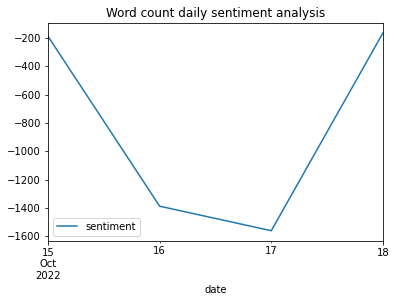

In [46]:
centiment_graph("daily", "Word count", count_lSentiment)

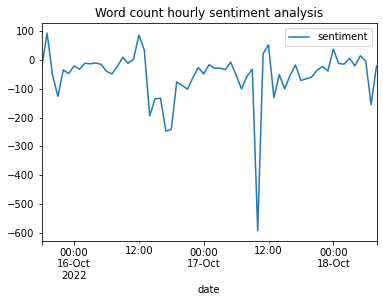

In [47]:
centiment_graph("hourly", "Word count", count_lSentiment)

In [48]:
vader_lSentiment = vaderSentimentAnalysis()

deeper, nobodi, land, writer, experienc, delus, hoist, …, consequ, ..., head, suppos, backpack, telegraph, ani
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
uk, domin, financee, restor, …, fiscal, c, labour, face, credibl, mean, first
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
estim, growth, 32bn, chang, worth, around, £, tax, p, …, cost, year, polici, final, plan
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.5423, 
stamp, growth, except, tax, chancellor, duti, recent, hunt, jeremy, reversee, governmentment, measurment, announcment, almost, plan
neg: 0.0, neu: 0.843, pos: 0.157, compound: 0.3818, 
shine, stock, european, higher, publici, tax, u, k, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, parti, tori, …, dead

uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stabber, track, tax, …, rubbish, cut, msm, back, opposit, made
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
cut, warn, scari, tax, u-turn, spend
neg: 0.467, neu: 0.533, pos: 0.0, compound: -0.3612, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, chang, blunt, …, troubl, result, huge, fundament, right, governmentment, economyyyi, address
neg: 0.0, neu: 0.827, pos: 0.173, compound: 0.3182, 
question, independ, tax, answer, …, hard, “, get, spend, length, currenc, trade, mention
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
high, …, signal, two-week, near, bank, england, delay, pound, sale, bond
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
turn, water, 

possibl, nurs, uk, befor, £, janitor, tax, month, band, citizen, even, paid, get, non, much, pay
neg: 0.091, neu: 0.909, pos: 0.0, compound: -0.1027, 
common, grill, truss, swerv, kwasi, graham, bradi, kwarteng, liz
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
swipe, landlord, ”, labour, rich, benefit, tax, “, cut
neg: 0.165, neu: 0.315, pos: 0.52, compound: 0.6705, 
uk, tax, chancellor, near, hunt, pm, jeremy, week, cut, humili, announcment, scrap, matter, exchequ, truss, plan
neg: 0.122, neu: 0.814, pos: 0.064, compound: -0.25, 
uk, growth, love, tax, got, way, imf, degrad, outloo

b, parti, fantasi, …, project, money, spent, snp, time, document, public, servant, whi, civil, noth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, fast, move, best, fella
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
question, morn, monday, …, hunt, said, announcment, whi, friday, made, polici, bigger
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
play, respond, countri, uk, growth, premium, brexit, economyyy, tax, borrow, basic, case, simpli, fundament, n

stabber, track, tax, …, rubbish, cut, msm, back, opposit, made
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
would, link, check, team, call, rob, advis
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.5574, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, battl, liz, stay, …, afford, cannot, mistak, prime, said, make, 🔻, ”, “, ani, mo, truss, tuesday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
n

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
respons, emerg, statement, tax, chancellor, –, head
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, stock, uk, dick, liquid, hatr, tax, wipe, work, wealthi, billionair, good, hard, wealth, rest, drive, success, inflat, market, uninform, plung, people, avoid, quiet, veri, away
neg: 0.188, neu: 0.545, pos: 0.267, compound: 0.5994, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
want, economyyy, tax, age, took, enough, mini, common, time, rise, crap, fr, budget, sens, fill, pocket, understand
neg: 0.138, neu: 0.794, pos: 0.069, compound: -0.3182, 
high, uk, growth, effort, given, brexit, tax, hopeless, recent, cost, help, decad, communic, product, cut, 

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
fuel, tax, poverti, accord, heat, could, world, report, end, hike, global, richest, time, oxfam, rich, annual, four, people, incomee, eat
neg: 0.0, neu: 0.72, pos: 0.28, compound: 0.7906, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.3612, 
creativ, 840,000, babi, patriss, …, father, brother, founder, paid, se, cullor, 970,000, servic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, water, …, run, arsonist, even, back, bu

uk, provid, qua, tax, news, system, …, hear, restructur, help, need, sky, decent, radic, mess
neg: 0.145, neu: 0.698, pos: 0.157, compound: 0.0516, 
scrap, shop, press, chancellor, vat-fre, reform
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corpo

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
turn, water, …, run, arsonist, even, back, bucket, build, burn, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wage, uk, live, major, excel, tori, stop, vaniti, tax, pie, benefit, expens, rail, often, mistak, good, sharehold, let, nhs, public, scheme, people, use, pay, servic, eat
neg: 0.107, neu: 0.627, pos: 0.266, compound: 0.743, 
mortgag, …, give, late, money, repay, mistak, rise, back, bloodi, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, issu, tax, news, –
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …,

enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
uk, lower, because, tax, set, access, ireland, cut, whi, eu, would, rate, ani, corporateate, market, much, company
neg: 0.223, neu: 0.777, pos: 0.0, compound: -0.5106, 
economyyyist, …, group, direct, inher, comment, polit, link, institut
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alreadi, uk, tax, levi, …, total, profit, take, extra, done
neg: 0.0, neu: 0.734, pos: 0.266, compound: 0.4404, 
secretari, general, uk, major, stash, tax, rees-mogg, money.even, re-elect, elect, busy, constitu, million, people, oversea, next, pay, jacob
neg: 0.076, neu: 0.924, pos: 0.0, compound: -0.1027, 
hunt, hate, simpli, pension, pay, tax, warn, nightmarish, million
neg: 0.52, neu: 0.48, pos: 0.0, compound: -0.6705, 
real-term, exp

uk, tax, clear, follow, nairobi, ranger, commiss, order, price, import, agent, 25,000, inclus, ford, deal, 4,453, cash, wildtrak, avail, eta, best, ksh, day
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.7783, 
migrant, tori, economyyy, …, give, illig, governmentment, crimin, million, billion, pay, day
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
neg: 0.19, neu: 0.584, pos: 0.226, compound: 0.128, 
uk, tax, clear, follow, nairobi, ranger, commiss, order, price, import, agent, 25,000, inclus, ford, deal, 4,453, cash, wildtrak, avail, eta, best, ksh, day
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.7783, 
us, root, need, say, cnflict, altern, viabl, i'm, forc, properti, day, moan, right, righ, understand, someth, follow, help, night, wrong, good, physic
neg: 0.166, neu: 0.636, pos: 0.198, compound: 0.2263, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, ne

fewer, 32bn, minut, £, commit, tax, liz, restor, financee, space, hunt, six, jeremy, attempt, cut, stabil, process, axe, five-and-a-half, u-turn, truss
neg: 0.154, neu: 0.749, pos: 0.097, compound: -0.0772, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
4p, vow, take, bbc, sunak, tax, rishi, incomee, news
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, job, …, boost, touri, product, amaz, success, scottish, scotch, icon, scotland, invest
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.7506, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, job, …, boost, touri, product, amaz, success, scottish, scotch, icon, scotland, invest
neg: 0.0, 

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, offset, stop, loophol, tax, amazon, realli, loss, et, close, care, billion, al, like, leav
neg: 0.205, neu: 0.457, pos: 0.338, compound: 0.4404, 
uk, £, tax, compar, product, good, price, import, ngl, american, due
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.4404, 
live, market, financee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hunt, bbc, newspap, take, astound, headlin, charg, u-turn, tax, news
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.4019, 
uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.3612, 
tax, ghost, power, liz, biggest, hold, paper, hunt, pm, vs, new, hike, cut, guardian, say, ‘, year, truss
neg: 0.227, neu: 0.773, pos: 0.0, compound: -0.5267, 
ta, uk, turn, because, tax, goldman, si

ministerer, uk, tax, liz, hunt, daili, jeremy, finance, new, reversee, ‘, almost, truss, plan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, nobodi, land, writer, experienc, delus, hoist, …, consequ, ..., head, suppos, backpack, telegraph, ani
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, tax, warn, difficult, …, hunt, jeremy, finance, increas, lay, cut, spend, like, decis
neg: 0.324, neu: 0.541, pos: 0.135, compound: -0.3612, 
uk, employ, £, …, 141,005, combin, 🇮, 54.4, indian, billion, people, revenu, 🇳
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk

uk, tax, chancellor, 他将无限期推迟削减所得税, …, 英国新任财政大臣取消了大部分减税措施, http, new, cut, axe, 。, ，, 杰里米-亨特将推翻政府最近的小型预算中宣布的几乎所有减税措施, 直到国家财政状况改善
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.3612, 
say, ministerer, zone, invest, check, work, labour, low-tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spot
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
impress, true
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.6908, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
biden, believ, joe
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, ministerer, zone, invest, check, work, labour, low-tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, ministerer, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
plan, uk, caus, economyyy, america, min, …, new, reversee, prime, chief, disast, treasuri, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus
neg: 0.279, neu: 0.519, pos: 0.201, compound: -0.296, 
hunt, take, newspap, bbc, news, astound, headlin, charg, u-turn, tax
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.4019, 
share, treasuri, tax, k, news, …, near, nbc, cut, governmentment, andi, scrap, chief, thank, u, vermaut, plan
neg: 0.118, neu: 0.618, pos: 0.264, compound: 0.3818, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus
neg: 0.279, neu: 0.519, pos: 0.201, compound: -0.296, 
mini-budget, question, liz, …, hunt, jeremy, reversee, common, penni, face, mordaunt, place, truss, send
neg: 0

household, tax, corrupt, …, cobbler, desper, cut, governmentmentm, “, ”, non
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
ministerer, plan, drop, tax-cut, finance, u, new, almost, k
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.2732, 
ministerer, plan, drop, tax-cut, finance, u, new, almost, k
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.2732, 
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hunt, take, newspap, astound, headlin, charg, u-turn, tax
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.4019, 
uk, tax, clear, follow, nairobi, ranger, commiss, order, price, import, agent, 25,000, inclus, ford, deal, 4,453, cash, wildtrak, avail, eta, best, ksh, day
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.7783, 
ministerer, pace, uk, remov, turn, tax, plot, liz, news, cut, governmentment, right, 😱, prime, globalist, truss, gather
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.2732, 
thoug

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, because, tax, moan, choic, fund, govt, onli, consequ, head, good, cut, make, public, thatcher, made, poor, sinc, servic, poorer, proper, know
neg: 0.318, neu: 0.582, pos: 0.099, compound: -0.6597, 
publish, stock, uk, 18/10, surg, tax, u-turn, themarketheraldcomau, asx, updat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, obvious, tax, dream, brown, onli, low, toward, libertarian, governmentment, particular, take, moment, extrem, recal, year, yes, gradual
neg: 0.089, neu: 0.633, pos: 0.278, compound: 0.5423, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, china, tax, depart, credit, today, gdp, suiss, shelv, need, cut, investment-bank, chief, delay, data, releas, know
neg: 0.21, neu: 0.667, pos: 0.124, compound: -0.2023, 


नई, में, ब्रिटेन, आ, रही, कुर्सी, ।, प्रधानमंत्री, खतरे, नजर, है, की
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
…
neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
ministerer, cover, uk, newspap, tax, chancellor, liz, domin, front, page, centr, hunt, jeremy, ..., reversee, cut, prime, take, surviv, truss, stagechancellor, fight
neg: 0.19, neu: 0.81, pos: 0.0, compound: -0.5719, 
cap, £, tax, chancellor, liz, hunt, pm, energy, jeremy, hammer, style, reversee, end, cut, say, announcment, de, take, budget, april, hail, truss, two-year, 32billion, bill, covid-era, facto
neg: 0.074, neu: 0.807, pos: 0.119, compound: 0.0772, 
insight, uk, us, propos, global-market, tax, …, follow, result, reversee, surg, n, bank, market
neg: 0.0,

mini-budget, bbc, top, tax, chancellor, set, liz, news, new, measurment, see, spend, truss, stori
neg: 0.0, neu: 0.878, pos: 0.122, compound: 0.2023, 
mini-budget, bbc, top, tax, chancellor, set, liz, news, botfe, new, measurment, see, spend, truss, stori
neg: 0.0, neu: 0.886, pos: 0.114, compound: 0.2023, 
absoluta, en, uk, la, major, ventaja, convocó, pierd, sacó, tax, casi, año, paí, punto, dos, eleccion, echaron, esto, que, decir, peor, encuesta, quier, hay, poll, las, mayoría, nada, propuso, de, thatcher, ser, cuando, despué, parecida, con, llegaron, may
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
debt-fuel, tax, monday, avert, month, fresh, …, cut, governmentment, chao, axe, last, almost, british, market, unveil
neg: 0.281, neu: 0.595, pos: 0.124, compound: -0.2263, 
governmentment, plan, near, scrap, exchequ, tax, chancellor, cut
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
debt-fuel, tax, monday, avert, month, fresh, …, cut, governmentment, chao, axe, last, almost, b

call, imf, …, atom, govt, dure, –, risk, particular, instant, “, ani, materi, polici, happen, whatev
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
per, deeper, uk, sach, recess, see, gs, tax, u-turn, goldman, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stamp, duti, calcul, link
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mortgag, uk, 28k, befor, top, £, tax, keep, less, cost, increas, time, food, util, full, earn, worker
neg: 0.0, neu: 0.893, pos: 0.107, compound: 0.2023, 
consul, uk, shutdown, stop, free, tax, ccp, work, cost, marathon, good, global, summari, student, protest, solut, fight, visa, company, prc
neg: 0.243, neu: 0.536, pos: 0.221, compound: 0.1027, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2

neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
plan, uk, caus, economyyy, america, min, …, new, reversee, prime, chief, disast, treasuri, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alreadi, £, …, cost, kill, economyyyi, nonsens, figur, far, ir35, billion, contract
neg: 0.343, neu: 0.657, pos: 0.0, compound: -0.6908, 
growth, …, rash, huge, wherea, cut, governmentment, dece, public, extrem, irrespons, spend, bad, invest
neg: 0.392, neu: 0.377, pos: 0.231, compound: -0.5267, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
say, ministerer, zone, invest, check, work, labour, low-tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, ministerer, zone, invest, check, work, labour, low-tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estat

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
tax, debt, paul, paper, …, interest, good, public, creat, tension, polici, central, tucker, veri, burden, qe
neg: 0.326, neu: 0.424, pos: 0.25, compound: -0.2023, 
countri, uk, covid, £, pl, chequ, …, g7, blank, governmentment, measurment, write, billion, spend, 2020-2022
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
jan, uk, befor, came, brexit, tax, implement, mmhhh, seem, offshor, new, ..., wonder, forget, take, scheme, whi, join, eu, rule, first, ref, go, avoid, mention, never
neg: 0.14, neu: 0.785, pos: 0.075, compound: -0.2263, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos:

plan, want, kwarteng, tax, …, corporateateat, reversee, raise, sunak, rishi, germani, corporateate, truss
neg: 0.0, neu: 0.894, pos: 0.106, compound: 0.0772, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, call, tax, ban, open, credit, support, commiss, belong, chariti, end, take, nam, anim, freeli, rule, non, link, petit, purpos, debat, test
neg: 0.129, neu: 0.681, pos: 0.19, compound: 0.1779, 
):, advic, scream, hold, sound, yell, principl, john, carri, kasich, believ, leader, cave, truss, ms, pick, plan, loudest, true
neg: 0.226, neu: 0.658, pos: 0.115, compound: -0.4019, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, unemploy, uk,

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, urg, liz, …, laugh, mps, detain, common, say, prime, penni, mordaunt, leader, opposit, truss, hous, jeer
neg: 0.137, neu: 0.686, pos: 0.176, compound: 0.2023, 
alreadi, uk, want, issu, tax, basic, known, limit, raise, control, rate, stuff, scotland, revenu, incomee, debat
neg: 0.0, neu: 0.92, pos: 0.08, compound: 0.0772, 
lol, uk, tori, tax, reaction, nation, cut, taxi, see, despit, unfund, plan, watch, deliv
neg: 0.124, neu: 0.71, pos: 0.166, compound: 0.1779, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
plan, uk, brexit, economyyy, tax, shred, show, hunt, jeremy, horror, asto

mini-budget, bbc, tax, chancellor, set, liz, news, new, noticia, measurment, see, spend, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cover, excus, uk, cobham, expand, tax, circus, anywher, motorway, move, built, can't, station, plenti, opex, soon, room, cash, payer, dri, poor, servic, busyest
neg: 0.117, neu: 0.795, pos: 0.087, compound: -0.2023, 
uk, parti, tori, …, dead, proud, take, 205,000, done, pennymordaunt, virus
neg: 0.279, neu: 0.519, pos: 0.201, compound: -0.296, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
call, reform, …, recent, retain, today, announcment, ciot, rule, ir35, comment, press, releas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
ministerer, uk, tax, liz, hunt, daili, jeremy, finance, new, revers

yea, tax, power, …, exact, vote, snp, document, payer, sure, deliv
neg: 0.0, neu: 0.796, pos: 0.204, compound: 0.3182, 
escal, strike, commit, …, energy, price, join, moment, truss, bill, fight
neg: 0.263, neu: 0.321, pos: 0.417, compound: 0.34, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, absolut, uncompetit, uk, growth, jez, tori, china, throbber, tax, banker, keep, charg, globalist, cheerlead, gone, polici, blairit
neg: 0.0, neu: 0.751, pos: 0.249, compound: 0.6486, 
uk, market, bulk, septemb, tax-cut, packag, calm, reversee
neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.3182, 
uk, us, tax, meanwhil, wealthi, increas, reversee, cut, recess, creat, trump-lik, bottom, like, sinc, trumptax
neg: 0.119, neu: 0.739, pos: 0.142, comp

ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, live, tax, less, well, reach, 3k, even, home, take, salari, usd, nice, henc, pound, manag, senior, comfort, spend, 750k, sometim, pleas, bank, yes, poor, veri, save
neg: 0.115, neu: 0.536, pos: 0.349, compound: 0.8284, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, l

9.9, payment, explor, relief, £, tax, analysi, decommiss, cost, oecd, new, product, toward, receivee, data, billion, claim, 3.7, company
neg: 0.0, neu: 0.846, pos: 0.154, compound: 0.4767, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
because, clear, unabl, finish, public, rich, see, whi, care, harm, first, put, done
neg: 0.16, neu: 0.411, pos: 0.429, compound: 0.7096, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
neg: 0.19, neu: 0.584, pos: 0.226, compound: 0.128, 
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
insid, nigel, …, realli, knowledg, ..., time, expos, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cut, warn, scari, tax, u-turn, spend
neg: 0.467, neu: 0.533, pos: 0.0, compound: -0.3612, 
conserv, …, lizbot, unemploy, soon, mps, guarante, hundr
neg: 0.0, neu: 1.0, pos: 0.0, com

neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
high, lol, wage, think, uk, tax, god, liz, i'm, bring, low, cut, economyyyi, raise, whi, would, go
neg: 0.19, neu: 0.588, pos: 0.222, compound: 0.1779, 
uk, tax, chancellor, …, hunt, jeremy, new, reversee, measurment, announcment, 自分舐めたクチきいてすみませんでした, sept, almost, ハントさん, 、
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, debt, paul, paper, …, interest, good, public, creat, tension, polici, central, tucker, veri, burden, qe
neg: 0.326, neu: 0.424, pos: 0.25, compound: -0.2023, 
live, truss, fast, go, chang, economyyy, apologis, ‘, liz, far, –
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, remoan, growth, tax, …, mps, low, mistak, make, u-turn, budget, forc, wi
neg: 0.143, neu: 0.68, pos: 0.177, compound: 0.128, 
almost, hunt, truss, measurment, jeremy, bbc, tax, chancellor, new, liz, news, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0

play, think, tax, …, fast, higher, sunak, would, truss, johnson, burden
neg: 0.218, neu: 0.602, pos: 0.18, compound: -0.128, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
governmentment, cut, plan, near, chief, scrap, tax, u, treasuri, k
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
tax, debt, paul, paper, …, interest, good, public, creat, tension, polici, central, tucker, veri, burden, qe
neg: 0.326, neu: 0.424, pos: 0.25, compound: -0.2023, 
tax, chancellor, …, hunt, jeremy, must, new, windfal, take, scrap, eye-wat, ‘, difficulti, rule, decis
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, com

neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fast, go, chang, economyyy, twerp, ‘, apologis, far, –, pathet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stock, uk, £, liz, wipe, least, …, valu, combin, billion, market, sinc, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
investor, uk, emplo

truth, uk, covid, siphon, beckon, tax, stay, hancock, money, probabl, cos, cum, satellit, whi, lot, bankrupt, payer, johnson, much, jail, era, company, stolen
neg: 0.234, neu: 0.687, pos: 0.079, compound: -0.6705, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
enterpris, halligan, tax, …, 1000s, medium-s, rise, small, corporateate, disastr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cover, general, uk, tori, tax, debt, seem, come, huge, elect, strang, rich, deficit, ever, year, awar, payer, spring, next, win, statement, burden, auster, escap
neg: 0.226, neu: 0.503, pos: 0.271, compound: 0.3818, 
look, share, pub, slam, tax, feel, duti, hunt, energy, jeremy, increas, price, let, scrap, freez, lockdownr, massiv, beer, get, alcohol, 4the, struggl, fair, pay, super-rich, away
neg: 0.127, neu: 0.665, pos: 0.209, compound: 0.3818, 
absolut, uk, tax, p, …, burden, shite, grown, highest

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
countri, uk, us, major, tax, hope, time, spend, payer, pocket, go, pay, deep, 💰
neg: 0.092, neu: 0.719, pos: 0.19, compound: 0.3612, 
原文地址, 杰里米-亨特加速推进税收计划, acceler, tax, hunt, jeremy, new, price, york, time, rise, pound, british, ，, plan, bond, 英镑和债券价格上涨
neg: 0.0, neu: 1.0,

uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
cap, tax, got, hunt, energy, jeremy, f, cut, price, cker, scrap, go, incomee
neg: 0.148, neu: 0.704, pos: 0.148, compound: 0.0, 
wound, intern, lanc, economyyy, tax, clear, …, grasp, labor, cut, bin, moment, thi, c'ti, stage
neg: 0.126, neu: 0.719, pos: 0.156, compound: 0.128, 
uk, hunt, despit, budget, tax, u-turn, face, tough, still, choic, analysi
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.128, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
parti, tori, tax, l

neg: 0.082, neu: 0.706, pos: 0.212, compound: 0.4939, 
ministerer, wave, chancellor, liz, goodby, …, jerem, mps, dure, prime, common, gone, opposit, truss, hous, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, subsidi, economyyy, monday, liz, energy, finance, new, prime, scale, back, scrap, vast, truss, read, plan
neg: 0.0, neu: 0.877, pos: 0.123, compound: 0.2732, 
busy, green, stock, wall, close, week, earn, street, start, anoth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, remov, foreign, privileg, tax, pm, money, onli, represent, join, ongo, europ, ani, polit, payer, proport, officee, leav, donor
neg: 0.0, neu: 0.891, pos: 0.109, compound: 0.296, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
employ, call, reform, review, recen

lockdown, uk, intend, effort, worth, navig, brexit, tax, yrs, crippl, consist, run, cost, increas, start, busy, spent, ..., sacrific, requir, small, oblig, inflat, made, debas, farc, suppli, currenc
neg: 0.0, neu: 0.934, pos: 0.066, compound: 0.2263, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
ministerer, uk, top, tax, liz, …, hunt, pm, jeremy, today, world, finance, headlin, new, cut, pm-kis, inaugur, scrap, modi, 🔷, truss
neg: 0.1, neu: 0.813, pos: 0.086, compound: -0.0772, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, po

tori, …, pleasant, surpris, exult, mps, robust, see, tim, fashion, get, ani, stanley, technocrat, final
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.6908, 
mini-budget, tax, set, …, hunt, jeremy, 🔴, new, reversee, cut, announcment, almost
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
us, destroy, …, biden, consid, world, sourc, humili, economyyyi, joe, abysm, com, eye
neg: 0.241, neu: 0.759, pos: 0.0, compound: -0.5423, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
stabber, track, tax, …, rubbish, cut, msm, back, opposit, made
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
ministerer, uk, registration,

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, …, reconcili, perc, instant, card, announcment, immin, irrespect, eu, plan, publiic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
yr, …, imagin, need, say, anyon, tweet, see, idiot
neg: 0.32, neu: 0.68, pos: 0.0, compound: -0.5106, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
us, cabal, c, ..., h, unt, consign, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, tax, …, today, reversee, governmentment, measurment, announcment, almost, aff, statement
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
hunt, well, done
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
learn, us, 60k, parti, tax, half, £, owe, thier, charg, 10p, need, em, say, recogni

neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.6124, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
tax, system, …, problem, hazard, moral, impoverish, scam, bank, polit, payer, poor
neg: 0.543, neu: 0.457, pos: 0.0, compound: -0.8591, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
yr, …, imagin, need, say, anyon, tweet, see, idiot
neg: 0.32, neu: 0.68, pos: 0.0, compound: -0.5106, 
investor, ministerer, uk, growth, liz, cuttin, …, hunt, jeremy, sooth, finance, new, reversee, prime, “, ”, truss, p

mini-budget, thrown, tax, financee, septemb, huge, turmoil, cut, governmentment, say, without, promis, would, market, pay
neg: 0.311, neu: 0.57, pos: 0.119, compound: -0.4019, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
set, …, medium-term, hunt, jeremy, bring, governmentment, wei, measurment, cui, forward, plan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fed, uk, tax, …, allow, gb, hotel, put, payer, we'r, cloth
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.2263, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate,

neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
debt-fuel, tax, avert, fresh, pm, chao, cut, axe, embattl, humili, almost, market, climbdown
neg: 0.315, neu: 0.545, pos: 0.139, compound: -0.2263, 
large-cap, stock, uk, us, share, overal, tax, tech, equiti, help, today, earn, strength, reversee, across, quarter, higher, gain, lift, bank, market, polici, trade, aapl, company, sector, amid
neg: 0.0, neu: 0.667, pos: 0.333, c

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.156, neu: 0.688, pos: 0.156, compound: 0.0, 
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.4215, 
ministerer, uk, registration, rees-mogg, …, move, dublin, busy, ️jacob, ◾, al, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, p

tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
uk, hunt, share, gain, tax, u-turn, hold, reut_r
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.6808, 
uk, relat, tax, compar, reduct, hilari, number, claim, drop, revenu, larg, base, veri
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
countri, pandem, earner, help, tax, increas, need, highest
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.4019, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
🍳, uk, 🍗, bp, 🍇, call, tax, 🥙, eight, biggest, 🍑, profit, 🍍, 🍫, 🍪, 🍐, 🥩, 🥨, reject, 🍓, 🍿, 🍈, windfal, 🍖, 🥓, 🍤, 🍊, 🍎, 🍩, 🥚, year, 🍬, 🥑, 🍒
neg: 0.199, neu: 0.588, pos: 0.213, compound: 0.0516, 
uk, independ, tax, …, could, cut, rest, rise, public, higher, face, spend, bigger, scotland
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.7

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stock, retreat, uk, wall, welcom, street, tax, surg
neg: 0.0, neu: 0.795, pos: 0.205, compound: 0.2023, 
stock, retreat, uk, wall, welcom, street, tax, surg
neg: 0.0, neu: 0.795, pos: 0.205, compound: 0.2023, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
gmt, mon, call, tax, independ, 18:29, biden, mistak, cut, say, oct, truss, white, hous, regret
neg: 0.274, neu: 0.726, pos: 0.0, compound: -0.5994, 
live, flagship, admit, tax, apart, liz, voter, hunt, jeremy, lead, need, –, mistak, fear, say, poll, labour, eye-wat, ‘, spend, would, made, polici, truss, go, steal, decis
neg: 0.209, neu: 0.68

stock, retreat, uk, wall, welcom, street, tax, surg
neg: 0.0, neu: 0.795, pos: 0.205, compound: 0.2023, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
high, uk, lower, tax, independ, 1st, follow, decad, slight, increas, need, cut, rest, make, onshor, level, public, higher, mean, would, spend, like, bigger, revenu, much, scotland
neg: 0.144, neu: 0.772, pos: 0.084, compound: -0.2023, 
complet, tax, got, …, profit, corp, big, wrong, mistak, extra, u-turn, pay
neg: 0.292, neu: 0.519, pos: 0.188, compound: -0.1531, 
uk, way, …, kind, thought, hole, see, genuin, greec, never, long, still
neg: 0.0, neu: 0.746, pos: 0.254, compound: 0.5267, 
uk, cap, lower, reduc, …, energy, today, fallen, price, governmentment, exposur, far, gas, natur


prime, ministerer, axe, liz, uk, humili, truss-busy, journal, ‘, tax, budget, almost, cut
neg: 0.243, neu: 0.757, pos: 0.0, compound: -0.2975, 
push, lol, uk, tax, least, exercis, simpli, broken, alway, punish, economyyyi, get, control, spend, currenc, poor, unfund, europ, break
neg: 0.35, neu: 0.547, pos: 0.102, compound: -0.7783, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
neg: 0.19, neu: 0.584, pos: 0.226, compound: 0.128, 
mini-budget, hunt, jeremy, tax, almost, reversee, cut
neg: 0.233, neu: 0.767, pos: 0.0, compound: -0.2075, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg:

neg: 0.204, neu: 0.681, pos: 0.115, compound: -0.3612, 
alreadi, uk, ar, tax, …, profit, region, billion, pay
neg: 0.136, neu: 0.583, pos: 0.282, compound: 0.3612, 
affect, tax, …, energy, money, governmentment, economyyyi, u-turn, bill, latest, incomee
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
growth, side, tax, aim, set, defend, reform, e, favour, case, well, deregul, evidenc, enough, cut, risk, argument, public, achiev, spend, mean, suppli, fair, potenti
neg: 0.206, neu: 0.491, pos: 0.304, compound: 0.4939, 
ago, ministerer, uk, tax, …, gov't, near, hunt, jeremy, week, finance, reversee, cut, announcment, plan
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
masterstrok, uk, g, tax, €, 

staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, tax, chancellor, liz, …, hunt, doe, reversee, cut, promis, remain, mani, polici, truss, initi
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
creativ, 840,000, babi, patriss, …, father, brother, founder, paid, se, cullor, 970,000, servic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, t

approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, ploy, tax, freebi, simpli, vote, scottish, payer, yes, pay
neg: 0.116, neu: 0.661, pos: 0.223, compound: 0.3182, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
farmer, law, uk, approv, except, foreign, tax, insur, obey, k, permiss, fund, …, enter, resid, arriv, custom, support, return, promis, ticket, food, proof, u, respect, grow, medic, mean, corporateate, ceas, pay, themselv
neg: 0.042, neu: 0.783, pos: 0.175, compound: 0.6597, 
🍯, 🍳, plan, uk, sh

neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
high, lower, ⁩, tax, independ, ⁦, slight, increas, need, cut, make, onshor, level, public, higher, “, ”, spend, mean, would, like, bigger, scotland, much, revenu
neg: 0.173, neu: 0.726, pos: 0.101, compound: -0.2023, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, tax, chancellor, …, dividend, hunt, work, reversee, payrol, cut, proceed, rate, longer
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
common, plan, swath, hunt, growth, jeremy, scrap, explain, disastr, ‘
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.3818, 
uk, tax, anoth, chancellor, set, follow, interest, n, thread, make, announcment, forward, spend, respons, polit, put, larg, niesr, day
neg: 0.0, neu: 0.85, pos: 0.15, compound: 0.4588, 
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.75

neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
uk, voodoo, bush, economyyy, packag, total, trickl, w, pm, near, georg, reversee, fact, h, last, humili, ‘, year, conclud, ”, “, vindic, market, polit, truss, doublespeak
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parlour, biden, uk, pm, foreign, interfer, criticis, ice-cream, diplomat, tax, blunder, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
tender, tomorrow, …, htt, resign, wonder, time, effect, see, king
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.34, 
refus, mortgag, live, premium, tori, tax, hunt, jeremy, –, say, windfal, labour, ‘, year, rule, people, pay
neg: 0.091, neu: 0.909, pos: 0.0, compound: -0.1027, 
asset, uk, delegitim, also, wholli, predecessor, tax, chancellor, rane, liz, borrow, intellig, ralli, reduc, hunt, cost, new, reversee, governmentment, risk, measurment, premiership, pound

ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, …, bear, mind, abandon, even, 45p, make, measurment, recess, regard, corporateate
neg: 0.209, neu: 0.791, pos: 0.0, compound: -0.4404, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
call, council, tax, …, help, low, wigan, make, receivee, qualifi, claim, pay, 💛, incomee, may
neg: 0.216, neu: 0.617, pos: 0.167, compound: 0.0516, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
uk, tax, chancell

neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
growth, record, parti, employ, job, …, g7, hunt, tell, f, new, data, first, porki, stuff, heard
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.3818, 
exact, benjamin
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
high, remoan, growth, tax, …, mps, low, mistak, make, u-turn, budget, forc, wi
neg: 0.143, neu: 0.68, pos: 0.177, compound: 0.128, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, uk, hunt, energy, scrap, finance, tax, support, new, rein, cut
neg: 0.141, neu: 0.537, pos: 0.322, compound: 0.4019, 
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incom

zahawi, affair, nadhim, tax, investig, hmrc, report, accord
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
complet, uk, humili, pm, scrap, tax, almost, agenda
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, wave, tax, chancellor, anoth, liz, hunt, work, doe, ..., reversee, cut, say, promis, embark, public, remain, mani, massiv, mean, british, polici, truss, initi, they'r, plan, auster, know
neg: 0.072, neu: 0.928, pos: 0.0, compound: -0.2732, 
uk, tax, …, bear, mind, abandon, even, 45p, make, measurment, recess, regard, corporateate
neg: 0.209, neu: 0.791, pos: 0.0, compound: -0.4404, 
tori, …, hunt, jeremy, reev, cut, rachel, labour, economyyyi, crash, no-on, spend, ask, fo, talk, —
neg: 0.286, neu: 0.71

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, tax, clear, follow, nairobi, ranger, commiss, order, price, import, agent, 25,000, inclus, ford, deal, 4,453, cash, wildtrak, avail, eta, best, ksh, day
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.7783, 
bnb, swap, back, mp, tax, ..
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, mortgag, live, premium, tori, tax, hunt, –, say, windfal, labour, ‘, year, rule, people, pay
neg: 0.097, neu: 0.903, pos: 0.0, compound: -0.1027, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
seen, like, economyyyi, anyth, independ, never, report, year
neg: 0.0, neu: 0.737, pos: 0.263, compound: 0.3612, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
growth, record, parti, e

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
general, sir, …, help, rocco, elec, last, tycoon, bankrol, hotel, conserv, multi-millionair, fort
neg: 0.0, neu: 0.803, pos: 0.197, compound: 0.4019, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
common, mini-budget, hunt, rise, jeremy, tax, hint, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
governmentment, april, bill, support, end
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.4019, 
common, mini-budget, hunt, rise, jeremy, tax, hint, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
cover, swap, payment, safu, ️, fiat, tax, nft, protocol, websit, 0/0, on-ramp, project, farm, 🟪, ticket, stake, 🧑, qroniswap, ⬜, crypto, 🛎, 💻, cross-chain, ecosystem, telegram, defi, trade, ‍
neg: 0.0, neu: 1.0, pos: 

mini-budget, uk, live, evid, …, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis
neg: 0.202, neu: 0.798, pos: 0.0, compound: -0.5106, 
ministerer, remov, kwasi, kwarteng, economyyy, goldman, liz, …, sach, outlook, britain, prime, analyst, truss, downgrad
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
investor, ministerer, uk, growth, liz, …, hunt, jeremy, sooth, finance, reversee, ‘, truss, plan, watch
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.3818, 
ministerer, uk, hunt, energy, jeremy, finance, tax, support, plan, new, rein, reversee
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.5859, 
uk, cap, lower, reduc, …, energy, today, fallen, price, governmentment, exposur, far, gas, natur
neg: 0.28, neu: 0.595, pos: 0.125, compound: -0.3818, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
john, make, pm, tori, well, sunak, might, stage, rishi, rentoul


countri, us, want, independ, tax, …, imagin, take, england, condit, scotland, union
neg: 0.0, neu: 0.885, pos: 0.115, compound: 0.0772, 
refus, uk, funni, call, tax, …, biden, problem, economyyyi, joe, yet, massiv, acknowledg, plan, still
neg: 0.172, neu: 0.828, pos: 0.0, compound: -0.4019, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
cover, swap, payment, safu, ️, fiat, tax, nft, protocol, websit, 0/0, on-ramp, project, farm, 🟪, ticket, stake, 🧑, qroniswap, ⬜, crypto, 🛎, 💻, cross-chain, ecosystem, telegram, defi, trade, ‍
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
phase, suffer, uk, u

neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
governmentment, tax, u-turn, panic, evid
neg: 0.452, neu: 0.548, pos: 0.0, compound: -0.5106, 
john, everyon, know, tax, u-turn, come, parliament, rentoul, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, issu, mental, breakdown, …, howev, citizen, hundr, nervous, thousand, worri, veri
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tab, fuel, felt, tax, terri, keep, month, largest, shrink, 6th, interest, increas, recess, economyyyi, score, ra

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, rip, controversi, economyyy, tax, liz, left, …, hunt, jeremy, c, cut, prime, scrap, truss, program
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
uk, cautious, tax, chancellor, way, discourag, …, hunt, noth, must, invest, company
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.1027, 
came, rava, …, hunt, back, osborn, public, year, servic, fall, invest, auster
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu:

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, tax, chancellor, liz, …, hunt, jeremy, mini-bu, reversee, cut, announcment, almost, friday, appoint, truss, full
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
️, tax, way, …, give, busy, talk, cut, size, nhs, state, pragmat, ✍, educ, plan
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
mini-budget, uk, assault, regenc, tax, ban, airstrik, gardaí, father, consid, player, 🔴, governmentment, alleg, measurment, evict, scrap, russian, kyiv, investig, 9s, hotel, almost, 5:30, gaa, shoot, role, son, jail
neg: 0.276, neu: 0.724, pos: 0.0, compound: -0.8603, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
sport, tax, mot, …, histor, spartan, need, <--, sale, classic, car, triumph, base
neg: 0.0, neu: 0.78, pos: 0.22, comp

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
subsidi, uk, tax, power, bln, hunt, limit, say, raise, pound
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
turn, chang, suggest, tax, evid, realli, sugar, respect, led, polici, subject, influenc, gather
neg: 0.0, neu: 0.795, pos: 0.205, compound: 0.4767, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
मुकाबले, नए, भरोसा, में, बाजारों, दोनों, ब्रिटेन, निवेशकों, फैसले, बाद, यूरो, मंत्री, पाउंड, लौटा, तेजी, वित्त, के, और, डॉलर, आई, का
neg: 0.

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
provid, economyyy, advic, council, chancellor, independ, …, hunt, jeremy, new, announcment, expert, advisori, creation
neg: 0.0, neu: 0.851, pos: 0.149, compound: 0.2732, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
us, brexit, tax, left, revis, scrutini, hunt, interest, well, offshor, lay, account, budget, eu, far, wors, bank, bare, escap
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.6249, 
ministerer, wave, chancellor, liz, goodby, …, jerem, mps, dure, prime, common, gone, opposit, truss, hous, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, wave, chancellor, liz, goodby, …, jerem,

lockdown, growth, record, covid, parti, employ, job, distort, post-brexit, g7, hunt, tell, problem, ala, new, mask, low, fake, labour, shortag, data, first, porki, stuff, pandem, heard, serious
neg: 0.328, neu: 0.598, pos: 0.074, compound: -0.7845, 
respond, prioritis, highlight, want, tax, chancellor, campbell-william, busy, head, governmentment, karen, see, leader, emerg, statement
neg: 0.0, neu: 0.778, pos: 0.222, compound: 0.4019, 
tori, tax, …, add, hunt, rise, announcment, number, friday, tru, con, auster
neg: 0.0, neu: 0.885, pos: 0.115, compound: 0.0772, 
ministerer, uk, scrap, finance, tax, plan, new, almost, cut
neg: 0.184, neu: 0.816, pos: 0.0, compound: -0.204, 
ministerer, reuter, uk, hunt, energy, finance, tax, support, plan, new, rein, reversee
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.5859, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
समर्थन, कटौती, वित्त, हंट, के, लगाम, कर, ऊर्जा, ने, लगाई, मंत्री, ब्रिटेन, नए, की, में
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
mini-budget, rip, left, …, hunt, jeremy, common, penni, mordaunt, pri, tear
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, cap, lower, reduc, …, energy, today, fallen, price, governmentment, exposur, far, gas, natur
neg: 0.28, neu: 0.595, pos: 0.125, compound: -0.3818, 
abov, water, financee, keep, …, east, w, head, mani, north, exhaust, struggl, uncertainti
neg: 0.18, neu: 0.82, pos: 0.0, compound: -0.296, 
uk, cap, lower, reduc, …, energy, today, fallen, price, governmentment, exposur, far, gas, natur
neg: 0.28, neu: 0.595, pos: 0.125

neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
think, uk, wast, tax, answer, woman, could, nippi, money, help, hard, time, ok, childern, feed, nice, mate, go, pay, loos, famili
neg: 0.106, neu: 0.604, pos: 0.291, compound: 0.7096, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, major, packag, tax, chancellor, septemb, new, reversee, cut, governmentment, octob, measurment, announcment, u-turn, made, read, statement, previous
neg: 0.11, neu: 0.89, pos: 0.0, compound: -0.2732, 
genu, chancellor, trap, …, hunt, jeremy, must, new, ..., need, realism, say, whilst, pessim, fall

mini-budget, uk, handl, chancellor, way, liz, …, jeremy, governmentment, difficulti, short-term, truss, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, handl, chancellor, way, liz, …, jeremy, governmentment, difficulti, short-term, truss, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, comp

green, look, tax, fund, recoveri, pass, bedford, 💷, low, status, economyyyi, public, assist, vital, ‘, carbon, “, ”, maidston, motion, pleas, pandem, struggl, fair, weak, build, next, local, servic, 👇
neg: 0.164, neu: 0.689, pos: 0.148, compound: -0.128, 
countri, live, also, 🔴, interest, act, alway, need, nation, common, said, stabil, penni, mordaunt, truss
neg: 0.0, neu: 0.812, pos: 0.188, compound: 0.4588, 
ministerer, urg, liz, …, laugh, mps, detain, common, say, prime, penni, mordaunt, leader, opposit, truss, hous, jeer
neg: 0.137, neu: 0.686, pos: 0.176, compound: 0.2023, 
wast, ppe, …, necessari, back, billion, wi, claw
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
governmentment, plan, uk, near, chief, scrap, tax, treasuri, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
mini-budget, live, question, insist, hunt, detail, pm, jeremy, reason, mps, –, common, penni, ‘, u-turn, mordaunt, miss, genuin
neg: 0.096, neu: 0.904, pos: 0.0, compound: -0.1531, 
uk, us, cant, shoc

neg: 0.305, neu: 0.53, pos: 0.166, compound: -0.2732, 
angri, plan, truss, tori, revolt, face, u-turn, tax, mps, liz, demand
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.128, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
cheer, live, tori, chancellor, outlin, hunt, follow, fiscal, jeremy, mps, new, common, seat, take, updat, plan
neg: 0.0, neu: 0.82, pos: 0.18, compound: 0.5106, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
live, question, insist, liz, hide, pm, reason, –, common, penni, ‘, mordaunt, miss, genuin, truss, desk, deni
neg: 0.202, neu: 0.798, pos: 0.0, compound: -0.3182, 
one, uk, parti, 😡, tax, 👍, work, give, class, stuff, polit, payer, true
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.4215, 
parti, liz, reassur, …, pm, need, forget, keynot, expect, market, truss, spe, —
neg: 0.16, neu

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, tax, evid, …, credit, week, r, part, last, session, transcript, ongo, publish, polici, invest
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.3818, 
think, call, …, can't, ge, anyth, achiev, budget, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
think, call, …, can't, ge, anyth, achiev, budget, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, liz, …, absent, prime, say, common, penni, mordaunt, leader, truss, desk, fo, hous
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, brexit, …, dividend, competit, hunt, need, promis, effe

mini-budget, question, liz, …, hunt, jeremy, reversee, –, common, penni, face, mordaunt, place, truss, send
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, live, covid, …, cost, come, bailo, without, sunak, would, scotland, resourc
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, sharp, critic, tax, chancellor, …, stabilis, cancel, economyyyi, exchequ, face, almost
neg: 0.313, neu: 0.687, pos: 0.0, compound: -0.4767, 
approv, tax, p, reduc, …, basic, pm, attempt, governmentment, year, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
disposit, ministerer, mini-budget, uk, mike, posit, tax, technic, director, week, equiti, finance, start, new, reversee, said, measurment, an

uk, area, also, freeport, 2,845, tax, environ, iz, pm, deregul, busy, need, 17th, right, cut, requir, offer, 4.10, mean, full, clariti, larg, unfund, protect, worker, debat
neg: 0.073, neu: 0.836, pos: 0.091, compound: 0.128, 
20,000, uk, eg, question, £, tax, 100,000, 30,000, fairer, stagger, bracket, plus, 50,000, logic, whi, genuin, rate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
stamp, mini-budget, tax, keep, duti, …, today, cancel, snap, cut, governmentment, poll, almost, ni, mo
neg: 0.255, neu: 0.745, pos: 0.0, compound: -0.4767, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, parti, tax, answer, …, follow, c, demand, governmentment, scottish, whi, wait
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.128, 
ministerer, nerv, crit

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, nerv, critic, tax, …, f, agenda, reversee, cut, prime, import, lost, moment, victori
neg: 0.419, neu: 0.581, pos: 0.0, compound: -0.6705, 
ministerer, uk, energy, scrap, news, finance, tax, support, plan, new, latest, rein
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.5859, 
ministerer, uk, energy, scrap, news, finance, tax, support, plan, new, latest, rein
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.5859, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
neg: 0.19, neu: 0.584, pos: 0.226, compound: 0.128, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, pla

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, hide, quot, afternoon, prime, penni, mordaunt, “, ”, desk, best
neg: 0.132, neu: 0.543, pos: 0.326, compound: 0.5423, 
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax

bid, uk, hunt, market, qua, scrap, tax, calm, cut
neg: 0.184, neu: 0.614, pos: 0.202, compound: 0.0516, 
refus, uk, 120bn, £, tax, …, 🔴, year, lose, avoid, pay, everi, due, company
neg: 0.441, neu: 0.559, pos: 0.0, compound: -0.6486, 
liz, ..., truss, go, mia, yet
neg: 0.306, neu: 0.694, pos: 0.0, compound: -0.296, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
ministerer, liz, …, tell, starmer, prime, common, labour, keir, penni, mordaunt, truss, stand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hunt, jeremy, statement, mean
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
wh, uk, foreign, shop, predecessor, chancellor, …, vat-fre, new, visitor, axe, exchequ, program
neg: 0.113, neu: 0.887, pos: 0.0, compound: -0.1027, 
ministerer, liz, …, tell, starmer, prime, common, lab

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ministerer, urg, liz, …, laugh, mps, detain, common, say, prime, penni, mordaunt, leader, opposit, truss, hous, jeer
neg: 0.137, neu: 0.686, pos: 0.176, compound: 0.2023, 
track, back, repeal, news, –, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
self, corporateate, assess, guid
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, tax, pm, cut, time, truss, defer, 1p, incomee, sign
neg: 0.35, neu: 0.65, pos: 0.0, compound: -0.5106, 
uk, brexit, …, dividend, competit, hunt, need, promis, effect, rule, much, th
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2

owner, live, uk, ownership, two, tax, poverti, power, thing, least, vote, must, represent, sort, new, need, msm, labour, take, economyyyi, level, depress, proport, regul, count, pay, everi, veri, 🙏, proper
neg: 0.146, neu: 0.854, pos: 0.0, compound: -0.5574, 
task, tori, side, shore, …, main, author, mps, believ, wait, done, sever
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
asset, cgt, advic, tax, liabil, capit, help, gain, futur, regard, manag, would, like, dispos, we'r, plan
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.8779, 
think, call, …, can't, ge, anyth, achiev, budget, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, realis, 19p, scotland, band, onli, dross, tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.

neg: 0.089, neu: 0.72, pos: 0.191, compound: 0.34, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alreadi, truth, uk, tax, thing, choic, insan, onli, afford, problem, finance, expens, otherwis, abl, everyth, veri, indic, matter, wors, get, would, bigger, people
neg: 0.103, neu: 0.766, pos: 0.13, compound: -0.0772, 
ago, uk, look, economyyy, packag, includ, chancellor, tax, hunt, jeremy, week, reversee, good, cut, governmentment, announcment, exchequ, “, ”, truss, plan, incomee
neg: 0.091, neu: 0.783, pos: 0.126, compound: 0.2023, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
ne

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
share, staff, tax, stay, reduct, give, start, home, attract, nhs, take, join, get, people, pay, incomee, sign
neg: 0.066, neu: 0.61, pos: 0.324, compound: 0.6705, 
task, tori, side, shore, …, main, author, mps, believ, wait, done, sever
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
question, job, answer, …, anymor, terrib, common, let, penni, mordaunt, instead
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
countri, suffer, uk, migrant, half, tax, two, near, 1950s, popul, ad, onli, come, cannot, fact, year, million, cater, people, bill, 

uk, ensur, tax, includ, took, fiscal, cancel, act, et, ..., um, libertarian, gaslight, sustain, halfon, fright, rise, jihad, ever-increas, care, lot, al, spend, market, like, burden, bond, debat
neg: 0.202, neu: 0.593, pos: 0.205, compound: 0.0258, 
hunt, well, done
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
screw, taxpay, tax, …, regim, england, british, polici, disastr, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
tank, tax, clear, …, give, cut, governmentment, let, super, rich, matter, keen, clariti
neg: 0.096, neu: 0.275, pos: 0.628, compound: 0.891, 
uk, live, befor, question, liz, answer, hunt, jeremy, mps, –, common, make, penni, mordaunt, polit, truss, instead, statement
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alreadi, tori, ️, pl, tax, …, profit, ffs, windfal, labour, ♀, would, much, 🤦, ‍
neg: 

neg: 0.066, neu: 0.61, pos: 0.324, compound: 0.6705, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
extend, chancellor, outlin, …, hunt, fiscal, jeremy, htt, common, ahead, gain, pound, latest, plan
neg: 0.0, neu: 0.683, pos: 0.317, compound: 0.6249, 
32bn, £, tax, biggest, …, week, reversee, cut, seen, u-turn, three, unfund, 45bn, day
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
one, l, watt, …, newnight, world, nichola, said, “, polit, editor, people, sure
neg: 0.0, neu: 0.796, pos: 0.204, compound: 0.3182, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
share, staff, tax, stay, reduct, give, start, home, attract, nhs, take, join, get, people, pay, incomee, sign
neg: 0.066, neu: 0.61, pos: 0.324, compound: 0.6705, 
investor, one, obscur, share, pro-brexit, tax, brewdo

luck, high, uk, growth, asleep, kept, caus, export, disagre, boom, tax, slow, wheel, joke, new, becom, good, cut, economyyyi, boe, pound, would, weak, ultim
neg: 0.148, neu: 0.534, pos: 0.318, compound: 0.6908, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, roi, pervers, wef, tax, keep, imf, follow, can't, un, order, even, allow, globalist, corporateate
neg: 0.0, neu: 0.881, pos: 0.119, compound: 0.2263, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut, say, unstabl, saw, polici, sinc
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
propos, month, …, energy, six, week, onli, attack, last, labour, freez, pmqs, truss, bill
neg: 0.191, neu: 0.679, pos: 0.13, compound: -0.25, 
self-assess, hmrc, stoodov, item
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wont, uk, tori, £, brexit, tax, debt, trillion, eleph, problem, charg, cut, labour, room, reli, stomach, spend, market, whoever, 

household, tax, corrupt, …, cobbler, desper, cut, governmentmentm, “, ”, non
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
mini-budget, 32bn, £, tax, …, reversee, cut, governmentment, announcment, raise, extra, almost, year, plan
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, ”, praise, “, lot
neg: 0.0, neu: 0.217, pos: 0.783, compound: 0.5574, 
mini-budget, b, uk, economyyy, tax, biggest, i'm, …, today, cut

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
propos, chang, council, tax, consult, charg, increas, say, leisur, budget, servic, inverclyd, save
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.4939, 
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cnbc, cut
neg: 0.132, neu: 0.868, pos: 0.0, compound: -0.2075, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
learn, mini-budget, taken, growth, alongsid, morn, 📈, tax, chancellor, set, recent, fiscal, energy, reversee, articl, measurment, announcment, almost, forward, updat, polici, longer, plan
neg: 0.0, neu: 0.81, pos: 0.19, compound: 0.5719, 
refus, provid, kwasi, kwarteng, enlist, reassur, greater, support, report, budget, respons, market, truss, officee
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.6369, 
mini-budget,

neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
disposit, ministerer, mini-budget, uk, mike, posit, tax, technic, director, week, equiti, finance, start, new, reversee, said, measurment, announcment, futur, prior, almost, portfolio, strategi, gibb
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
militari, uk, tax, fund, ireland, part, n, scottish, england, present, wale, like, scotland, pay
neg: 0.094, neu: 0.738, pos: 0.168, compound: 0.2732, 
avenu, uk, resembl, leafi, lane, street, tax, liechtenstein
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
announcment, today, chancellor, plan, new
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
went, uk, us, explain, because, tax, ha, usual, right, back, yah

tax, chancellor, …, hunt, energy, jeremy, shoulder, f, increas, cut, price, signal, scrap, consum, plan
neg: 0.138, neu: 0.724, pos: 0.138, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, befor, si, chancellor, …, run, review, hunt, energy, jeremy, governmentment, announcment, april, bill, aid
neg: 0.0, neu: 0.861, pos: 0.139, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ago, uk, growth, tax, …, week, start, reversee, measurment, announcment, almost, three, parliament, plan
neg: 0.0

uk, tax, chancellor, thing, …, pm, c, new, cut, announcment, extraordinari, happen
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
rundown, mean
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, top, tax, …, list, say, 10th, public, receivee, concern, year, corporateate, avoid, consecut
neg: 0.147, neu: 0.733, pos: 0.12, compound: -0.1027, 
ta, uk, turn, because, tax, goldman, significance, …, re

uk, tax, independ, decad, larger, cut, rest, requir, rise, public, spend, would, first, like, bigger, scotland
neg: 0.113, neu: 0.753, pos: 0.134, compound: 0.1027, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
price, calm, limit, uk, hunt, energy, cap, market, scrap, tax, u-turn, budget, almost, cut
neg: 0.105, neu: 0.639, pos: 0.256, compound: 0.3804, 
deeper, live, inaccur, growth, downturn, also, planet, economyyy, reduc, activ, woefulli, reduct, middl, obr, make, recess, deficit, whi, forecast, go, know
neg: 0.111, neu: 0.782, pos: 0.107, compound: -0.0258, 
plan, biden, uk, blunder, pm, criticis, tax, diplomat, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
task, tori, side, shore, …, main, author, mps, believ, wait, done, sever
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, live, question, liz, hunt, jeremy, reversee, –, common, penni, face, mordaunt

uk, growth, tax, chancellor, set, poilievr, legisl, canadian, reversee, reject, cut, measurment, announcment, rich, almost, like, continu, statement, parliament, plan
neg: 0.17, neu: 0.532, pos: 0.298, compound: 0.5584, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
task, plan, tori, side, tax, shore, swift, main, ledger, author, mps, thereaft, depos, octob, say, believ, brutal, spend, would, wait, truss, done, sever
neg: 0.152, n

ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
ta, uk, turn, because, tax, goldman, significance, …, reduct, sach, recess, u, corporateate, forecast
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
uk, tax, …, sin, highest, incomeepet, governmentment, small, u-turn, conserv, briton, pay, fortun
neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.6124, 
alli, us, presid, intervent, savag, rude, biden, terribl, bori, joe, ‘, truss
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.4588, 
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.4215, 
because, hold, …, oh, recess, conserv, plung, eve
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
univers, uk, £, tax, chancellor, hunt, energy, today, support, –, cut, measurment, announcment, scrap, raise, april, indefinit, billion, plan, incomee
neg:

ministerer, major, debt-fuel, ️, tax, anoth, monday, posit, liz, hunt, jeremy, finance, turmoil, new, britain, cut, governmentment, prime, axe, appear, state, u-turn, calm, precari, market, truss, ▶, leav
neg: 0.198, neu: 0.726, pos: 0.076, compound: -0.4019, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
insid, nigel, …, realli, knowledg, ..., time, expos, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, free-market, steadi, economyyy, tax, liz, financee, sweep, desper, reversee, virtual, cut, governmentment, prime, stabil, “, ”, would, bid, market, truss, plan, away
neg: 0.095, neu: 0.905, pos: 0.0, compound: -0.2732, 
uk, growth, tax, millionair, give, rejoin, come, need, cut, never, would, europ, invest
neg: 0.134, neu: 0.701, pos: 0.166, compound: 0.128, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, p

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, live, question, liz, hunt, jeremy, reversee, –, common, penni, face, mordaunt, place, truss, send
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
deeper, uk, sach, recess, see, tax, u-turn, goldman
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
duti, tobacco, estim, illicit, worth, £, seiz, tax, 160,106, sinc, good
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5859, 
32bn, £, includ, tax, financee, …, hunt, en

neg: 0.531, neu: 0.469, pos: 0.0, compound: -0.7783, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
stock, uk, nerv, european, tax, u-turn, settl, ralli, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, top, suggest, tax, subsequ, evid, …, increas, cut, rate, ani, revenu
neg: 0.163, neu: 0.698, pos: 0.14, compound: -0.0772, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi
neg: 0.0, neu: 1.0, pos: 0.0, comp

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
total, reversee, uk, near, humili, pm, truss, economyyy, packag
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
edit, tiktok, thing, …, follow, awesom, need, forget, unfilt, 🙌, import, face, budget, far, full, stori, know
neg: 0.119, neu: 0.881, pos: 0.0, compound: -0.2263, 
economyyy, independ, 1⃣, …, 🚨, finance, new, public, respons, blueprint, scotland, immedi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, hunt, pm, truss, jeremy, fm, tax, new, liz, reversee, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, ne

𝟭𝟳/𝟭𝟬, uk, 𝗗𝗶𝗴𝗲𝘀𝘁, salvag, kwasi, kwarteng, tax, chancellor, financee, hunt, jeremy, 𝗗𝗮𝗶𝗹𝘆, cut, announcment, scrap, newli, appoint, market
neg: 0.11, neu: 0.89, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament
neg: 0.0, neu: 0.804, pos: 0.196, compound: 0.296, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid
neg: 0.213, neu: 0.575, pos: 0.213, compound: 0.25, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
ministerer, uk, tax, …, hunt, jeremy, finance, cut, say, scrap, indefinit, plan, incomee

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ni, hunt, chang, pay, tax, incomee, mean
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.1027, 
compet, normal, hold, …, hunt, could, jeremy, known, everyth, ruin, people, tight, touch
neg: 0.257, neu: 0.743, pos: 0.0, compound: -0.5859, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, worker
neg: 0.19, neu: 0.584, pos: 0.226, compound: 0.128, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
threaten, …, letter, 1000s, wa, loyal, onc, sign, company, solidar, wo

neg: 0.141, neu: 0.537, pos: 0.322, compound: 0.4019, 
compet, normal, hold, …, hunt, could, jeremy, known, everyth, ruin, people, tight, touch
neg: 0.257, neu: 0.743, pos: 0.0, compound: -0.5859, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
indefinit, uk, scrap, tax, plan, incomee, cut
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.2732, 
mini-budget, uk, tax, chancellor, almost, reversee, cut
neg: 0.233, neu: 0.767, pos: 0.0, compound: -0.2075, 
compet, normal, hold, …, hunt, could, jeremy, known, everyth, ruin, people, tight, touch
neg: 0.257, neu: 0.743, pos: 0.0, compound: -0.5859, 
abov, w

mini-budget, b, uk, tax, chancellor, monday, aim, financee, quot, …, hunt, jeremy, new, reversee, stabil, make, measurment, key, announcment, sept, exchequ, almost, market, longer, emerg, statement
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, chancellor, differ, capit, gain, idea, fix
neg: 0.0, neu: 0.638, pos: 0.362, compound: 0.5267, 
uk, tax, chancellor, liz, …, hunt, jeremy, mini-bu, reversee, cut, announcment, almost, friday, appoint, truss, full
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public,

alreadi, uk, tax, levi, …, total, profit, take, extra, done
neg: 0.0, neu: 0.734, pos: 0.266, compound: 0.4404, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
one, uk, given, economyyy, tax, includ, ️what, …, 🙄, kind, finance, speak, fool, gaslight, 🎙, furlough, paid, scottish, stephen, claim, payer, scotland, best, ridicul, gift
neg: 0.092, neu: 0.573, pos: 0.334, compound: 0.8225, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
tri, ministerer, calm, uk, almost, propos, market, scrap, finance, tax, new, cut
neg: 0.146, neu: 0.694, pos: 0.16, compound: 0.0516, 
overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament
neg: 0.0, neu: 0.804, pos: 0.196, compound: 0.296, 
uk, pro

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, owner, various, structur, tax, implic, …, main, liabil, busy, sh, type
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, remov, £, 1,440, tax, power, left, month, compar, ÷, nigeria, salari, purchas, manag, bank, 21,602
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, kwasi, kwarteng, predecessor, tax, chancellor, monday, news, …, hunt, jeremy, new, scrap, bulk, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, tax, chancellor, hunt, energy, jeremy, shoulder, increas, cut, price, signal, scrap, april, consum, next, plan
neg: 0.115, neu: 0.769, pos: 0.115, compound: 0.0, 
mini-budget, third, two, tax, reversee, cut
neg: 0.296, neu: 0.704, pos: 0.0, compound: -0.2732, 
two-third, mi

ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut
neg: 0.141, neu: 0.859, pos: 0.0, compound: -0.204, 
war, blame, suffer, uk, covid, tori, also, brexit, commit, tax, ukrainian, auster, money, world, onli, per, fraud, let, public, rich, year, billion, made, polici, yes, people, fight, fortun
neg: 0.362, neu: 0.447, pos: 0.19, compound: -0.8271, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
last, year
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
appr

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
mini-budget, uk, extend, tax, chancellor, dollar, …, hunt, jeremy, reversee, cut, gain, pound, almost
neg: 0.122, neu: 0.581, pos: 0.297, compound: 0.4588, 
energy, last, bill, onli, support, april
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.5859, 
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, hunt, truss, jeremy, tax, chancellor, bond, reversee, surg, cut
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, r

neg: 0.63, neu: 0.37, pos: 0.0, compound: -0.7783, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
think, uk, major, tax, way, …, real, increas, whilst, rich, benefici, corporateate
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
task, hunt, view, jeremy, move, clean, fast, standard, one-day, mess
neg: 0.189, neu: 0.606, pos: 0.205, compound: 0.0516, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
learn, plastic, two, packag, 📢, tax, …, week, return, octob, go, submit, pay
neg: 0.123, neu: 0.877, pos: 0

think, uk, tax, unit, left, least, democrat, pretti, cut, everyth, take, raise, state, conserv, idea, fix, like, go, much, break
neg: 0.093, neu: 0.796, pos: 0.111, compound: 0.1027, 
☠, ditch, bbc, ️, economyyy, tax, biggest, …, cut, say, u-turn, https, 🏴, british, editor, histori, plan, ‍
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
countri, top, half, tax, dollar, …, head, say, hit, million, rate, wait, hypocrisi, bound, earn, .., know
neg: 0.0, neu: 0.893, pos: 0.107, compound: 0.2023, 
browni, uk, transpar, stop, tax, fund, money, interest, help, governmentment, let, entiti, point, honest, outsid, payer, decid, go, best
neg: 0.075, neu: 0.476, pos: 0.449, compound: 0.9001, 
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
ministerer, strike, uk, drone, foreign, exxon, china, tax, …, decre, oil, output, finance, cut, hit, donba, unchang, sharehold, oct, putin, russian, heavi, scrap, kyiv

ministerer, uk, tax, 🇬, finance, new, report, reversee, cut, measurment, announcment, 🇧, almost, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
insid, nigel, …, realli, knowledg, ..., time, expos, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
‍, 🤷, ️, ♂
neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
mini-budget, ditch, 32bn, chang, £, tax, confirm, …, total, rev, hunt, jeremy, measurment, mani
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
per, deeper, uk, sach, recess, see, gs, tax, u-turn, goldman, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, trussonom, liz, …, hunt, jeremy, extinct, alway, flimsi, transi, truss, like, statement
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break
neg: 0.0, neu: 1.0, pos: 0.0, co

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
last, year
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nfts, uk, coingecko, tax, ✅, reward, beer, hzvau, first, doxx, busd, earn, shill
neg: 0.0, neu: 0.748, pos: 0.252, compound: 0.5719, 
per, deeper, uk, sach, recess, see, gs, tax, u-turn, goldman, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament
neg: 0.0, neu: 0.804, pos: 0.196, compound: 0.296, 
overal, share, tax, set, …, gdp, wo, start, –, end, rise, parliament
neg: 0.0, neu: 0.804, pos: 0.196, compound: 0.296, 
cut, mini-budget, two

neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
nfts, uk, pub, team, coingecko, tax, lndlrd, ✅, reward, bien, 🍻, beer, crypto, first, landlord, doxx, busd, earn, shill
neg: 0.0, neu: 0.812, pos: 0.188, compound: 0.5719, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
biden, truss, disagre, wealthi, ‘, tax, plan, liz, cut
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
suit, relief, tax, gst, restor, follow, give, middl, class, good, cut, essenti, rate, wait, corporateate, previous
neg: 0.1, neu: 0.616, pos: 0.284, compound: 0.5994, 
clair, ward, free, …, author, r, onlin, speak, octob, matt, event, marsh, trade, local, company
neg:

neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nfts, uk, coingecko, tax, lndlrd, ✅, reward, 58q3s6, beer, first, doxx, busd, earn, shill
neg: 0.0, neu: 0.764, pos: 0.236, compound: 0.5719, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ago, ministerer, uk, tax, …, gov't, near, hunt, jeremy, week, finance, reversee, cut, announcment, plan
neg: 0

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
scale, hunt, truss, energy, jeremy, back, bbc, help, tax, liz, news, reversee, cut
neg: 0.124, neu: 0.592, pos: 0.284, compound: 0.4019, 
uk, retain, energy, tax, support, plan, almost, reversee
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.5859, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, registration, tax, legal, bet, doe, oper, requir, make, anyon, gibraltar, raise, would, like, instead, much, pay, company, malta, know
neg: 0.062, neu: 0.759, pos: 0.179, compound: 0.3818, 
ago, economyyy, packag, includ, k, p, …, hunt, jeremy, week, reversee, governmentment, announcment, chief, u, treasuri
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, 

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
alreadi, uk, tax, littl, way, ban, profit, move, offshor, otherwis, firm, mani, join, they'd, anybodi, pay, base, mention, company
neg: 0.199, neu: 0.598, pos: 0.203, compound: 0.0258, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, 

mailonlin, illeg, star, keep, heat, scrounger, deed, hotel, comment, four
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, tax, chancellor, ）, hunt, jeremy, 随着财政大臣杰里米, bloomberg, 英国债券飙升, reversee, surg, cut, 撤销特拉斯减税措施, 亨特, 英国, 。, 彭博社, truss, （, ，, ·, bond
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.2732, 
trussonom, tax, …, basic, surpri, –, cut, back, abolit, rate, roll, especi, extent
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
prime, ministerer, uk, truss, finance, tax, new, liz, reversee, cut
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
think, uk, because, tax, amazon, starbuck, move, facebook, ..., etc, like, go, stick, base, company
neg: 0.0, neu: 0.756, pos: 0.244, com

treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.4215, 
subsidi, uk, tax, power, bln, hunt, limit, say, raise, pound
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stamp, duti, …, hunt, measurment, ditch, go, ahead, despit, tax, cut
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
tortur, tori, rig, …, vote, mp, starmer, sack, whi, 🧵
neg: 0.176, neu: 0.824, pos: 0.0, compound: -0.128, 
ministerer, battl, complet, uk, parti, packag, job, liz, left, month, total, voter, near, ..., bamboozl, chao, prime, last, measurment, announcment, ensu, u-turn, truss, ms, revolt, repres, save, amid
neg: 0.0, neu: 0.894, pos: 0.106, compound: 0.4939, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reve

ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
uk, growth, parti, question, tori, tax, reform, …, immigr, vote, pro, low, control, would, instead, still
neg: 0.119, neu: 0.734, pos: 0.147, compound: 0.128, 
ago, economyyy, packag, includ, k, p, …, hunt, jeremy, week, reversee, governmentment, announcment, chief, u, treasuri
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, principl, adopt, …, review, govt, energy, must, new, price, bac, announcment, gtee, emerg, plan
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.4215, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, hunt, truss, jeremy, tax, chancellor, bond, reversee, surg, cut
n

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
ministerer, tax, liz, hunt, pm, energy, jeremy, finance, expens, support, new, britain, reversee, cut, scale, back, british, truss, bill
neg: 0.092, neu: 0.699, pos: 0.21, compound: 0.4019, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
track, 🙂, free, tax, power, receipt, calcul, enter, code, follow, access, app, hel

ministerer, abov, uk, tax, finance, reversee, cut, roil, pound, almost, 1.13, market, jump
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, tax, less, off-shor, guess, valu, bit, hazard, collect, milk, alan, account, would, quit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, tax, k, near, newsplay, cut, governmentment, scrap, chief, u, get, plan
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
governmentment, plan, near, scrap, chief, tax, u, treasuri, k, cut
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
governmentment, plan, near, uk, scrap, chief, tax, treasuri, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
uk, treasuri, tax, wsb-tv, near, cut, governmentment, scrap, chief, video, channel, plan
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, r

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
cayman, uk, tax, stanc, wealthi, citizen, island, virgin, done
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, abov, uk, tax, …, finance, reversee, cut, roil, pound, almost, 1.13, market, jump
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
befor, growth, £, land, tax, govt, useless, need, stabil, price, last, windfal, electr, evas, wholesal, year, 22.5, ofgem, billion, market, gas, revenu, happen, monetari
neg: 0.106, neu: 0.795, pos: 0.098, compound: -0.0516, 
ministerer, abov, uk, tax, …, finance, reversee, cut, roil, pound, almost, 1.13, market, jump
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
would, uk, profit, tax, busy
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2,

chang, …, calcul, govt, could, see, year, take-hom, much, use, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, trussonom, liz, …, hunt, jeremy, extinct, alway, flimsi, transi, truss, like, statement
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
uk, major, tax, european, cut, higher, u-turn, margin, market, perform
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
prime, ministerer, plan, basic, rate, 1p, incomee, also, tax, chancellor, shelv, new, cut
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, tax, chancellor, liz, …, hunt, jeremy, mini-bu, reversee, cut, announcment, almost, friday, appoint, truss, full
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
uk, tax, c

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
👉, uk, us, 🎧, …, code, claim, audibl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
bbc, various, chang, highlight, tax, news, hunt, energy, add, jeremy, direct, ..., mean, bill, statement, incomee, money.thi, impact
neg: 0.0, neu: 0.78, pos: 0.22, compound: 0.5423, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
guy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
billion, onli
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
tax, …, busy, unfair, combin, small-scal, drive, rule, landlord, polici, deliber
neg: 0.256, neu: 0.744, pos: 0.0, compound: -0.4767, 
because, hold, …, oh, recess, conserv, plung, eve
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
subsidi, uk, tax, power, bln, hunt, limit, say, raise, pound
neg: 0.0, neu

uk, question, economyyy, i'm, …, import, futur, far, surviv, truss, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
general, stop, £, might, tax, p, pm, vote, onli, elect, return, word, low, incomee, 100k, bori, conserv, corporateate, polici, agre, next, everi, written
neg: 0.185, neu: 0.815, pos: 0.0, compound: -0.5106, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
mini-budget, uk, live, object, tax, chancellor, liz, …, hunt, jeremy, reversee, cut, say, stabil, import, announcment, almost, friday, updat, appoint, truss, full
neg: 0.095, neu: 0.905, pos: 0.0, compound: -0.2732, 
uk, us, brexit, tax, company, environ, less, thing, hunt, gave, benefit, advantag, wall, piss, abl, we'd, attract, belief, bori, would, regul
neg: 0.103, neu: 0.687, pos: 0.21, compound: 0.4215, 
sterl, hunt, truss, scrap, tax, almost, jump, cut
neg: 0.206, neu: 0.794, pos: 0.0, compound: -0.2075, 


neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
stamp, tax, month, duti, …, reversee, ❌, cut, governmentment, purc, last, announcment, 🏠, paid, almost, hous
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
tax, .

., thing, month, energy, err, today, onli, come, support, doe, need, say, windfal, labour, announcment, mean, bill, sensibl, guarante
neg: 0.0, neu: 0.78, pos: 0.22, compound: 0.5859, 
hunt, jeremy, read, full, statement, chancellor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ago, …, seem, steel, headlin, new, iron, ladi, quit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
20p, tax, chancellor, basic, hunt, jeremy, cut, 19p, scrap, bbcbreakfast, pound, april, year, rate, next, plan, incomee
neg: 0.116, neu: 0.884, p

uk, yea, £, tax, power, …, exact, trace, vote, gov, spent, 37bn, snp, document, sleep, lose, payer, much, sure, deliv, test
neg: 0.123, neu: 0.773, pos: 0.105, compound: -0.1027, 
look, ross, tori, want, tax, betray, k, …, voter, vote, cut, mini, back, scottish, dougla, u-turn, budget, u, roll, ask, truss, scotland, parliament
neg: 0.256, neu: 0.691, pos: 0.053, compound: -0.7184, 
mini-budget, cap, reveal, tax, chancellor, …, hunt, energy, jeremy, entir, c, new, end, scrap, april, bill, incomee
neg: 0.0, neu: 0.87, pos: 0.13, compound: 0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859

neg: 0.172, neu: 0.656, pos: 0.172, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
think, uk, weirdo, tax, fork, well, huge, busy, lefti, hit, get, corporateate
neg: 0.173, neu: 0.556, pos: 0.272, compound: 0.1531, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
cours, suffer, uk, wm, tax, resign, attack, cut, tweet, scottish, you'r, go, people, hypocrit
neg: 0.526, neu: 0.474, pos: 0.0, compound: -0.8779, 
alreadi, blow, power, hold, move, huge, pressur, seen, truss
neg: 0.0, neu: 0.777, pos: 0.223, compound: 0.3182, 
stamp, tax, insur, month, duti, reversee, ❌, cut, governmentment, nation, last, rise, announcment, 🏠, paid, scrap, purchas, almost, hous, continu
neg: 0.11, neu: 0.89, pos: 0.0, compound: -0.2732, 
ago, mini-budget, tax, chancellor, …, week, reversee, measurment, announcment, almost

neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, parti, tax, answer, …, follow, c, demand, governmentment, scottish, whi, wait
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.128, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
play, game, thank
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.5994, 
ministerer, uk, also, buy, tax, news, iwm, pm, japan, spi, usdjpi, finance, 18th, ..., new, gbpusd, cut, oct, scrap, enjoy, almost, bid, bank, market, qqq, plan, bond, .., appeas
neg: 0.065, neu: 0.836

32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
destruct, uk, track, shock, job, tax, land, path, pwc, loss, come, ..., per, promis, rise, let, back, know
neg: 0.356, neu: 0.644, pos: 0.0, compound: -0.8074, 
uk, us, cant, shock, wef, tax, run, cut, pleb, wee, eh
neg: 0.158, neu: 0.678, pos: 0.164, compound: 0.0217, 
trussonom, tax, …, basic, surpri, –, cut, back, abolit, rate, roll, especi, extent
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, co

uk, kwasi, kwarteng, predecessor, tax, chancellor, monday, news, …, hunt, jeremy, new, scrap, bulk, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
crise, ministerer, uk, truss, economyyy, finance, tax, new, liz, reversee, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
mini-budget, uk, cap, tax, clear, month, march, fund, near, hunt, govt, energy, support, pressur, reversee, fear, cut, scale, told, measurment, back, recess, calm, would, sterl, gilt, market, saw, eas, bill, strategi
neg: 0.133, neu: 0.625, pos: 0.242, compound: 0.5267, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
propos, call, profession, …, add, name, tri, pleas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, polit, gilt, sterl, jeremy, hunt, scrap, tax, latest, ralli, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact

mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
mini-budget, bin, almost
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, scrap, tax, chancellor, new
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, includ, tax, financee, …, hunt, energy, ftt, support, reversee, end, raise, 0.0, year, transact
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
32bn, £, includ,

mini-budget, hunt, truss, jeremy, tax, latest, u-turn, incomee, reversee, million, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, hunt, truss, jeremy, tax, latest, u-turn, incomee, reversee, million, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, law, uk, complic, also, tax, profit, verg, enough, oper, make, believ, crimin, rich, figur, whi, rate, fair, avoid, company
neg: 0.081, neu: 0.593, pos: 0.326, compound: 0.765, 
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, tax, chancellor, restor, i'm, difficult, …, hunt, afraid, jeremy, pledg, decis, save
neg: 0.159, neu: 0.637, pos: 0.204, compound: 0.1779, 
cap, tax, chancellor, energy, help, new, reversee, end, cut, price, 😱, time, almost, april, year, struggl, design, next, famili,

growth, tax, financee, …, democraci, dictat, w, reversee, measurment, announcment, almost, market, three, plan
neg: 0.0, neu: 0.809, pos: 0.191, compound: 0.3818, 
uk, turn, morn, china, tax, blah, help, return, good, cut, governmentment, npc, risk, appetit, bac, immin, contrarian, earn
neg: 0.231, neu: 0.537, pos: 0.231, compound: 0.25, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, befor, si, chancellor, …, run, review, hunt, energy, jeremy, governmentment, announcment, april, bill, aid
neg: 0.0, neu: 0.861, pos: 0.139, com

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, question, economyyy, i'm, …, import, futur, far, surviv, truss, go
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, growth, tax, chancellor, hunt, jeremy, new, reversee, measurment, announcment, sept, almost, plan
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.3818, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
investor, mini-budget, chang, abolish, tax, chancellor, borrow, hunt, jeremy, cost, fell, governmentment, announcment, re

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, tatter, preced, trussonom, …, li, without, modern, buri, u-turn, british, polit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
investor, countri, one, uk, tax, tv, p, stay, oligarch, light, differ, norway, e, tell, say, dont, windfal, take, billion, four, channel, pay, flee, stori
neg: 0.062, neu: 0.938, pos: 0.0, compound: -0.1027, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
oli, gas, tax, company, sake, good
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
googl, free
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.5106, 
indefinit, uk, hunt, scrap, tax, plan, incomee, cut
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
mini-budget, uk, live, tax, near, hunt, energy, jeremy, support, –, reve

cap, victim, l, also, …, energy, fell, drive, ‘, rather, spend, struggl, bill, worri, famili, sign
neg: 0.138, neu: 0.724, pos: 0.138, compound: 0.0, 
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain, prime, truss, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, cap, reveal, tax, chancellor, …, hunt, energy, jeremy, entir, c, new, end, scrap, april, bill, incomee
neg: 0.0, neu: 0.87, pos: 0.13, compound: 0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, plan, tax, liz, news, …, near, hunt, jeremy, finance, new, reversee, britain,

uk, 2026-27, 32bn, £, tax, 6bn, 1bn, …, dividend, 2bn, cut, say, raise, treasuri, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
befor, tori, wade, …, biden, tell, problem, sort, home, joe, senior, british, polit
neg: 0.197, neu: 0.803, pos: 0.0, compound: -0.4019, 
indefinit, uk, hunt, scrap, tax, plan, incomee, cut
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.2732, 
mini-budget, cap, foreign, kwasi, rip, tax, slash, hunt, energy, jeremy, end, cut, whi, almost, bill, aid, disastr
neg: 0.207, neu: 0.69, pos: 0.103, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gover

neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, 2026-27, 32bn, £, tax, 6bn, 1bn, …, dividend, 2bn, cut, say, raise, treasuri, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
kwasi, kwarteng, tax, chancellor, month, …, basic, hunt, jeremy, 🚨, htt, reversee, cut, last, announcment, rate, 1p, incomee
neg: 0.123, neu: 0.877, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, tax, chancellor, almost, news, reversee, cut
neg: 0.234, neu: 0.766, pos: 0.0, compound: -0.2111, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
plan, uk, tax, bold, …, pass, must, snp, cut, governmentment, economyyyi, turbo-charg, match, deliv


absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ago, uk, growth, tax, …, week, start, reversee, measurment, announcment, almost, three, parliament, plan
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.3818, 
avoid, generat, futur, free, tax, seminar, inherit
neg: 0.21, neu: 0.476, pos: 0.314, compound: 0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos

governmentment, would, risk, fair, collaps, rather, tax, financee, billionair
neg: 0.184, neu: 0.614, pos: 0.202, compound: 0.0516, 
load, mortgag, screw, one, uk, tax, squar, cut, announcment, back, economyyyi, ruin, instead, denounc
neg: 0.399, neu: 0.601, pos: 0.0, compound: -0.743, 
uk, tax, chancellor, …, hunt, jeremy, cut, governmentment, announcment, scrap, energ, indefinit, shorten, plan, incomee, break
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, uk, hunt, measurment, announcment, sept, finance, tax, almost, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, tax, liz, …, hunt, jeremy, reversee, cut, announcment, remain, almost, truss, wi, break
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
ditch, intern, shop, also, hunt, vat-fre, new, governmentment, said, tourist, mr, read, plan
neg: 0.0, neu: 1.0, 

live, students️, council, tax, discount, alon, help, carer, disabl, certain, low, abl, rent, get, you'r, people, pay, elig, incomee, may
neg: 0.144, neu: 0.658, pos: 0.198, compound: 0.3182, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
uk, 2026-27, 32bn, £, tax, 6bn, 1bn, …, dividend, 2bn, cut, say, raise, treasuri, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
mini-budget, hunt, truss, measurment, take, economyyy, red, tax, chancellor, new, pen, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
sterl, uk, gilt, polit, hunt, jeremy, scrap, tax, latest, ralli, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
mini-budget, hunt, truss, tax, latest, u-turn, incomee, reversee, million, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
t

neg: 0.0, neu: 0.86, pos: 0.14, compound: 0.0772, 
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut
neg: 0.141, neu: 0.859, pos: 0.0, compound: -0.204, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, uk, befor, tax, chancellor, monday, two, news, …, hunt, jeremy, speed, week, finance, new, abrupt, lay, rise, measurment, announ

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav


32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reversee, mini-budget, hunt, jeremy, 𝗕𝗕𝗖, 𝗨𝗞, tax, almost, 𝗣𝗢𝗟𝗜𝗧𝗜𝗖𝗦, cut
neg: 0.168, neu: 0.832, pos: 0.0, compound: -0.2075, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
mini-budge

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, live, tatter, preced, trussonom, chancellor, hunt, jeremy, reaction, without, modern, buri, u-turn, updat, british, overhaul, polit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, bid, uk, market, scrap, appeas, finance, tax, plan, new, almost, cut
neg: 0.141, neu: 0.859, pos: 0.0, compound: -0.204, 
brexit, clear, …, dismantlin, decept, becom, support, mass, get, trojan, vessel, hors
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.6486, 
ministerer, jitteri, uk, effort, job, tax, monday, revis, race, detail, finance, new, britain, reset, calm, control, rush, spend, quick, market, frantic, plan, day
neg: 0.111, neu: 0.802, pos: 0.088, compound: -0.1531, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 


£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
loan, client, entertain, staff, trivial, tax, mobil, basic, drink, benefit, expens, busy, home, common, list, phone, food, mani, subsist, travel, shed, like, guid, use, officee, cloth
neg: 0.036, neu: 0.712, pos: 0.252, compound: 0.7717, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
stabil, right, hunt, import, jeremy, ‘

32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
price, cap, hunt, energy, jeremy, fxcking, scrap, incomee, tax, nooooooooooooooo, wxnker, cut
neg: 0.148, neu: 0.704, pos: 0.148, compound: 0.0, 
turn, ladi, want, u-turn
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.0772, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
ministerer, uk, tax, great, finance, ..., new, cut, ok, reset, let, scrap, almost, bid, market, non, angl, people, wiser, plan, .., appeas
neg: 0.073, neu: 0.629, pos: 0.297, compound: 0.7506, 
32bn, £, tax, chancellor, k, …, come, reversee, cut, scale, public, spend, truss
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
countri, uk, tori, tax, chancellor, hunt, auster, hint, need, return, reversee, yr-old, cut, governmentment, argu, stabil, economyyyi, public, massiv, budget, justifi, avoid, de

mini-budget, tax, liz, …, hunt, jeremy, reversee, cut, announcment, remain, almost, truss, wi, break
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
countri, befor, because, packag, independ, hunt, vote, becom, mps, plenti, time, sovereign, remain, point, sack, yet, matter, “, ”, that.stabl, market, truss, junk, address, illus, know
neg: 0.0, neu: 0.954, pos: 0.046, compound: 0.0258, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, befor, he'd, …, book, say, make, yet, almo, friday, ani, decis
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, tax, set, …, hunt, jeremy, 🔴, new, reversee, cut, announcment, almost
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
owner, tax, …, holiday, sayi, hit, let, face, meet, north, rule, wale, ms, bill, larg
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.4019, 
mini-budget, tax, set, liz, …, hunt, 🚨, jeremy, 

whose, reassur, run, …, hunt, today, onli, outlook, big, even, economyyyi, idea, market, people
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
clair, ward, free, estatee, includ, real, author, reward, onlin, book, topic, speak, octob, matt, risk, event, marsh, trade, local, company
neg: 0.08, neu: 0.651, pos: 0.268, compound: 0.7096, 
complet, tax, hunt, jeremy, reversee, virtual, cut, announcment, scrap, budget, truss
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
look, befor, he'd, …, book, say, make, yet, almo, friday, ani, decis
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stock, uk, live, unemploy, 200,000, tax, biden, add, cost, give, money, cut, time, make, raise, 125,000, higher, scrape, market, people, use, minimum, happi, jobless, famili, buyback
neg: 0.077, neu: 0.923, pos: 0.0, compound: -0.2732, 
uk, chang, tax, biden, fiasco, pass, increas, climat, see, joe, get, billion, corporateate, hate, pay, address, watch, someth
neg: 0.359, neu: 0.641, pos: 0.0, compound: -0

neg: 0.359, neu: 0.641, pos: 0.0, compound: -0.8126, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
mini-budget, uk, measurment, announcment, tax, chancellor, new, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alcohol, 7p, go, scrap, also, tax, plan, almost, mean
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cap, tax, chancellor, …, hunt, energy, jeremy, reversee, limit, cut, time, british, put
neg: 0.148, neu: 0.704, pos: 0.148, compound: 0.0, 
barrier, uk, tori, chancellor, month, …, swung, auster, crisi, europ, trade
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.128, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, befor, he'd, …

neg: 0.163, neu: 0.465, pos: 0.372, compound: 0.4019, 
unsurpris, u-turn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, governmentment, hunt, measurment, growth, jeremy, announcment, tax, plan, almost, reversee, break
neg: 0.0, neu: 0.809, pos: 0.191, compound: 0.3818, 
implic, 📣, compliant, blog, new, need, whilst, make, sell, remain, awar, ani, identifi, read, potenti, sure, save
neg: 0.0, neu: 0.718, pos: 0.282, compound: 0.6705, 
mini-budget, uk, tax, chancellor, near, hunt, energy, support, gbpusd, reversee, cut, scale, back, scheme, bill
neg: 0.111, neu: 0.635, pos: 0.254, compound: 0.4019, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
tax, govt, help, societi, huge, finish, stress, cut, paid, april, lowest, renegad, put, guarante
neg: 0.349, neu: 0.419, pos: 0.233, compound: -0.3612, 
commit, tax, borrow, fund, basic, finance, demand, cut, right, sustain, time, per, public, remain, ce

mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
mini-budget, uk, live, tax, near, hunt, energy, jeremy, support, –, reversee, cut, scale, back, scheme, polit, bill
neg: 0.106, neu: 0.653, pos: 0.241, compound: 0.4019, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cap, tax, chancellor, trusso, …, hunt, energy, could, jeremy, new, end, cut, wreck, incomee, take, april, ball, bill
neg: 0.237, neu: 0.664, pos: 0.1, compound: -0.4404, 
ta, tax, borrow, fund, …, hunt, cancel, big, right, delay, cuts.say, lot, truss, pull, plan
neg: 0.264, neu: 0.736, pos: 0.0, compound: -0.5106, 
mini-budget, uk, tax, chancellor, set, l

mini-budget, cap, kwasi, chang, kwarteng, also, tax, includ, apr, swipe, boss, hunt, energy, jeremy, onli, abandon, say, announcment, oct, almost, bill, latest, plan, incomee
neg: 0.107, neu: 0.815, pos: 0.078, compound: -0.2023, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, hunt, reversee, measurment, announcment, sept, almost
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, tax, chancellor, set, liz, …, hunt, pm, jeremy, reversee, measurment, almost, truss, origin, plan, leav
neg: 0.0, neu: 1.0, pos: 0.0, compound

uk, tax, chancellor, …, hunt, jeremy, cut, governmentment, announcment, scrap, energ, indefinit, shorten, plan, incomee, break
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
forward, live, hunt, cost, bring, fall, tax, plan, busy, borrow, –, ralli, spend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, chancellor, …, hunt, jeremy, cut, governmentment, announcment, scrap, energ, indefinit, shorten, plan, incomee, break
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
uk, chancellor, basic, new, wonder, unchang, announcment, remain, indefinit, rate, recommend, incomee, elsewher
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.3612, 
today, budget
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, hunt, 🚨, cut, scrap, bbg, 完全に撤回へ, 、, indefinit, 所得税減税, イギリス政府, plan, incomee
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
mini-budget, hunt, measurment, tax, bastard, almost, reversee
neg: 0.368, neu: 0.632, pos: 0.0, compound: -0.5423, 
uk, tax, chancellor, …, hunt, jeremy

rate, basic, uk, hunt, remain, tax, chancellor, incomee, indefinit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, tax, answer, …, support, reversee, cut, public, crisi, servic, current
neg: 0.164, neu: 0.625, pos: 0.211, compound: 0.1531, 
propos, month, …, energy, six, week, onli, attack, last, labour, freez, pmqs, truss, bill
neg: 0.191, neu: 0.679, pos: 0.13, compound: -0.25, 
univers, uk, tax, hunt, energy, support, cut, scrap, april, indefinit, shorten, plan, incomee
neg: 0.124, neu: 0.592, pos: 0.284, compound: 0.4019, 
univers, uk, tax, hunt, energy, support, cut, scrap, april, indefinit, shorten, plan, incomee
neg: 0.124, neu: 0.592, pos: 0.284, compound: 0.4019, 
rate, basic, remain, 20p, tax, incomee, indefinit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, hunt, measurment, tax, almost, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, chancellor, …, hunt, jeremy, huge, reversee, cut, announcment, proceed, budget, longer, break
neg: 0.146, neu:

none, assert, tax, set, basi, …, realli, short, truss-kwarteng, asid, spend, nightmar
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spoil, one, look, rebel, parti, tori, bicker, infant, playground, pm, govt, short, constant, 5th, pathet, end, risk, grip, labour, year, get, like, brat, noth
neg: 0.136, neu: 0.772, pos: 0.092, compound: -0.0516, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
ne

uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, hunt, make, jeremy, fiscal, today, emerg, statement, chancellor, plan, new
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lie, us, tori, …, w, border, inflict, better
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
uk, way, …, kind, thought, hole, see, genuin, greec, never, long, still
neg: 0.0, neu: 0.746, pos: 0.254, compound: 0.5267, 
area, loophol, l, tax, …, need, close, etc, correct
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, till, free, tax, age, work, tell, result, dem, part, even, paid, see, get, pleas, pay, educ, ooo
neg: 0.068, neu: 0.773, pos: 0.159, compound: 0.4404, 
boxt, onto, deposit, £, council, tax, kitchen, rode, week, buckhurst, new, 1,995, epc, valley, rent, bedroom, eq

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
tax, usa, …, biden, wherea, cut, say, rich, cent, u, truss, pay, hypocrit, everi
neg: 0.217, neu: 0.559, pos: 0.224, compound: 0.2732, 
ministerer, uk, tax, monday, speed, finance, new, rise, announcment, pound, spend, plan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
high, uk, rishinom, tori, want, tax, hedg, power, fund, boost, interest, corp, mps, low, back, manipul, til, super, care, rather, eu, year, get, lose, mean, would, market, media, know
neg: 0.117, neu: 0.538, pos: 0.345, compound: 0.8519, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
think, chang, tax, dirti, set, hide, left, behind, voter, hunt, could, jeremy, realli, today, can't, new, cut, rise, announcment, spray, nice, underwear, smell, spend, conserv, perfum, done
neg: 0.056, neu: 0.792, pos: 0.152, compound: 0.443, 
push, think, uk, us, downright, brexit, tax, post, fail, tell, world, can't, odd, come, start, low, club, told, back, see, leader, eu, genuin, get, rate, agre, white, ride, hors
neg: 0.167, neu: 0.775, pos: 0.058, compound: -0.5629, 
es, …, deserv, bought, help, finance, thatcher, trust, oversea, use, properti
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.7184, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
cours, tax, got, rememb, min

neg: 0.237, neu: 0.763, pos: 0.0, compound: -0.4215, 
improv, gonna, uk, indi, wm, tax, council, nearest, keep, p, thing, open, shit, yer, problem, need, part, cut, phone, scot, budget, wors, repair, get, librari, go, car, 0_mcswan, union, pester, still
neg: 0.237, neu: 0.763, pos: 0.0, compound: -0.8126, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celsius, possibl, fraud, secur, state, chase
neg: 0.432, neu: 0.568, pos: 0.0, compound: -0.5859, 
us, destroy, …, biden, consid, world, sourc, humili, economyyyi, joe, abysm, com, eye
neg: 0.241, neu: 0.759, pos: 0.0, compound: -0.5423, 
countri, uk, growth, tori, tax, analysi, g7, output, hour, second, cut, per, slowest, “, ”, corporateate, invest, happen, fastest
neg: 0.107, neu: 0.761, pos: 0.132, compound: 0.128, 
uk, except, tori, tax, borrow, check, give, busy, cut, stimul, would, rate, claim, corporateate, lowest, found, greec, invest, g20
neg: 0.217

tori, tax, …, behind, crime, benefit, cost-o, key, labour, economyyyi, lag, eu, manag, exc, polici, pension
neg: 0.282, neu: 0.574, pos: 0.144, compound: -0.4404, 
tank, think, uk, goal, isol, tax, russia, monetis, differ, money, reason, libertarian, enrich, mighti, privatis, creat, eu, lot, europ, american, destabilis, themselv
neg: 0.0, neu: 0.917, pos: 0.083, compound: 0.2263, 
uk, tax, fee, mayb, money, consequ, charg, wrong, start, snp, uni, rest, would, rate, put, polici, count
neg: 0.162, neu: 0.838, pos: 0.0, compound: -0.4767, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
𝗿𝗲𝘁𝘂𝗿𝗻, 𝗶𝗻, help, finance, 𝘁𝗮𝘅, back, 𝘆𝗼𝘂𝗿, creat, matter, 𝗖𝗼𝗿𝗽𝗼𝗿𝗮𝘁𝗲, 𝗳𝗶𝗹𝗶𝗻𝗴, go, 𝗳𝗲𝗲𝗹𝗶𝗻𝗴, 𝗡𝗼𝘁, 😬, plan, 𝗰𝗼𝗻𝗳𝗶𝗱𝗲𝗻𝘁, understand
neg: 0.0, neu: 0.798, pos: 0.202, compound: 0.4215, 
uk, hunt, measurment, jeremy, unveil, tax, spend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, com

uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
ministerer, stem, uk, hunt, jeremy, seek, finance, tax, rout, plan, forward, bond, rush
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, hunt, jeremy, later, today, set, statement, chancellor, plan, new, tax, spend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
one, uk, 🏽, tori, we'v, …, exact, need, governmentment, iter, opposit, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
chancellor, …, give, start, huge, new, strong, verdict, lifelin, ‘, market, truss, hand
neg: 0.0, neu: 0.402, pos: 0.598, compound: 0.8555, 
prepar, uk, corporateate, truss, tori, palac, sack, coup, tax, chancellor, u-turn, anoth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, cours, uk, propos, tax, liz,

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, windfal, gas, sea, oil, tax, company, need, north
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, us, presid, disagre, tax, liz, …, biden, cut, say, prime, h, joe, truss, origin, plan
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
forward, plan, nelson, market, rise, esh, nyt, tax, u, chancellor, new, k, rush
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, us, top, tax, reduc, …, biden, criticis, constant, equival, rate, we'r
neg: 0.0, neu: 0.847, pos: 0.153, compound: 0.2023, 
crise, general, uk, truth, tori, stop, tax, hide, consist, appli, owe

investor, podcast, host, tax, great, websit, trader, tash, heron, natasha, speak, articl, abl, see, whi, matter, manag, read, full, properti, featur
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6486, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
tax, liz, hunt, jeremy, cut, prepar, truss, defer, 1p, plan, incomee, sign
neg: 0.301, neu: 0.699, pos: 0.0, compound: -0.5106, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
tax, liz, hunt, jeremy, cut, prepar, truss, defer, 1p, sign, plan, incomee
neg: 0.301, neu: 0.699, pos: 0.0, compound: -0.5106, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
landlord, bombshel, tax, set, company
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, look, £, tax, …, biden, earner, criticis, laugh, someon, good, cut, cheek, 150,00, rate, touch,

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
uk, covid, side, system, …, class, empow, pol, fptp, eu, heaven, woo, gift
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.8519, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, share, tax, wion, news, pm, app, finance, declar, hike, download, truss
neg: 0.0, neu: 0.845, pos: 0.155, compound: 0.296, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
uk, covid, side, system, …, class, empow, pol, fptp, eu, heaven, woo, gift
neg: 0.0, neu: 0.492,

show, lead, huge, poll, 27.6, seen, labour, level, popular, toni, conserv, blair, sinc, zenith
neg: 0.0, neu: 0.702, pos: 0.298, compound: 0.6249, 
british, price, plan, rise, nyt, acceler, pound, chancellor, new, tax, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, follow, politician, pay, two, tax
neg: 0.219, neu: 0.781, pos: 0.0, compound: -0.1027, 
alreadi, packag, coffin, keep, nail, energy, hope, help, warm, support, promis, let, feed, 2yr, would, truss, struggl, people, bill, pay, final, uturn, famili
neg: 0.046, neu: 0.554, pos: 0.401, compound: 0.872, 
green, truss, pm, success, damien, suggest, becom, lot, stay
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.5719, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
octob, 15:55, hkt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, intern, tax, two, …, loss, confid, back, economyyyi, get, put
neg: 0.204, neu: 0.796, pos: 0.0, compound: -0.3182, 
countri

uk, estatee, tax, yr, hk, averag, real, 500k, multipl, reason, expens, fundament, larger, vs, whi, somewher, 155k, goe, west, go, much, pay, repres, 225k, incomee, earn, save
neg: 0.047, neu: 0.845, pos: 0.108, compound: 0.4215, 
ministerer, 👉, uk, 🏽, tax, monday, speed, finance, new, music, announcment, spend, listen, plan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, confer, kwasi, l, kwarteng, hold, liz, …, today, return, –, westminst, ahead, u-turn, expect, truss, press
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
question, tax, defend, answer, trickl, biden, direct, part, cut, sens, polici, deflect
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
countri, ministerer, monday, …, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
abov, uk, £, tax, keep, 1bn, …, status, billionair, wealth, allow, hypothet, would, everi
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.6249, 
precis, uk, growth, lower, find, tax, goldman, financee, news, left, work, follow, sach, pro, doe, outlook, busy, cos, rise, media, servic
neg: 0.092, neu: 0.798, pos: 0.109, compound: 0.1027, 
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
abov, uk, £, tax, keep, 1bn, dividend, resid, status, billionair, per, wealth, allow, hypothet, creat, would, 7,000, dragon, everi
neg: 0.0, neu: 0.758, pos:

arrang, us, minut, tax, social, websit, review, ‍, contact, could, credit, cost, week, project, 🏻, ✅, r, start, see, 👩, 💻, chat, ani, claim, media, elig
neg: 0.0, neu: 0.88, pos: 0.12, compound: 0.3818, 
uk, yield, chancellor, 4.18, basi, …, hunt, jeremy, http, surg, ahead, point, year, gilt, statement, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
one, given, thing, month, …, 🚨, laugh, i'v, polit, like, next, predict, happen
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.7269, 
⚠, tori, stop, ️, specul, ar, plot, warn, fabric, …, colleagu, backbench, calm, michael, amid
neg: 0.242, neu: 0.604, pos: 0.154, compound: -0.0772, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 

around, …, world, economyyyi, crimin, shown, manag, conserv, arrog, fckwit, concept
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, chancellor, anoth, set, liz, …, hunt, jeremy, big, speak, pressur, rise, market, truss, go, day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, yield, 24bps, …, hunt, 4.1, jeremy, finmin, 10i, new, lay, ahead, budget, tumbl, statement, plan, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
host, stride, chairman, tori, influenti, …, committe, mel, dinner, even, encourag, col, treasuri, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, uk, tax, …, holiday, vat, ..., wonder, skill, whi, moron, corporateate, pension, pay, admin
neg: 0.251, neu: 0.601, pos: 0.148

uk, area, freeport, …, iz, 17th, requir, 8.35, deregulat, 2,820, clariti
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
improv, think, form, clear, news, readi, detail, starmer, piec, notabl, good, governmentment, rise, labour, score, conserv, imag, weak, next, .., stori
neg: 0.11, neu: 0.682, pos: 0.208, compound: 0.3818, 
mini-budget, uk, live, evid, …, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis
neg: 0.202, neu: 0.798, pos: 0.0, compound: -0.5106, 
b, law, uk, …, run, entir, privatis, see, citi, region, corporateate, happen, charter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fund, war, ukrain, uk, payer, tax
neg: 0.438, neu: 0.562, pos: 0.0, compound: -0.5994, 
forward, uk, hunt, live, cost, bring, fall, tax, pound, plan, busy, borrow, –, ralli, spend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 


£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
host, stride, chairman, tori, influenti, …, committe, mel, dinner, even, encourag, col, treasuri, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lawmak, …, elect, fact, remind, media
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, ➡, explain, ️, tax, chancellor, set, hunt, jeremy, today, 🔴, cut, make, measurment, announcment, public, u-turn, spend, expect, unveil, incomee
neg: 0.11, neu: 0.89, pos: 0.0, compound: -0.2732, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
presid, shock, tax, i'm, protocol, …, biden, could, horror, ..., pan, predict, truss, irish, plan, break
neg: 0.326, neu:

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, growth, came, tax, goldman, …, hunt, sach, outlook, u-turn, di, downgrad, sinc
neg: 0.0, neu: 0.809, pos: 0.191, compound: 0.3818, 
uk, yield, chancellor, 4.18, basi, …, hunt, jeremy, http, surg, ahead, point, year, gilt, statement, bond
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, uk, remov, chang, cgt, tax, includ, keep, ridicul, alway, ..., even, price, wealth, allow, incomee, point, lvt, sdlt, revenu, solut, best, hous, never, still
neg: 0.0, neu: 0.703, pos: 0.297, compound: 0.8519, 
bombshel, tax, set, company
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, stem, uk, seek, finance, tax, rout, plan, forward, bond, rush
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, 120bn, £, tax, …, non-dom, chariti, non-profit, busyn, regular, year, avoid
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 

neg: 0.0, neu: 0.0, pos: 0.0, compou

us, destroy, …, biden, consid, world, sourc, humili, economyyyi, joe, abysm, com, eye
neg: 0.241, neu: 0.759, pos: 0.0, compound: -0.5423, 
think, hunt, job, good
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
abhorr, look, area, loophol, tax, amazon, money, et, vs, need, vodafon, return, close, etc, correct, take, al
neg: 0.0, neu: 0.904, pos: 0.096, compound: 0.1779, 
uk, chancellor, anoth, set, liz, …, hunt, jeremy, big, speak, pressur, rise, market, truss, go, day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, uk, live, evid, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis
neg: 0.202, neu: 0.798, pos: 0.0, compound: -0.5106, 
mini-budget, uk, live, evid, hunt, panic, bring, –, say, labour, ‘, forward, overhaul, polit, full, decis
neg: 0.202, neu: 0.798, pos: 0.0, compound: -0.5106, 
u

uk, chancellor, anoth, set, liz, hunt, jeremy, big, bring, speak, pressur, rise, we'll, updat, market, truss, polit, go, latest, day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
complet, uk, us, presid, chang, because, also, tax, system, usa, compar, differ, criticis, headlin, even, nonsens, rate, someth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, react, underdog, victim, tax, slow, children, archbishop, criticis, societi, alway, cut, governmentment, rich, complicit, far, unhealthi, canterburi, poor, protect, church
neg: 0.247, neu: 0.542, pos: 0.21, compound: -0.0258, 
urg, lawyer, propos, victim, tax, …, end, supp, scandal, account, advis, sign
neg: 0.357, neu: 0.643, pos:

neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
கோல்மேன், முடியாது, கணிப்பு, சாச்சஸ், பிரிட்டன், வீழ்ச்சியை, யாராலும், தடுக்க, ..
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, covid, side, system, …, class, empow, pol, fptp, eu, heaven, woo, gift
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.8519, 
socialist, major, economyyy, tax, meanwhil, least, carri, follow, increas, reversee, orthodoxi, hard, risk, recess, sunak, face, spend, potenti
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.3612, 
uk, lesson, tax, hide, stay, money, moral, generat, get, loot, ani, payer, go, poor, invest
neg: 0.27, neu: 0.73, pos: 0.0, compound: -0.5859, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.0, pos: 0.0, compound:

countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
absolut, uk, tax, p, …, burden, shite, grown, highest, public, sinc, servic, 1940s
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
ministerer, stem, uk, seek, finance, tax, rout, plan, forward, bond, rush
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, think, uk, live, long, call, tax, free, run, politician, e, treatment.whi, c, even, talk, tend, kid, old, health, care, number, rate, expect, people, larg, life, educ
neg: 0.0, neu: 0.738, pos: 0.262, compound: 0.7783, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.1

explain, posit, …, whole, cring, failur, separatist, currenc, scotland, latest
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, debt, i'm, reduc, necessari, interest, increas, taxat, unless, cut, governmentment, make, crisi, stagflat, wors, spend, prevent, rate, inflat, would, awar, sure
neg: 0.159, neu: 0.621, pos: 0.221, compound: 0.2023, 
mortgag, uk, us, water, tax, banker, tell, rent, believ, forgot, modern, nigeria, electr, slaveri, senior, comfort, gas, go, pay
neg: 0.067, neu: 0.813, pos: 0.12, compound: 0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini

neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
uk, chancellor, …, dramat, hunt, jeremy, case, today, wake, pound, forward, rush, billion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
forward, stock, european, higher, futur, tax, u, plan, bring, k, spend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, chancellor, …, dramat, hunt, jeremy, case, today, wake, pound, forward, rush, billion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cover, plot, damag, irreversee, hunt, good, economyyyi, sack, sham
neg: 0.0, neu: 0.734, pos: 0.266, compound: 0.4404, 
tax, damag, …, direct, c, busy, need, indic, travel, rate, corporateate, surround, uncertainti
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, approach, 0.8600, surg, tax, pound, u-turn, eur, gbp
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stamp, duti, calcul, link
neg: 0.0, neu:

uk, growth, morn, debt, …, interest, talk, good, public, foreca, rate, next
neg: 0.139, neu: 0.389, pos: 0.472, compound: 0.7184, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morn, treasuri, tax, morni, …, hover, cut, card, u-turn, shredder, year, next, plan, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
presid, shock, tax, i'm, protocol, …, biden, could, horror, ..., pan, predict, truss, irish, plan, break
neg: 0.326, neu: 0.674, pos: 0.0, compound: -0.743, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0

high, think, chang, …, cost, articl, ani, expect, polici, people, officee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
told, biden, pm, problem, slam, sort, tax, home, cut
neg: 0.552, neu: 0.448, pos: 0.0, compound: -0.7506, 
deeper, us, growth, two, damag, hubt, narrat, let, recess, forc, downgrad, disrupt, done, day
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.3818, 
ministerer, battl, uk, street, tax, liz, k, backped, mutin, hang, newstruss, crunch, wall, whim, mps, even, cut, prime, fear, recess, cbs, u, budget, u-turn, market, truss, journalu, amid
neg: 0.181, neu: 0.819, pos: 0.0, compound: -0.6486, 
calm, bid, uk, hunt, measurment, market, ft, tax, chancellor, bring, forward, spend
neg: 0.0, neu: 0.827, pos: 0.173, compound: 0.3182, 
want, brexit, martin, tax, …, folk, yer, hard, labour, scottish, creat, scotland, son
neg: 0.11, neu: 0.787, pos: 0.102, compound: -0.0258, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0

reuter, deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sunday, uk, tax, liz, hunt, report, cut, time, tweet, chequer, truss, defer, 1p, sign, incomee
neg: 0.249, neu: 0.751, pos: 0.0, compound: -0.5106, 
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, later, tax, chancellor, two, set, …, hunt, jeremy, week, today, new, ex, spend, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, fuel, street, insecur, includ, corrupt, ur, wipe, tax, mainten, 500k, doe, expens, someon, home, gen, take, regular, among, naija, car, secur, friend, famili, earn
neg: 0.0, neu: 0.882, pos: 0.118, compound: 0.4939, 
sunday, uk, tax, liz, hunt, report, cut, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, tax, handi, websit, calcul, take, yet, whi, full, use, resourc, tool, know
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, later, tax, chancellor, two, set, hunt, jeremy, week, today, new, spend, expect, statement, plan, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
tax, chancellor, monday, …, hunt, jeremy, common, make, aft, spend, emerg, statement, plan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morn, treasuri, statement, ..., break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morn, treasuri, tax, morni, …, hover, cut, card, u-turn, shredder, year, next, plan, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
⚠, mini-budget, deeper, ️, tax, liz,

countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
label, biden, uk, pm, presid, critic, rare, tax, ‘, mistak, cut
neg: 0.344, neu: 0.656, pos: 0.0, compound: -0.4939, 
tori, slam, tax, …, biden, pm, problem, sort, mps, home, told, joe
neg: 0.371, neu: 0.629, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
feder, propos, us, £, 523,600, tax, reduc, come, –, highest, per, 150,000, level, cent, “, year, ”, rate, truss, people, incomee, earn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
die, 1990s, tax, …, lure, wealthi, island, mani, tourism, struggl, local, incent, th
neg: 0.262, neu: 0.738, pos: 0.0, compound: -0.5994, 
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid
neg: 0.213, neu: 0.575, pos: 0.213, compound: 0.25, 
uk

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, australia, minimis, zeal, tax, …, microsoft, new, accus, itwir, subsidiari, use
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
time, uk, market, back, take, –, gambl, fall, irish, tax, apart, low, control
neg: 0.16, neu: 

countri, uk, australia, minimis, zealand, tax, keep, microsoft, profit, new, list, governmentment, accus, among, whi, purchas, itwir, subsidiari, avoid, use
neg: 0.095, neu: 0.779, pos: 0.126, compound: 0.1779, 
plan, biden, uk, pm, truss, criticis, tax, blunder, liz, cut
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
think, look, uk, ryan, because, want, independ, tax, evid, debt, thing, fund, total, vote, dr, good, cut, tri, moniqu, announcment, public, cluster, polici, base, deliv
neg: 0.154, neu: 0.705, pos: 0.141, compound: -0.1027, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, windfal, truss, energy, sunak, tax, warn, sector
neg: 0.147, neu: 0.632, pos: 0.221, compound: 0.1779, 
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.296, 
deeper, uk, sach, recess, see, tax, u-turn, goldman
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🤣, ldi, major, spread, caus, tax, hunt, politician, triss, hope, report, fool, reversee, mistak, widen, let, u-turn, corporateate, polici, media, happen
neg: 0.122, neu: 0.756, pos: 0.122, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compoun

us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee
neg: 0.0, neu: 0.847, pos: 0.153, compound: 0.2023, 
tabl, ministerer, liz, uk, truss, new, finance, ‘, tax, plan, noth, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…
neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
…


castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, covid, free, point, billion, big, governmentmen

regardless, uk, tori, insist, tax, howev, must, direct, can't, alway, ..., low, club, take, reg, public, establish, rule, spend, market, like, bind, tight, previous, leav
neg: 0.0, neu: 0.842, pos: 0.158, compound: 0.5129, 
archbishop, canterburi, criticis, rich, tax, guardian, new, –, post, cut
neg: 0.165, neu: 0.551, pos: 0.283, compound: 0.3612, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wast, tax, post, lack, money, soooooo, coeliac, sad, nhs, diseas, video, whi, honest, inform, “, ”, wait, payer, pay, educ
neg: 0.282, neu: 0.581, pos: 0.137, compound: -0.3612, 
countri, growth, presid, economyyy, hell, worldwid, sound, biden, lack, ad, world, problem, strong, said, rest, economyyyi, u, concern, “, ”, consequenti, inflat, polici
neg: 0.315, neu: 0.492, pos: 0.193, compound: -0.5719, 
want, …, money, ..., economyyyi, generat, trickle-down, spend, deepli, put, sceptic, theori
neg: 0.163, neu: 0.732, pos: 0.106, compound: -0.1779

neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.3818, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee
neg: 0.0, neu: 0.847, pos: 0.153, compound: 0.2023, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, tori, tax, counterpart, near, style, attempt, cut, gop, economyyyi, crash, control, conserv
neg: 0.304, neu: 0.696, pos: 0.

neg: 0.121, neu: 0.778, pos: 0.101, compound: -0.128, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid
neg: 0.213, neu: 0.575, pos: 0.213, compound: 0.25, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
think, worsen, tax, liz, borrow, still, fiscal, smear, campaign, support, stress, cut, sunak, lost, rishi, far, would, better, truss, media, seri, option, due
neg: 0.376, n

lie, uk, tax, hedg, rig, fund, …, non-dom, sell, success, achiev, baron, media, avoid
neg: 0.213, neu: 0.575, pos: 0.213, compound: 0.25, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.296, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, financee, feel, …, 🚨, b

significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn
neg: 0.122, neu: 0.696, pos: 0.183, compound: 0.1779, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn
neg: 0.122, neu: 0.696, pos: 0.183, compound: 0.1779, 
significance, uk, truss, sach, recess, set, ‘, tax, warn, goldman, u-turn
neg: 0.122, neu: 0.696, pos: 0.183, compound: 0.1779, 
uk, owner, mouthpiec, tori, mike, tax, mail, answer, bermuda, daili, view, ah, evad, bias, selfish, billionair, ok, ever, regurgit, pay, never
neg: 0.235, neu: 0.677, pos: 0.088, compound: -0.4019, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
refus, uk, 120bn, £, tax

neg: 0.154, neu: 0.846, pos: 0.0, compound: -0.4588, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
⚠, mini-budget, deeper, ️, tax, liz, …, turmoil, britain, recess, u-turn, corporateate, market, truss, plung
neg: 0.185, neu: 0.815, pos: 0.0, compound: -0.3612, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
think, uk, might, tax, cost, bit, increas, price, extra, sale, would, go, compens
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, want, economyyy, tax, show, …, reagan-lik, biden, work, inde, low, dark, forc
neg: 0.146, neu: 0.764, pos: 0.09, compound: -0.2023, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receiv

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
ministerer, countri, insist, economyyy, tax, fulli, liz, boss, hunt, jeremy, seem, finance, charg, new, desper, britain, governmentment, promis, back, remain, ‘, account, credibl, spend, truss, win, plan
neg: 0.0, neu: 0.868, pos: 0.132, compound: 0.5859, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.156, neu: 0.688, pos: 0.156, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
⚠, mini-budget, deeper, ️, tax, liz, …, turmoil, britain, recess, u-turn, corporateate, market, truss, plung
neg: 0.185, neu: 0.815, pos: 0.0, compound: -0.3612, 
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever
neg: 0.149, neu: 0.851, pos: 0.

uk, question, tax, energy, come, need, back, bori, whi, pleas, company
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.2732, 
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still
neg: 0.284, neu: 0.473, pos: 0.243, compound: 0.1027, 
push, look, remov, growth, 🤡, chang, tax, insan, corp, ..., market, forecast, mention, never
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.3818, 
one, uk, relat, snail, pace, silenc, mike, opinion, tax, 1000s, everyth, silent, cross, goe, invas, channel, payer, like, go, spong, still, condemn
neg: 0.104, neu: 0.797, pos: 0.1, compound: -0.0258, 
archbishop, canterburi, criticis, ⁦, rich, ⁩, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
refus, uk, 120bn, £, tax, …, 

veteran, tax, pie, race, gave, no10, support, campaign, ..., cut, promis, she'd, grow, simpl, vet, easi, medal, deliv, test
neg: 0.088, neu: 0.669, pos: 0.243, compound: 0.5719, 
uk, also, might, tax, fund, money, gov, 😎, forget, lorca, let, back, flown, payer, qnt
neg: 0.128, neu: 0.872, pos: 0.0, compound: -0.2263, 
uk, taken, owner, effort, £, tax, opinion, way, rang, 125k, busy, plus, effect, 100k, mani, whi, extra, would, rate, ni, put, pay, earn, away, know
neg: 0.057, neu: 0.943, pos: 0.0, compound: -0.1027, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
find, chang, 🇬, thought, 🇷, regim, right, 🇺, 🇧, leader, west, struggl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, elit, ideolog, area, want, tax, human, cancer, must, onli, benefit, decenc

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
uk, taken, job, tax, left, …, busy, rich
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5574, 
urg, tori, call, blunt, liz, …, bridgen, andrew, pm, mp, becom, new, crispin, second, join, truss, go, earlier
neg: 0.0, neu: 0.879, pos: 0.121, compound: 0.296, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, e

uk, liabl, tax, yr, …, must, vote, represent, taxat, without, old
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
aka, freeport, …, case, support, sunak, whi, citi, truss, full, th, fat, charter
neg: 0.0, neu: 0.803, pos: 0.197, compound: 0.4019, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may
neg: 0.389, neu: 0.486, pos: 0.125, compound: -0.5859, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, mill

say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
analyst, growth, see, previous, -0.4
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.3818, 
governmentment, uk, growth, downgrad, tax, outlook, u-turn, goldman, bloomberg
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.3818, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cap, uk, nic, differenti, chestnu

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
plot, monday, …, hunt, realli, whether, come, soon, messi, sunak, rishi, put
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, tri

look, liz, …, doubt, week, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.179, neu: 0.643, pos: 0.179, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, parti, tori, tax, introduc, earner, middl, big, within, low, highest, nation, cut, karen, make, across, wors, fix, bad, 

staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
load, ppl, uk, want, tax, set, system, basi, total, legisl, exact, realli, thought, doe, wealthi, on-go, wealth, rich, extrem, agre, happen, benevol, design
neg: 0.0, neu: 0.712, pos: 0.288, compound: 0.7964, 
uk, tori, tax, warn, liz, financee, republican, run, deregul, wealthi, cut, stabil, risk, scale, equival, back, england, ‘, british, inflat, bank, materi, truss, psa
neg: 0.219, neu: 0.781, pos: 0.0, compound: -0.5574, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, ren

tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
corporateate, make, truss, economyyyist, recess, tax, u-turn, warn, sever
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
inherit, racehors, queen, …, charl, sell, king
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, propos, top, notic, tax, uncl, take, rate, truss, sam
neg: 0.0, neu: 0.833, po

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.4404, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rent

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
though, live, presum, driven, tax, well, crawl, agenda, sourc, make, back, take, recess, raise, almost, deepen, wors, eu, telegraph, trust, corporateate, people, sinc, predict
neg: 0.0, neu: 0.803, pos: 0.197, compound: 0.6597, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, plan, us, presid, critic, call, tax, …, cut, prime, british, made, now-abandon, rare
neg: 0.276, neu: 0.724, pos: 0.0, compound: -0.4939, 
urg, truss, pm, jami, becom, tori, mp, quit, latest, walli, liz, news, third
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8

neg: 0.134, neu: 0.866, pos: 0.0, compound: -0.1779, 
one, tax, thing, …, fled, reason, whi, control
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
analyst, growth, see, previous, -0.4
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.3818, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
live, uk, tax, onli, decept, home, back, person, still, earn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
look, liz, …, week, stagger, –, doub, coalit, truss, like, next, quit, anti-green
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
uk, financee, feel, …, 🚨, bit, kuenssberg, governmentment, ‘, clearl, control, 💥, laura, market, like
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
cut, truss, mean, growth, admit, kill, tax
neg: 0.479, neu: 0.211, pos: 0.31, compound: 

neg: 0.479, neu: 0.211, pos: 0.31, compound: -0.5267, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
question, tax, …, ireland, eu, republ, corporateate, lowest, serious
neg: 0.394, neu: 0.606, pos: 0.0, compound: -0.4404, 
deeper, uk, tax, goldman, news, sach, bloomberg, reuter, recess, crave, see, u-turn, opportun, stuff, people, photo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
news, …, 🚨, incomeepet, per, link, niesr, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
also, savag, post, …, bridgen, andrew, today, mp, beleagu, blog, 🗣, leicestershir, write, north, truss, west, ms, earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cut, tru

neg: 0.225, neu: 0.707, pos: 0.068, compound: -0.7096, 
fool
neg: 1.0, neu: 0.0, pos: 0.0, compound: -0.4404, 
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tank, think, general, tori, wing, …, come, elect, right, humili, close, “, ”, next
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cut, truss, mean, growth, admit, kill, tax
neg: 0.479, neu: 0.211, pos: 0.31, compound: -0.5267, 
proflig, record, chequ, …, outrag, blank, support, hs2, anyon, boondoggl, “, continu, still, break
n

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
growth, tori, want, tax, legalis, hefti, seed, …, marijuana, slap, sin, –, guardian, visit
neg: 0.211, neu: 0.468, pos: 0.322, compound: -0.0258, 
one, call, significance, …, bridgen, andrew, secon, resign, becom, figur, bori, johnson
neg: 0.178, neu: 0.667, pos: 0.156, compound: -0.0772, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
one, tax, thing, …, fled, reason, whi, control
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year,

countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth
neg: 0.29, neu: 0.71, pos: 0.0, compound: -0.5423, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
blunt, …, bridgen, howev, afternoon, second, ok, public, walli, telegraph, claim, count, bridg
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.296, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
staff, …, home, deal

tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
read, interest, ever, chancellor, wonder, new, articl
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth
neg: 0.29, neu: 0.71, pos: 0.0, compound: -0.5423, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, welbi, …, trickl, archbishop, criticis, cut, time, rich, canterburi, justin
neg: 0.153, neu: 0.584, pos: 0.263, compound: 0.3612, 
tax, archbishop, criticis, cut, rich, canterburi
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
uk, economyyyi, want, tax, low
neg: 0.328, neu: 0.469, pos: 0.203, com

uk, foreign, tax, significance, endless, well, world, benefit, peac, increas, ..., probabl, need, low, limit, term, stabil, list, cut, take, futur, whi, spend, focus, pandem, agre, stand, aid
neg: 0.122, neu: 0.669, pos: 0.209, compound: 0.4588, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.156, neu: 0.688, pos: 0.156, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay,

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, growth, 📍, …, outlook, governmentment, downgrad, predict, break
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.3818, 
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, empir, evid, …, money, say, thread, salari, read, construct
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, growth, economyyy, tax, goldman, reduc, dictat, govt, sach, today, doe, outlook, let, u-turn, corporateate, polici, media, happen
neg: 0.0, neu: 0.867, pos: 0.133, compound: 0.3818, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, co

tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
6/6, live, follow, develop, blog, latest, 👇
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.4404, 
uk, truss, struggl, premiership, tax, u-turn, liz, news, save
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
push, countri, strike, uk, us, parti, drag, council, tax, destroy, two, financee, wing, center, privat, onli, societi, big, need, tri, right, poll, sell, back, control, bang, baron, media, blair, hous, miner, away
neg: 0.192, neu: 0.808, pos: 0.0, compound: -0.7096, 
propos, call, profession, …, add, name, tri, pleas
neg: 0.0, neu: 1.0, pos

tax, thing, …, oh, thought, cut, 🧐, scrap, ever, wors, get, pain, 😬, who'd
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.6597, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, thing, …, oh, thought, cut, 🧐, scrap, ever, wors, get, pain, 😬, who'd
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.6597, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🏽, tax, slow, goldman, significance, …, sach, governmentment, recess, 👏, clap, u-turn, “, ”, expect, 👀
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
rebel, liz, …, 🔴, g

uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
bridgen, andrew
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
confidenc, juli, …, bridgen, letter, andrew, confid, cameron, david, june, submit
neg:

tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
guy, alreadi, damag
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, polit, truss, tear
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
growth, morgan, …, per, without, recess, •, niesr
neg: 0.0, neu: 0.658, pos: 0.342, compound: 0.3818, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, area, freeport, …, iz, 2,811, pm, requir, 16t

neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
call, street, liz, …, bridgen, andrew, 🔴, mp, becom, second, conserv, rank, truss, quit, fol, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cover, norfolk, relief, tax, help, sourc, thickthorn, thousand, year, hall, company
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.7003, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tori, call, liz, …, bridgen, andrew, mp, second, leicestershir, north, truss, west, quit, break
neg: 0.0, neu: 1.0, p

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, …, steroid, governmentment, hit, year, go, auster
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
one, call, significance, …, bridgen, andrew, secon, resign, becom, figur, bori, johnson
neg: 0.178, neu: 0.667, pos: 0.156, compound: -0.0772, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
die, 1990s, tax, …, lure, wealthi, island, mani, tourism, struggl, local, incent, th
neg: 0.262, neu: 0.738, pos: 0.0, compound: -0.5994, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
call, street, liz, …, bridgen, andrew,

neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
excel, tax, set, paper, difficult, …, foundat, august, polit, recommend
neg: 0.179, neu: 0.429, pos: 0.393, compound: 0.4588, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
uk, growth, economyyy, perspect, imf, …, week, global, gd, publish, put, forecast
neg: 0.0, neu: 0.794, pos: 0.206, compound: 0.3818, 
look, liz, …, week, stagger, –, doub, coalit, truss, like, next, quit, anti-green
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
tri, uk, household, help, pay, tax
neg: 0.173, neu: 0.494, pos: 0.333, compound: 0.3182, 
tori, exclus, call, liz, …, bridgen, andrew, tell, mp, becom, second, rank, truss, quit, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
call, street, liz, …, bridgen, andrew, 🔴, mp, becom,

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
propos, call, profession, …, add, name, tri, pleas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
special, uk, tax, …, pm, pool, tell, moment, relationship, ask, plan, awkward
neg: 0.12, neu: 0.677, pos: 0.203, compound: 0.2732, 
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike
neg: 0.0, neu: 0.833, 

250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
first, urg, truss, pm, go, becom, tori, public, latest, blunt, liz, news, crispin
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, us, hurt, call, tax, worldwid, liz, biden, fiscal, abandon, mistak, cut, said, amid, joe, “, ”, inflat, truss, polici, worri, plan, may
neg: 0.307, neu: 0.693, pos: 0.0, compound: -0.8126, 
uk, us, threat, tax, competit, take, therefor, would
neg: 0.327, neu: 0.673, pos: 0.0, compound: -0.5

🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
power, …, realli, time, last, labour, repair, histori, happen, know
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
loan, director-sharehold, effect, company
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
socialist, uk, tax, system, …, work, even, explan, finest, simpl, understand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, pray, form, tax, ur, thing, deport, come, ret

dream, dead, generat, pro-busy, tax, britain, low
neg: 0.516, neu: 0.323, pos: 0.161, compound: -0.6597, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
look, uk, brexit, tax, wing, destroy, winger, w, give, wealthi, nation, cut, tri, right, wreck, stunt, economyyyi, health, may, brit, short-tim, truss, rose, people, officee, servic
neg: 0.279, neu: 0.721, pos: 0.0, compound: -0.8176, 
alli, free, tax, …, biden, inspir, world, ..., need, cut, england, leader, mist, enemi, truss, like
neg: 0.106, neu: 0.603, pos: 0.291, compound: 0.5719, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldma

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
want, buy, …, money, need, economyyyi, generat, food, “, spend, put, lf, hand
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.5423, 
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, outlook, downgrad, weaker, amid
neg: 0.165, neu: 0.568, pos: 0.267, compound: 0.2023, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move,

neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.4019, 
ministerer, secretari, plan, uk, explain, treasuri, philp, tax, liz, chris, …, cut, prime, chief, truss, drop, decis
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
regularis, suggest, call, p, …, calcul, consensus, whi, grow, people
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio,

biden, brand, truss, blister, broadsid, joe, tax, plan, liz, mistak, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.4404, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
say, prime, min

⚠, ministerer, rebel, tori, oust, ️, broadsid, warn, liz, …, eject, prime, nadin, scheme, dorri, truss
neg: 0.214, neu: 0.786, pos: 0.0, compound: -0.25, 
ministerer, tori, blunt, liz, …, 🔴, mp, resign, crispin, demand, said, prime, becam, first, truss, quit
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.4404, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, insur, mandat, vat, broken, busy, nation, cut, per, promis, raise, manifesto, cent, encourag, grow, rate, corporateate, invest, incomee
neg: 0.224, neu: 0.776, pos: 0.0, compound: -0.6369, 
live, us, abroad, …, vote, whi, get, go, scotland
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, market, back, take, gambl, fall, tax, apart, low, control
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registra

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
ministerer, live, tori, ️, blunt, liz, follow, 🔴, mp, resign, blog, ⬇, crispin, demand, said, prime, becam, first, polit, truss, quit, latest
neg: 0.187, neu: 0.813, pos: 0.0, compound: -0.4404, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, parachut, …, trash, hunt, sup, man, economyyyi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, employ, £, t

neg: 0.179, neu: 0.821, pos: 0.0, compound: -0.34, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.64

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mortgag, possibl, one, tori, brexit, tax, set, partyg, rememb, interest, ah, ..., highest, enough, time, forgot, investig, conclud, rate, yes, civil, sure, burden
neg: 0.097, neu: 0.635, pos: 0.268, compound: 0.6249, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cours, uk, us, hamstr,

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, because, job, tax, …, contribut, well, good, amount, eu, lose, larg, pay
neg: 0.24, neu: 0.468, pos: 0.292, compound: 0.2263, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
feder, uk, us, australia, ️, free, tax, canada, gambl, ..., ba, state, subject, ✌, win, pay, incomee
neg: 0.068, neu: 0.585, pos: 0.346, compound: 0.7717, 
£, estatee, 5.8, …, rea

investor, loan, uk, question, caus, tax, liss, usa, knew, f, increas, fall.and, cut, said, nervous, england, receivee, whi, pound, would, rate, bank, ask, agre
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tori, ✔, because, ️, 😡, tax, 👎, afford, can't, cut, rich, drop
neg: 0.233, neu: 0.478, pos: 0.289, compound: -0.0762, 
…, 石油会社とか電力会社が莫大な利益をあげているということがあって, その中で保守党トラス政権は経済成, 背景としてはukや欧州では電気代燃料代の異常な値上がりでスープを温めて食べることもできない家庭が増えている中, 、
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tori, ✔, because, ️, 😡, tax, 👎, afford, can't, cut, rich, drop
neg: 0.233, neu: 0.478, pos: 0.289, compound: -0.0762, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, compa

includ, tax, reco, dollar, hire, …, reduct, ir, act, new, dure, agent, 87,000, billion, inflat, abus
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, us, tax, suez, chancellor, prospect, hunt, jeremy, ala, panic, defect, busy, need, toward, hard, global, attract, par, figur, crisi, eu, ukeu, panick, incent, canal
neg: 0.223, neu: 0.629, pos: 0.148, compound: -0.34, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
came, governmentmentor, …, andrew, bailey, move, mind, immedi, said, import, meet, “, bank
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, han, tax, derick, gerard, r, cut, h, koster, instead
neg: 0.231, neu: 0.769, pos: 0

neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
uk, parachut, …, trash, hunt, sup, ma

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, kwasi, question, giveaway, kwarteng, £, tax, seem, scan, murki, surfac, cut, list, anyon, document, simpl, like, 43bn, long, littl
neg: 0.097, neu: 0.787, pos: 0.116, compound: 0.1027, 
uk, parachut, …, trash, hunt, sup, man, economyyyi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, hunt, follow, corporateate, announcment, downgrad, economyyy, tax, chancellor, goldman, prospect, hike
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.296, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eto

refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
analyst, growth, see, previous, -0.4
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.3818, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
us, fuel, tax, …, add, consequ, wealthi, per, rest, litr, 🤔, sterl, 7p, drop, bill, handout
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
staff, …, home, deal, hotel, asylum, fire, workforc, hous, replac, officee, seeker, sign
n

250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth
neg: 0.29, neu: 0.71, pos: 0.0, compound: -0.5423, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut
neg: 0.16, neu: 

parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
uk, us, lower, kept, tax, …, profit, outdid, corp, even, cut, right, boorish, extrem, leader, far, truss, johnson, europ
neg: 0.194, neu: 0.676, pos: 0.131, compound: -0.1027, 
subsidi, uk, fuel, £, given, tax, accord, p, …, pollut, fossil, governmentment, paid, billion, sinc, company
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
say, prime, ministerer, biden, uk, truss, presid, tax, plan, liz, mistak, cut
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real,

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, rate, mini-budget, tax, never, p, 45p
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, outlook, downgrad, weaker, amid
neg: 0.165, neu: 0.568, pos: 0.267, compound: 0.2023, 
regularis, suggest, call, p, …, calcul, consensus, whi, grow, people
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, illeg, given, safeti, …, bypass, come, smuggler, everyth, fr, thousand, pay, noth
neg: 0.29, neu: 0.71, pos: 0.0, compound: -0.5423, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.

urg, tori, blunt, god, liz, news, pm, becom, crispin, public, sake, first, truss, go, yes, latest
neg: 0.0, neu: 0.745, pos: 0.255, compound: 0.5859, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
saturday, governmentmentor, tax, liz, …, hunt, jeremy, englan, night, cut, prepar, delay, bank, truss, 1p, incomee
neg: 0.253, neu: 0.747, pos: 0.0, compound: -0.5267, 
ministerer, uk, registration, tax, rees-mogg, …, move,

death, uk, farag, nigel, elizabeth, brexit, ii, tax, cut
neg: 0.462, neu: 0.538, pos: 0.0, compound: -0.7184, 
cut, hunt, jeremy, warn, deep, tax, chancellor, thesun, new, hike, spend
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.3612, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, truss, struggl, premiership, tax, u-turn, liz, save
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
refus, uk, 120bn, £, tax, …, year, lose, avoid, pay, everi, th, due, company
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.6486, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still
neg: 0.284, neu: 0.473, pos: 0.243, compound: 0.1027, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parti, …, rememb, hunt, devolv, direct, unionist, cut, 

uk, us, presid, call, tax, liz, news, biden, pm, world, abandon, mistak, cut, joe, ‘, truss, plan
neg: 0.263, neu: 0.737, pos: 0.0, compound: -0.6124, 
love, entertain, tax, p, choic, …, muse, hear, pompos, contribut, signif, onli, oppos, chum, assumpt, whi, ‘, ”, would, pleas, behalf, much, 😆, pay, noth, self-assess
neg: 0.054, neu: 0.695, pos: 0.251, compound: 0.7269, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
la, ai, aumentar, …, questi, e, le, c'hanno, per, ricchi, tass, viver, se, che, vuoi, tag, domanda, metti, risparmieranno, abbastanza
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, arc

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
☠, us, growth, presid, intervent, ️, economyyy, unusu, sound, …, lack, say, make, ‘, 🏴, polici, worri, ‍
neg: 0.154, neu: 0.671, pos: 0.174, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn
neg: 0.396, neu: 0.604, pos: 0.0, compound: -0.5544, 
du, royaume-uni, l, goldman, perspect, économi, mainten, …, important, sach, nous, récession, et, à, de, plus, attendon, «, sur, », au, nos, abaisson, davantag, croissanc, une
neg: 0.0, neu: 0.917, pos: 0.083, compound: 0.2023, 
refus, uk, 120bn, £, tax, …, ye

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
longest, uk, liter, job, tax, work, onli, wrong, hour, ever, spend, servic, better, prioriti, intrins, polici, ask, hardest, people, rare, local, mention, coincid, noth
neg: 0.111, neu: 0.786, pos: 0.104, compound: -0.0516, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 

nfts, uk, coingecko, tax, ✅, reward, beer, first, doxx, j9shll, busd, earn, shill
neg: 0.0, neu: 0.748, pos: 0.252, compound: 0.5719, 
label, biden, uk, pm, presid, critic, rare, tax, mistak, cut
neg: 0.344, neu: 0.656, pos: 0.0, compound: -0.4939, 
uk, wast, stop, tax, money, part, end, governmentment, music, time, account, massiv, bank, never, themselv, chair
neg: 0.128, neu: 0.872, pos: 0.0, compound: -0.296, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
ant, centre-right, parti, might, tax, …, imagin, pro, new, busy, low, offer, small, state, achiev, •, pro-brexit
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
investor, uk, saturday, intern, anticip, tax, chancellor, associ, restor, fund, confid, help, new, lifetim, governmentment, bodi, spend, comment, pension,

neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
uk, …, steroid, governmentment, hit, year, go, auster
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, goldman, report, bloomberg
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deeper, uk, sach, recess, see, tax, u-turn, gol

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
us, top, tax, k, …, biden, 🇬, usual, 🇧, u, idea, comment, rate, polici, talk, incomee
neg: 0.0, neu: 0.847, pos: 0.153, compound: 0.2023, 
want, buy, basic, money, ..., need, good, economyyyi, generat, food, ”, trickle-down, spend, deepli, put, sceptic, necess, hand, theori
neg: 0.085, neu: 0.598, pos: 0.316, compound: 0.6597, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
uk, tax, pm, wealthi, new, cut, wors, hand
neg: 0.186, neu: 0.531, pos: 0.283, compound: 0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
archbishop, canterburi, yes, criticis, rich, tax, cut
neg: 0.169, neu: 0.323, pos: 0.508, compound: 0.6369, 
think, hunt, auster, jeremy

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, street, tax, set, liz, doubt, week, direct, oil, big, stagger, –, tufton, windfal, announcment, renew, coalit, truss, like, backer, next, quit, anti-green
neg: 0.1, neu: 0.8, pos: 0.1, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0

economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
economyyy, welbi, …, archbishop, could, say, excl, see, mora, “, ”, trickle-down, deepli, canterburi, justin, sceptic
neg: 0.143, neu: 0.857, pos: 0.0, compound: -0.25, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.156, neu: 0.688, pos: 0.156, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, office

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn
neg: 0.396, neu: 0.604, pos: 0.0, compound: -0.5544, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
think, us, lower, top, tax, work, whi, rate, incomee
neg: 0.2, neu: 0.636, pos: 0.164, compound: -0.1027, 
us, uk, lower, tax, biden, move, can't, wealthi, point, rich, encourag, rate, agre, people, omit, understand
neg: 0.268, neu: 0.732, pos: 0.0, compound: -0.6278, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sharpli, ban

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, die, tax, anytim, rest, nigeria, see, secur, use, pay
neg: 0.398, neu: 0.602, pos: 0.0, compound: -0.6486, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
🍯, 🍳, uk, tax, sea, oil, 🍫, 🍪, 🍐, 🍌, need, 🍓, 🥖, 🍿, 🍈, 🥫, windfal, 🍤, 🍊, 🍎, 🥞, 🍋, 🍩, 🥚, north, gas, 🍬, 🍞, 🥑, company, 🍒, 🥐
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0,

nfts, uk, coingecko, tax, ✅, reward, d8, beer, first, 7bey, doxx, busd, earn, shill
neg: 0.222, neu: 0.582, pos: 0.196, compound: -0.128, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
call, tax, …, energy, even, forget, windfal, potenti, company
neg: 0.19, neu: 0.6, pos: 0.21, compound: 0.0516, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, road, green, £, tax, immacul, …, norway, 1.7, doe, strang, nation, strong, surplus, tn
neg: 0.0, neu: 0.784, pos: 0.216, compound: 0.5106, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, se

praise, uk, recess, admit, £, tax, chancellor, 45bn, cut
neg: 0.168, neu: 0.4, pos: 0.432, compound: 0.5106, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, kwarteng, tax, posit, financee, cut, mini, contain, governmentment, raise, blast, budget, concern, “, ”, put, truss, unveil, unfund
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.2732, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
countri, uk, covid, £, pl, chequ, …, g7, blank, governmentment, measurment, write, billion, spend, 2020-2022
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hunt, 1p

caus, …, outrag, week, certain, anyth, drop, decis
neg: 0.228, neu: 0.543, pos: 0.228, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
avoid, famili, sunak, tax, need
neg: 0.355, neu: 0.645, pos: 0.0, compound: -0.296, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
…, archbishop, canterburi, hate, criticis, ⁦, rich, ⁩, tax, god, even, cut
neg: 0.352, neu: 0.303, pos: 0.345, compound: -0.0258, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million

uk, lower, denmark, tax, way, carri, whole, result, tell, gdp, murki, netherland, comparison, allow, everyth, person, lot, germani, pay, poor, vat'abl
neg: 0.262, neu: 0.664, pos: 0.074, compound: -0.5859, 
covid, relief, because, tax, includ, wtf, work, cannot, home, claim, choos
neg: 0.239, neu: 0.566, pos: 0.195, compound: -0.1779, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612, 
📉, uk, momentum, growth, goldman, financee, significance, …, tighter, sach, condi, outlook, downgrad, weaker, amid
neg: 0.165, neu: 0.568, pos: 0.267, compound: 0.2023, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
archbishop, canterburi, criticis, rich, tax, cut
neg: 0.216, neu: 0.412, pos: 0.371, compound: 0.3612,

channel, hunt, rise, jeremy, public, –, tax, chancellor, warn, new, spend, news, cut
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.3612, 
25p, minimis, top, tax, aris, ex-hmrc, hire, run, liabil, profit, medium, busy, kcs, size, anyon, realiti, servant, account, senior, rate, corporateate, larg, civil
neg: 0.0, neu: 0.817, pos: 0.183, compound: 0.5719, 
cover, one, uk, threshold, £, tax, k, introduc, dividend, could, profit, interest, 18-21, say, whilst, rental, across, board, scrap, raise, salari, rate, ni, incomee
neg: 0.0, neu: 0.772, pos: 0.228, compound: 0.7096, 
uk, us, deduct, tax, i'm, near, burden, payrol, enough, equivil, far, get, would, properti, pay, servic, incomee, superior
neg: 0.189, neu: 0.658, pos: 0.154, compound: 0.0516, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, energy, can't, etc, see, whi, bank, polici, understand
neg: 0.0, neu: 0.792, pos: 0.

want, elector, tax, reduc, candid, brought, hunt, leadership, jeremy, penc, cut, right, per, promis, sunak, cent, rishi, write, trust, corporateate, polit, quit, everi, incomee
neg: 0.076, neu: 0.758, pos: 0.166, compound: 0.3612, 
regularis, suggest, call, p, …, calcul, consensus, whi, grow, people
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may
neg: 0.389, neu: 0.486, pos: 0.125, compound: -0.5859, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
deeper, g, flagship, kwasi, kwarteng, tax, liz, …, even, cut, convinc, “, corporateate, polici, truss
neg: 0.156, neu: 0.741, pos: 0.104, compound: -0.1779, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, uk, brexit, job, tax, anoth, way, receipt, move, result, certain, probabl, substanti, oper, see, eu, region, lose, valuab

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
folk, go, money, tax, ...
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
owner, acceler, busy, success, get, magazin, dedic, copi
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.5719, 
uk, £, brexit, tax, left, cost, gdp, need, rise, bn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
folk, go, money, tax, ...
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, left, zero, …, rise, u-turn, credibl, surviv, corporateate, truss, justifi, impos, long
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, devolv, onli, increas, time, effect, creat, matter, state, incomee
neg: 0.0, neu: 0.901, pos: 0.099, compound: 0.0258, 
infigh, equal, tori, power, …, howev, constant, seiz, divid, opportun, saw, whig, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, taken, wow, tax, …, run, work, bet, spent, governmentment, treat, long
neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.7579, 
telegraph, ani, owner, case, patriot, wonder, reader
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
investig, 👇, mean
neg: 0.0, neu: 1.0, pos: 0.0, co

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
👉, 2022/23, find, free, tax, readi, could, assess, take, much, best, pay, option
neg: 0.078, neu: 0.503, pos: 0.419, compound: 0.7964, 
uk, remov, befor, 😂, water, job, tax, left, stay, good, hard, rent, electr, care, year, depress, pleas, gas, go, bill, people, incomee, earn, know
neg: 0.155, neu: 0.64, pos: 0.205, compound: 0.3612, 
lie, one, luxon, tax, liz, chris, total, …, differ, nz, trus, cut, say, complicit, media, bribe
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.4404, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
sat, yup, tax, choic, rememb, mani, expect, ronni, ars, pay, littl
neg: 0

one, uk, propos, abov, us, critic, tax, still, biden, even, good, cut, make, point, whi, sens, would, rate, made, much, veri, incomee
neg: 0.161, neu: 0.728, pos: 0.111, compound: -0.0772, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
countri, uk, stop, high-tax, generalis, clear
neg: 0.25, neu: 0.455, pos: 0.295, compound: 0.1027, 
off-payrol, parti, tax, reform, …, hunt, repeal, cancel, cut, delay, death, 1p, ne
neg: 0.563, neu: 0.437, pos: 0.0, compound: -0.8519, 
alreadi, uk, ar, tax, …, profit, region, billion, pay
neg: 0.136, neu: 0.583, pos: 0.282, compound: 0.3612, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
possibl, uk, growth, side, tax, way, borrow, border, boost, give, loss, onli, can't, even, cut, instant, economyyyi, public, join, grow, trade, touch, servic, sm
neg: 0.075, neu: 0.62

la, major, economyyy, tax, però, anticapitalist, gent, destrossa, que, consequ, crec, articl, cut, seriosa, hi, hagi, rich, són, degoteig, trickle-down, massa, aquest, economyyyia, tota, del
neg: 0.073, neu: 0.801, pos: 0.125, compound: 0.3612, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
caus, …, outrag, week, certain, anyth, drop, decis
neg: 0.228, neu: 0.543, pos: 0.228, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, propos, want, tax, chancellor, liz, …, hunt, pm, jeremy, low, dump, say, e

castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
tax, chancellor, warn, 🔵, …, hunt, andrew, jeremy, bailey, herald, mind, cut, h, back, england, delay, ‘, meet, bank, 1p
neg: 0.309, neu: 0.691, pos: 0.0, compound: -0.5859, 
uk, pa, £, mil, tax, averag, sum, i'm, show, hear, hunt, everyon, jeremy, lk, 30k, greater, guru, good, cut, make, paid, budget, billion, would, analyst, 1p, people, use, pay, elig, earn
neg: 0.1, neu: 0.745, pos: 0.155, compound: 0.4404, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
think, deeper, uk, find, suggest, tax, stay, politician, need, wealth, attract, rate, place, pocket, people, much
neg: 0.0, neu: 0.711, pos: 0.289, compound: 0.6908, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, wi

£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
swap, uk, tax, …, bored.com, cost, per, repli, hotel, year, payer, research, go, much, twitter, hous, statement, ..
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
blame, uk, non-domicil, tori, tax, wing, choic, off-shor, term, right, donner, msm, greed, mess, dodg, bs, rabid, mate, polici, media, use, pi, poor, snowflak
neg: 0.349, neu: 0.651, pos: 0.0, compound: -0.8658, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
uk, top, £, tax, kick, …, bid

think, £, stop, tax, chancellor, …, hunt, jeremy, anyon, 18,000, 18,00, payoff, much
neg: 0.18, neu: 0.82, pos: 0.0, compound: -0.296, 
look, liz, …, doubt, tu, week, direct, stagger, –, coalit, truss, like, next, quit, anti-green
neg: 0.156, neu: 0.688, pos: 0.156, compound: 0.0, 
jonathan, judgement, …, basic, obr, need, cut, say, make, labour, see, rate, forecast, 1p, reynold
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.2732, 
ministerer, countri, uk, us, presid, call, warn, liz, sound, hold, unit, laid, biden, could, lack, agenda, mistak, prime, back, state, joe, “, ”, truss, polici, tax-cut
neg: 0.144, neu: 0.856, pos: 0.0, compound: -0.4019, 
none, £, tax, gdp, rejoin, back, generat, i'd, whi, eu, person, earth, 40bn, would, like, revenu, togeth
neg: 0.0, neu: 0.857, pos: 0.143, compound: 0.3612, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, up-end, saturday, economyyy, tax, chancel

war, countri, loan, us, £, borrow, convert, run, could, 2.5, entiti, england, merci, sunak, bank, market, non, 700m, leav, 100yr
neg: 0.178, neu: 0.822, pos: 0.0, compound: -0.5994, 
cover, swap, payment, safu, ️, fiat, tax, nft, protocol, websit, 0/0, on-ramp, project, farm, 🟪, ticket, stake, 🧑, qroniswap, ⬜, crypto, 🛎, 💻, cross-chain, ecosystem, telegram, defi, trade, ‍
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, liz, …, herald, new, mini, cut, time, announcment, budget, truss, mini-budg, unfund, auster
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
tax, p, least, …, benefit, societi, cut, common, actual, sens, earn
neg: 0.396, neu: 0.604, pos: 0.0, compound: -0.5544, 
countri, il, tax, …,

neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
share, employ, tax, stay, everyon, reduct, privat, home, attract, nhs, take, see, join, rather, get, mean, would, go, people, pay, incomee, sign
neg: 0.053, neu: 0.684, pos: 0.262, compound: 0.6705, 
uk, tax, averag, …, ireland, oecd, substanti, end, hig, higher, rate, corporateate
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, liz, …, herald, new, mini, cut, time, announcment, budget, truss, mini-budg, unfund, auster
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wast, corrupt, …, money, governmentment, histori, much
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
share, employ, tax, stay, everyon, reduct, privat, home, attract, nhs, take, see, jo

uk, compar, …, onli, good, point, know, orang, sure, appl
neg: 0.0, neu: 0.574, pos: 0.426, compound: 0.6369, 
uk, us, lower, top, tax, believ, far, rate, incomee
neg: 0.2, neu: 0.636, pos: 0.164, compound: -0.1027, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
think, £, stop, tax, chancellor, …, hunt, jeremy, anyon, 18,000, 18,00, payoff, much
neg: 0.18, neu: 0.82, pos: 0.0, compound: -0.296, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
refus, uk, us, administererr, parti, tori, tax, environ, got, way, vocal, elwood, competit, accept, commiss, low, right, etc, thank, sunak, eu, opposit, corporateate, like, use, veri, idiot
neg: 0.154, neu: 0.629, pos: 0.217, compound: 0.296, 
mini-

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
sunday, kwasi, kwarteng, side, mail, …, give, gist, fault, “, forc, stori
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.4019, 
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still
neg: 0.284, neu: 0.473, pos: 0.243, compound: 0.1027, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
613,99, illeg, £, 135,453, 1,854, …, immigr, cost, (8, annualis
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.5574, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, off

castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, rate, kettl, higher, tax, pot, usa
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
mortgag, lower, deposit, tax, reform, fund, hunt, supplement, could, cost, platform, believ, economyyyi, scheme, state, achiev, collater, gap, cash, isa, pension, use, bridg
neg: 0.091, neu: 0.909, pos: 0.0, compound: -0.296, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
250,000, uk, estim, sir, £, tax, …, hoteli, rocco, say, wealth, h, u-turn, corporateate, full, leav, fort, stori
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
£, estatee, 5.8, …, real, 

neg: 0.059, neu: 0.802, pos: 0.139, compound: 0.2263, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
commercialal, properti, tax, invest, residenti, aspect
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taxpay, wast, notic, quango, …, money, alway, virtual, scandal, time, wors, everi
neg: 0.225, neu: 0.775, pos: 0.0, compound: -0.4404, 
uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
death, uk, farag, nigel, elizabeth, brexit, ii, tax, cut
neg: 0.462, neu: 0.538, pos: 0.0, compound: -0.7184, 
uk, call, tax, liz, …, biden, abandon, mistak, cut, say, “, ”, truss, full, worri, plan, natio, stori
neg: 0.278, neu: 0.722, pos: 0.0, compound: -0.6124, 
uk, tax, unjust, packag, po, system, …, energy, govt, say, whi, care, bil

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lol, strike, uk, live, till, buy, tax, fantasi, cleaner, sort, ..., regim, said, wild, standard, hous
neg: 0.079, neu: 0.684, pos: 0.237, compound: 0.4588, 
uk, relat, nurs, £, tax, mental, sibl, usa, giver, cleaner, forget, hard, believ, nigeria, amount, mani, care, talkless, oga, europ, earn
neg: 0.129, neu: 0.586, pos: 0.285, compound: 0.6124, 
uk, owner, fore, tax, . . ., power, primari, fund, …, station, cut, make, payer
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
refus, insist, liz, news, hunt, pm, jeremy, charg, u-turn, rule, truss, still
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
live, us, uk, abroad, want, independ, tax, vote, rest, whi, get, pleas, go, scotland
neg: 0.0, neu: 0.909, pos: 0.091, compound: 0.0772, 
household, tax, averag, distribut, …, benefit, part, 📊, freez, lose, everi, income

neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
high, think, us, top, want, tax, liz, reduc, …, biden, top-rat, enough, rate, truss
neg: 0.0, neu: 0.78, pos: 0.22, compound: 0.2732, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, covid, happili, intern, 2020/1, £, …, governmentment, make, yet, bond, billion, avail, holder
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
613,99, illeg, £, 135,453, 1,854, …, immigr, cost, (8, annualis
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.5574, 
countri, refus, insist, economyyy, tax, liz, hunt, jeremy, charg, cut, u-turn, rule, truss, polici, still
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.2732, 
improv, live, uk, tax, repeat, privat, unconstitut, proven, product, nation, governmentment, farcic, wealth, raise, effect, far, spend, idea, standard, histori, people, program, invest
neg: 0.0, neu: 0.873, pos: 0.127, compound: 0.4939, 


tabl, say, uk, hunt, truss, ‘, tax, plan, noth, reversee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
biden, brand, truss, blister, broadsid, joe, tax, plan, liz, mistak, cut
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
truss, kwasi, tax, bounc, cut
neg: 0.344, neu: 0.656, pos: 0.0, compound: -0.2732, 
uk, windfal, share, slide, tax, power, company, fear
neg: 0.281, neu: 0.526, pos: 0.193, compound: -0.25, 
£, council, tax, select, environ, paper, month, reduc, east, help, log, end, winner, card, myeastren, amount, account, first, renfrewshir, bill, pick, use, win, sign, paperless, gift
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.9217, 
…
neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
cap, sold, uk, owner, g, bbc, want, £, tax, clear, e, cut, reject, make, sell, windfal, comcast, salari, 50k, spend, first, beth, channel, non, truss, media, much, rigbi, plan, auster
neg: 0.151, neu: 0.726, pos: 0.123, compound: -0.2263, 
one, tax, unlik, fund, …, immigr, credit, access, benef

one, withstand, eg, crumbl, free, advanc, woman, forth, pm, freebi, can't, ie, cut, sustain, per, rs1000, led, like, unfund, guarante
neg: 0.0, neu: 0.691, pos: 0.309, compound: 0.7659, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
price, bad, landlord, tag, come
neg: 0.467, neu: 0.533, pos: 0.0, compound: -0.5423, 
…, ministerer, move, officee, jacob, rees-mogg, busy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
subsidis, tori, co, shell, ️, tax, target, introduc, hunt, energy, jeremy, profit, cost, problem, oil, ⬇, bring, said, 🧐, last, windfal, veri, rich, roll, vast, truss, gas, instead, dice, immedi
neg: 0.079, neu: 0.671, pos: 0.251, compound: 0.7096, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compoun

uk, top, £, tax, kick, …, biden, wrong, cut, say, joe, would, rate, incomee
neg: 0.325, neu: 0.562, pos: 0.113, compound: -0.5267, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, tori, tax, …, cut, governmentment, scottish, rich, drop, deman, still
neg: 0.284, neu: 0.473, pos: 0.243, compound: 0.1027, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
abandon, biden, us, uk, pm, truss, presid, joe, call, tax, plan, ‘, liz, mistak, cut
neg: 0.294, neu: 0.706, pos: 0.0, compound: -0.6124, 
ministerer, uk, admit, warn, liz, …, hunt, pm, jeremy, finance, agenda, mistak, newli, nece, appoint, truss, tear
neg: 0.081, neu: 0.814, pos: 0.105, compound: 0.1027, 
question, hunt, fail

neg: 0.18, neu: 0.82, pos: 0.0, compound: -0.296, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mtd, buy-to-let, £, tax, hmrc, trader, detail, work, 10,000, make, sole, qualifi, landlord, publish, digit, incomee, releas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
discuss, uk, tax, …, profit, e, finance, big, windfal, shh, gap, excess, mention
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.4404, 
asset, uk, abroad, want, stop, tax, russia, work, could, money, doe, ..., even, milk, nation, rich, eu, gone, get, year, like, people, leav, away
neg: 0.071, neu: 0.611, pos: 0.318, compound: 0.7717, 
uk, us, threshold, lower, top, tax, kick, consid, odd, even, higher, rate, incomee
neg: 0.276, neu: 0.613, pos: 0.11, compound: -0.4019, 
think, £, stop, tax, chancellor, …, hunt, jeremy, anyon, 18,000, 18,00, payoff, much
neg: 0.18, neu: 0.82, pos: 0.0, compound: -0.296, 
uk, relat, tax, come, taxat, ie, captiv,

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parti, …, rememb, hunt, devolv, direct, unionist, cut, announcment, public, wi, sector, impact
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
blame, uk, team, intern, stop, economyyy, …, short, turmoil, perhap, truss, present, treasuri, element
neg: 0.415, neu: 0.585, pos: 0.0, compound: -0.7269, 
daughter, us, uk, stif, tax, wing, pkann, left, marri, errr, multimillionair, billionair, even, hello, remain, sunak, rishi, 8ng
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 


neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
mini-budget, hunt, truss, jeremy, explain, u-turn, liz, news, pressur
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
investor, countri, truth, uk, compet, tori, tax, money, world, wealthi, alway, determin, cut, workers.th, believ, paid, encourag, uk.th, would, exploit, expect, put, poor, 3rd, invest, worker
neg: 0.214, neu: 0.712, pos: 0.074, compound: -0.5106, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
payment, astonish, norfolk, £, doubl, council, indiffer, debt, tax, cost, interest, reach, stagger, incomeepet, 86,000, year, counti, diari, billion, pecksniff, payer, everi, day
neg: 0.098, neu: 0.742, pos: 0.16, compound: 0.1531, 
uk, want, l, tax, liz, keep, …, pm, right, time, first, rate, corporateate, truss
neg: 0.0, neu: 0.894, pos: 0.106, compound: 0.0772, 
artist,

castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, us, hurt, call, tax, liz, biden, fiscal, abandon, mistak, cut, say, nation, “, ”, truss, polici, full, worri, plan, stori, may
neg: 0.331, neu: 0.669, pos: 0.0, compound: -0.8126, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
mini-budget, make, hunt, 1p, scrap, tax, anoth, u-turn, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, assault, saturday, warfar, warn, 🔵, open, …, night, right, “, ”, conserv, brink
neg: 0.394, neu: 0.606, pos: 0.0, compound: -0.6369, 
growth, economyyyist, suggest, …, low, seen, forecast
neg: 0.241, neu: 0.46, pos: 0.299, compound: 0.128, 
uk, live, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, truss, polit, tear
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
us, fuel, tax, add, consequ, wealthi, per, re

neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
possibl, client, altmann, finger, hear, thought, interest, money, within, burnt, make, let, refund, may, year, market, ros, window, pension, properti, sure, know
neg: 0.0, neu: 0.791, pos: 0.209, compound: 0.6486, 
uk, slam, tax, …, rise, massiv, anyth, harm, go, company, wibbl
neg: 0.433, neu: 0.567, pos: 0.0, compound: -0.7269, 
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, polit, truss, tear
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
off-payrol, parti, tax, reform, …, hunt, repeal, cancel, cut, delay, death, 1p, ne
neg: 0.563, neu: 0.437, pos: 0.0, compound: -0.8519, 
uk, tori, economyyy, packag, chancellor, liz, …, hunt, jeremy, mps, new, mutini, –, face, senior, polit, t

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, caus, tax, way, debt, trillion, gross, vote, 2.7, wealthi, persuad, incomeepet, governmentment, neutral, point, join, would, better, sterl, fair, scotland, fall, break
neg: 0.181, neu: 0.581, pos: 0.239, compound: 0.2023, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
chancellor, anoth, balanc, …, basic, hunt, pm, cut, futur, delay, u-turn, ra, plan
neg: 0.306, neu: 0.694

mini-budget, caus, halligan, financee, …, decisi, turmoil, catalyst, ensu, truss, liam
neg: 0.217, neu: 0.783, pos: 0.0, compound: -0.3612, 
mortgag, uk, tax, total, fiscal, work, unfortun, energy, lack, symptom, class, rage, term, failur, make, neither, fix, along, respons, market, polit, people, secur, hous, pay, educ, long
neg: 0.225, neu: 0.71, pos: 0.065, compound: -0.6369, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, introduc, …, problem, lead, governmentment, labour, back, fella, hubri, incomee, current
neg: 0.213,

mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, caus, halligan, financee, …, decisi, turmoil, catalyst, ensu, truss, liam
neg: 0.217, neu: 0.783, pos: 0.0, compound: -0.3612, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
basket, uk, befor, weigh, spread, tax, least, …, straight, profit, et, risk, hit, rent, ppti, produc, everyth, incomee, sell, plus, egg, gold, al, mean, to28, pay, away, exit
neg: 0.166, neu: 0.74, pos: 0.093, compound: -0.0685, 
️, economyyy, tax, chancellor, warn, ✂, hunt, jeremy, new, hike, cut, scrambl, spend, deep, save
neg: 0.21, neu: 0.599, pos: 0.192, compound: 0.1779, 
dodger, abroad, stash, £, tax, clever, …, super-rich, wealth, account, billion, cash, pay
ne

lie, one, uk, luxon, turn, caus, tax, liz, chris, total, differ, pm, cancel, hastili, turmoil, nz, becom, cut, say, chao, u, complicit, market, truss, polici, media, happen, bribe
neg: 0.268, neu: 0.732, pos: 0.0, compound: -0.7506, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, us, foreign, die, estatee, tax, …, low, you'r, sometim, much, subject, invest, may
neg: 0.353, neu: 0.647, pos: 0.0, compound: -0.7184, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
mortgag, …, real, shrink, cost, equiti, interest, return, rise, higher, rate, negat, avoid, incomee, mark
neg: 0.128, neu: 0.698, pos: 0.174, compound: 0.2023, 
check, articl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, feel, biggest, …, mini, cut, remain, iro

remoan, blame, uk, tori, brexit, tax, keep, surpress, behind, give, world, cut, dont, rest, economyyyi, 🤮, never, fook, 1p, happen, fall, plan
neg: 0.191, neu: 0.809, pos: 0.0, compound: -0.5423, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
liz, biggest, troubl, big, yet, u-turn, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
alreadi, pace, …, fail, hunt, pm, jeremy, alway, say, slower, far, roll, polit, go, much, wen
neg: 0.2, neu: 0.8, pos: 0.0, compound: -0.5423, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
ministerer, uk, registration, tax, rees-mogg, …

tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
uk, introduc, …, problem, lead, governmentment, labour, back, fella, hubri, incomee, current
neg: 0.213, neu: 0.787, pos: 0.0, compound: -0.4019, 
uk, live, dom, want, tax, …, good, tri, h, yet, get, non, people, sick, pay
neg: 0.263, neu: 0.503, pos: 0.235, compound: -0.128, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
illeg, tax, got, …, ha, hunt, consid, jeremy, start, mps, make, raise, idea, comment, ani, pleas
neg: 0.0, neu: 0.854, pos: 0.146, compound: 0.34, 
job, tax, chancellor, …, bofe, hunt, jeremy, bailey, onli, cut, back, england, delay, outsid, bank, 1p
neg: 0.253, neu: 0.747, pos: 0.0, compound: -0.5267, 
aka, uk, similar, tori, brexit, tax, republican, bide

look, major, remainiac, disagre, job, liz, stay, boss, well, wolfson, usual, new, need, home, said, anyon, spot, simon, get, truss, happen, next
neg: 0.0, neu: 0.909, pos: 0.091, compound: 0.2732, 
alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois
neg: 0.126, neu: 0.659, pos: 0.216, compound: 0.3612, 
uk, form, opinion, hmrc, tax, …, perfect, head, zahawi, investig, moment, entitl, like
neg: 0.0, neu: 0.617, pos: 0.383, compound: 0.7351, 
ministerer, uk, tax, warn, …, finance, new, report, hike, imper, said, loom
neg: 0.268, neu: 0.732, pos: 0.0, compound: -0.3182, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
say, andrew, radic, dead, water, tax-cut, agenda, neil
neg: 0.381, neu: 0.619, pos: 0.0, compound: -0.6486, 
🔒, liquid, buy, tax, yr, nft, metavers, layer, sell, 3fa, exchang, dev, place, market, defi, blockchain, wallet, ⭐, ✨
neg: 0.0, neu: 1.0, pos: 0.0, 

zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
mkt, uk, financee, …, govt, whether, persuad, care, manag, commentariat, much
neg: 0.0, neu: 0.738, pos: 0.262, compound: 0.4939, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pack, inevit, tax, …, middl, obr, meant, even, cut, u-turn, forecast, current
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 

uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
us, long, free, fund, well, give, polici, sold, weapon, liberti, expens, becom, payer, uss, foreign, victim, china, tax, w, healthcar, israel, receivee, clone
neg: 0.155, neu: 0.65, pos: 0.195, compound: 0.2732, 
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, plan, countri, saturday, predecessor, suggest, liz, …, week, new, bring, britain, reversee, order, mistak, prime, stabil, chief, london, conserv, made, truss, much, tax-cut, acknowledg, treasuri, —, may
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, plan, countri, saturday, predecessor, suggest, liz, …, week, new, bring, britain, reversee, order, mistak, prime, stabil, chief, london, conserv, made, truss, much, tax-cut, acknowledg, treasuri, —, may
neg: 0.0, neu: 1.0, pos: 0.0, comp

fiasco, truss, kwasi, kwarteng, tax, liz, bounc, 45p
neg: 0.32, neu: 0.68, pos: 0.0, compound: -0.5106, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.4404, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ignor, …, realiti, “, kingdo, choos
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meanwhil, …, money, r, serco, governmentment, asylum, use, hous, pay, seeker
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
law, uk, want, job, tax, way, got, behind, money, need, governmentment, moral, make, take, crimin, essenti, overcharg, ni, eas

neg: 0.484, neu: 0.516, pos: 0.0, compound: -0.7579, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
liz, mini-budget, biden, polici, truss, take, disagre, joe, aim, mistak
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
high, vehicl, uk, turn, top, tax, chancellor, social, hunt, pm, jeremy, new, blaze, u, citi, dous, fire, ukrain, corporateate, appoint, truss, media, flame
neg: 0.099, neu: 0.826, pos: 0.074, compound: -0.1531, 
saddest, …, week, vote, commiss, need, realiti, matter, event, eu, mediocr, welcom
neg: 0.284, neu: 0.638, pos: 0.078, compound: -0.5994, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, fairi, tax, …, pm, cut, accus, take, tale, ‘, u-turn, ring, true, crucial
neg: 0.141,

uk, wef, …, da, soro, punish, manipul, market, ridicul, deliber
neg: 0.298, neu: 0.702, pos: 0.0, compound: -0.5267, 
mortgag, uk, parti, £, …, end, guardian, five, rise, par, face, year, million, conserv, famili, 5,100
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
£, estatee, 5.8, …, real, commercialal, pro, 3.3, rental, sell, eton, receivee, million, portfolio, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, mini-budget, flagship, oust, tax, plot, warn, hunt, cabinet, jeremy, cut, prime, time, announcment, penni, backbench, delay, disastr, incomee, —
neg: 0.261, neu: 0.676, pos: 0.063, compound: -0.5267, 
look, …, follow, 🚨, name, cigar, super, master, hot, get, serv, f4gs, sub
neg: 0.0, neu: 0.719, pos: 0.281, compound: 0.5994, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
minist

uk, tax, basic, either, labor, cut, say, stupid, veri, crap, care, get, inflat, like, go, full, plan, ecconom, treasur
neg: 0.291, neu: 0.504, pos: 0.205, compound: -0.34, 
went, mini-budget, admit, tax, chancellor, …, hunt, jeremy, cut, fast, delay, far, “, ”, 1p, incomee
neg: 0.272, neu: 0.617, pos: 0.111, compound: -0.3818, 
alreadi, luxon, turn, seem, fond, they'r, tax, u, cut
neg: 0.191, neu: 0.545, pos: 0.264, compound: 0.2023, 
urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre
neg: 0.241, neu: 0.667, pos: 0.092, compound: -0.4404, 
finan, top, tax, …, everyon, new, britain, mistak, cut, sacrific, make, period, ‘, rate, ask
neg: 0.141, neu: 0.738, pos: 0.121, compound: -0.0772, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, 

say, biden, truss, joe, tax, ‘, plan, liz, mistak, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
say, biden, truss, joe, tax, ‘, plan, liz, mistak, cut
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.2732, 
befor, kwasi, kwarteng, tax, chancellor, liz, bounc, fiasco, pm, 45p, told, contenti, sack, former, truss, polici, go
neg: 0.171, neu: 0.829, pos: 0.0, compound: -0.5106, 
war, think, uk, tax, shore, children, imagin, everyon, millionair, money, help, problem, non-dom, paid, persecut, would, ani, avail, refuge, much, instead, pension, use, flee, els
neg: 0.211, neu: 0.703, pos: 0.086, compound: -0.5994, 
high, economyyy, job, tax, unit, …, suicid, wealth, drive, creator, line, kingdom, https, bottom
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.4939, 
uk, windfal, truss, energy, sunak, tax, warn, sector
neg: 0.147, neu: 0.632, pos: 0.221, compound: 0.1779, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
fiasco, trus

countri, absolut, uk, intern, specul, also, tax, thing, cost, need, cut, scale, last, punish, economyyyi, sens, billion, made, beat, market, singl, larg, unfund
neg: 0.208, neu: 0.792, pos: 0.0, compound: -0.6705, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ooh
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, make, owner, newspap, resid, sure, pay, tax, start
neg: 0.131, neu: 0.654, pos: 0.215, compound: 0.2263, 
went, uk, tax, chancellor, liz, hunt, cut, fast, ft, far, truss
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
sir, threaten, tax, riddanc, britain, good, rocco, u-turn, truss, backer, quit, fort
neg: 0.168, neu: 0.645, pos: 0.187, compound: 0.0772, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 

uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
uk, similar, tax, burden, follow, layer, increas, governmentment, unsurpris, extra, devolut, along, prolifer
neg: 0.195, neu: 0.805, pos: 0.0, compound: -0.4404, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
mandat, …, vax, pm, agenda, believ, instal, de, full, con-socialist, facto, lock, swing
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turn, liz, chancel, …, incomeepet, innumer, liar, bori, sack, charlatan, truss
neg: 0.268, neu: 0.732

ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois
neg: 0.126, neu: 0.659, pos: 0.216, compound: 0.3612, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
countri, 72bn, £, klaxon, left, …, refer, thought, black, obr, finance, c, say, hole, labour, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
respons, uk, growth, financee, zero, less, economyyy, tax, need, borrow, spend
neg: 0.0, neu: 0.794, pos: 0.206, compound: 0.3818, 
cut, uk, hunt, rise, jeremy, tax, chancellor, warn, new, spend, break
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.3612, 
tank, high, think, given, wing, company, ene

nfts, uk, pub, team, coingecko, tax, lndlrd, hm175i, ✅, reward, 🍻, beer, crypto, first, landlord, doxx, busd, earn, shill
neg: 0.0, neu: 0.812, pos: 0.188, compound: 0.5719, 
push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr
neg: 0.157, neu: 0.672, pos: 0.172, compound: 0.0516, 
il, la, chef, …, moi, modéré, hunt, jeremy, des, à, de, opposé, bori, britanniqu, national, carrièr, johnso, conservateur
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nfts, uk, coingecko, tax, eqfjqa, ✅, reward, beer, first, doxx, busd, earn, shill
neg: 0.0, neu: 0.748, pos: 0.252, compound: 0.5719, 
ministerer, mission, uk, chang, way, liz, …, right, prime, announcment, u-turn, truss, corporateateati, deliv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nfts, uk, pub, team, coingecko, tax, lndlrd, ✅, reward, 🍻, beer, crypto, first, landlord, doxx, 1hrar4, busd, earn, shill
neg: 0.0, neu: 0.812, pos: 0.188, compound: 0.5719, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0

neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
alreadi, tax, chancellor, got, yr, …, hunt, jeremy, hike, cut, highest, level, rich, pois
neg: 0.126, neu: 0.659, pos: 0.216, compound: 0.3612, 
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
one, shop, tax, two, obv, profit, band, cope, busy, turnov, –, even, fact, man, paid, veri, anyth, “, ”, rate, corporateate, struggl, tini, pay, els, famili, company, littl
neg: 0.051, neu: 0.842, pos: 0.106, compound: 0.3612, 
mortgag, uk, parti, £, …, end, guardian, five, rise, par, face, year, million, conserv, famili, 5,100
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, doubl, tax, work, whi, would, pay, know
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.1027, 
ministerer, uk, registration, tax, rees-mogg, …, move, dubl

minford, suicid, insan, patrick, trussonom, tax, u-turn, champion
neg: 0.0, neu: 0.642, pos: 0.358, compound: 0.5994, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
£, council, discretionari, …, energy, addit, support, offer, citi, pleas, liverpool, 150.00
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5859, 
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, …, reconcili, perc, instant, card, announcment, immin, irrespect, eu, plan, publiic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people

forgotten, kwasi, write, kwarteng, tax, u-turn, cut
neg: 0.444, neu: 0.556, pos: 0.0, compound: -0.4588, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
respons, uk, growth, financee, zero, less, economyyy, tax, need, borrow, spend
neg: 0.0, neu: 0.794, pos: 0.206, compound: 0.3818, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
stamp, urgent, under-suppli, tax, damag, duti, …, problem, especi, burden, may
neg: 0.389, neu: 0.486, pos: 0.125, compound: -0.5859, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, 

neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.2732, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
would, uk, work, pay, whi, doubl, tax, know
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.1027, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
one, given, thing, month, …, 🚨, laugh, i'v, polit, like, next, predict, happen
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.7269, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, governmentmentor, tax, power, borrow, warn, six, result, week, interest, dure, governmentment, england, higher, face, spend, rate, expect, bank, truss, decis
neg: 0.06, neu: 0.812, pos: 0.128, compound: 0.3818, 
yet, tax, anoth, u-turn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, numb

tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
tax, chancellor, warn, 🔵, …, hunt, andrew, jeremy, bailey, herald, mind, cut, h, back, england, delay, ‘, meet, bank, 1p
neg: 0.309, neu: 0.691, pos: 0.0, compound: -0.5859, 
amid, drop, controversi, turmoil, cut
neg: 0.77, neu: 0.23, pos: 0.0, compound: -0.6908, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre
neg: 0.241, neu: 0.667, pos: 0.092, compound: -0.4404, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, po

push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
ministerer, uk, kwasi, kwarteng, …, hunt, part, prime, said, scrap, friday, appoint, truss, replac, thei
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
yet, tax, anoth, u-turn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refus, truss, turn, back, tori, fundraise, donor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
one, given, thing, month, …, 🚨, laugh, i'v, polit, like, next, predict, happen
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.7269, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, tax, chancellor, …, hunt, jeremy, help, finance, r, cut, time

neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
ignor, uk, growth, demonstr, tax, incept, john, busy, global, believ, seen, higher, rate, incent, sinc, invest, understand
neg: 0.0, neu: 0.86, pos: 0.14, compound: 0.3818, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
tax, feel, biggest, …, mini, cut, remain, iron, budget, may, people, impact
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2732, 
die, suffoc, pro-enterpris, …, dream, low-tax, consensu, britain, generat, face, place
neg: 0.281, neu: 0.576, pos: 0.14

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
mini-budget, tax, anoth, destroy, …, hunt, make, u-turn, scrape, 1p, incomee
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.5423, 
treasuri, £, tax, …, still, addit, f, even, raise, u-turn, 20bn, rate, corporateate, incomee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, windfal, gas, sea, oil, tax, company, need, north
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee
neg: 0.212, neu: 0.433, pos: 0.356, compound: 0.4588, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
dodger, abroad, stash, £, tax, clever, …, super-rich, wealth, account, billion, cash, pay
neg: 0.09, neu: 0.513, pos: 0.397, compound: 0.7003, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
mini

uk, truth, tori, abroad, tax, set, money, onli, benefit, ..., say, make, close, care, factori, avoid, dichotomi, trade, pay, infrastructur
neg: 0.133, neu: 0.554, pos: 0.314, compound: 0.7096, 
push, kwarteng, tax, …, fiscal, gambl, huge, order, cut, sustain, shown, “, mr
neg: 0.157, neu: 0.672, pos: 0.172, compound: 0.0516, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom, base, we'r
neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
push, want, …, neck, project, narrat, fear, brasso
neg: 0.337, neu: 0.526, pos: 0.137, compound: -

neg: 0.355, neu: 0.521, pos: 0.123, compound: -0.5994, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cover, tax, …, cost, thought, bit, gov, mind, blue-moon, actual, onc, pandem, pay
neg: 0.113, neu: 0.887, pos: 0.0, compound: -0.1027, 
tax, chancellor, …, basic, consid, could, report, cut, delay, year, rate, 1p, incomee
neg: 0.306, neu: 0.694, pos: 0.0, compound: -0.5267, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
cover, uk, tax, sum, i'm, energy, cost, thought, bit, mind, good, governmentment, blue-moon, actual, i'd, amount, circumst, onc, vast, pandem, pay, sure
neg: 0.052, neu: 0.674, pos: 0.273, compound: 0.7096, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
loop, growth, ... 

..., tax, …, head, cut, old, back, higher, u, sluggish, spend, doom

mortgag, uk, parti, £, …, end, guardian, five, rise, par, face, year, million, conserv, famili, 5,100
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.072, compound: -0.25, 
uk, form, opinion, hmrc, tax, …, perfect, head, zahawi, investig, moment, entitl, like
neg: 0.0, neu: 0.617, pos: 0.383, compound: 0.7351, 
discuss, insist, want, chancellor, liz, …, said, sourc, sajid, truss, familiar, full, three, javid
neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
governmentment, uk, corporateate, major, raise, tax, set, reversee, break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, look, commit, tax, 👍, reassur, …, oh, onli, rev

discuss, keep, confirm, …, fiscal, obr, sourc, grow, gap, ukg, familiar, treasuri, watch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
crsis, uk, 😂, economyyy, tax, reduc, come, everyth, raise, crisi, respons, plan, idiot
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.5106, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
push, one, tax, …, cut, impac, make, back, sens, year, would, 1p, next, incomee
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
left, lame, unravel, duck, truss, polici, pillar
neg: 0.318, neu: 0.682, pos: 0.0, compound: -0.4215, 
ooh
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sir, threaten, tax, riddanc, britain, good, 

none, alli, uk, wish, …, fail, n, state, see, eu, member, friend
neg: 0.361, neu: 0.439, pos: 0.201, compound: -0.3732, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, differ, profit, oil, barrel, inform, cors, get, would, ani, made, company
neg: 0.0, neu: 0.791, pos: 0.209, compound: 0.4404, 
uk, tax, exact, realli, measurment, mani, rich, appreci, avoid, use, pay
neg: 0.237, neu: 0.526, pos: 0.237, compound: 0.25, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
push, uk, chancellor, …, hunt, 1st, jeremy, govt, new, interview, media, due
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
one, given, thin

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
dream, dead, generat, pro-busy, tax, britain, low
neg: 0.516, neu: 0.323, pos: 0.161, compound: -0.6597, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kept, tax, chancellor, warn, …, vote, new, squeez, rise, labour, bori, lost, spend, conserv, ..
neg: 0.236, neu: 0.764, pos: 0.0, compound: -0.4019, 
reassur, promis, hunt, market, jeremy, seek, tax, raid
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, liz, …, governmentment, wa, 🎥, gone, “, ”, conced, expect, market, truss, faster
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, assault, saturday, w

respond, refus, threat, question, libel, answer, …, zahawi, tweet, mani, ani, nadhim, innocu
neg: 0.236, neu: 0.764, pos: 0.0, compound: -0.5267, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
one, tax, levi, least, work, ..., abl, right, wealth, take, actual, creat, first, place, people, burden
neg: 0.144, neu: 0.697, pos: 0.159, compound: 0.0772, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu

🍳, uk, 🍗, befor, 🍇, tax, 🥙, 🍑, cost, reach, 🍍, high-infl, 🍫, huge, expens, even, 🍓, process, 🍿, 🍖, 🥓, 🍤, 🍊, 🍩, 🥚, pension, 🍬, logist, —
neg: 0.0, neu: 0.746, pos: 0.254, compound: 0.34, 
uk, nil, client, lower, tax, set, zero, fund, exact, howev, multipl, ireland, i'v, advantag, ..., situat, said, zip, time, nada, reg, would, potenti, base, noth, save
neg: 0.075, neu: 0.816, pos: 0.109, compound: 0.25, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
ooh
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob


general, uk, tax, …, fiscal, tell, welfar, without, etc, utter, specif, spend, polici, clueless
neg: 0.172, neu: 0.828, pos: 0.0, compound: -0.3612, 
24.5, 🇱, australia, 20.1, tax, canada, …, profit, 🇲, chile, ireland, 17.1, 🇦, 🇺, 15.8, 🇮, colombia, 🇨, mexico, corporateate, 🇴, 🇽, 🇪, 24.3
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.4404, 
respond, refus, threat, question, libel, answer, …, zahawi, tweet, mani, ani, nadhim, innocu
neg: 0.236, neu: 0.764, pos: 0.0, compound: -0.5267, 
dodger, abroad, stash, £, tax, clever, …, super-rich, wealth, account, billion, cash, pay
neg: 0.09, neu: 0.513, pos: 0.397, compound: 0.7003, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
uk, tme, tu

think, because, left, …, hunt, onli, weakest, mps, part, rival, truss, pick, summer
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.5106, 
urgent, europhil, find, tax, liz, …, busy, ..., demand, even, hike, mad, ft, leader, friday, truss, agre
neg: 0.241, neu: 0.667, pos: 0.092, compound: -0.4404, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
growth, economyyy, tax, …, w, politician, oppos, –, cut, senior, comment, read
neg: 0.179, neu: 0.598, pos: 0.222, compound: 0.128, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
ago, befor, replic, tax, chancellor, less, …, gov, hour, support, cut, scot
neg: 0.155, neu

neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.0772, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
discuss, insist, want, chancellor, liz, …, said, sourc, sajid, truss, familiar, full, three, javid
neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.0772, 
discuss, insist, want, chancellor, liz, …, said, sourc, sajid, truss, familiar, full, three, javid
neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.0772, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
tax, …, basic, well, reversee, cut, april, rate, ni, incomee
neg: 0.188, neu: 0.625, pos: 0.188, compound: 0.0, 
discuss, insist, want, chancellor, liz, …, said, sourc, sajid

urg, uk, long, tax, restor, …, pm, help, gov, support, said, whi, would, corporateate, put, market, people
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.6597, 
off-payrol, parti, tax, reform, hunt, repeal, cancel, ge, cut, delay, death, 1p, next
neg: 0.534, neu: 0.466, pos: 0.0, compound: -0.8519, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
alreadi, amend, law, uk, hybrid, tax, substanc, cfc, ..., exit, number, rule, mismatch, place, immateri, atad
neg: 0.0, neu: 0.92, pos: 0.08, compound: 0.0772, 
castig, chancellor, set, …, wheel, brown, yet, former, gordon, disast, ridicul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
urg, uk, long, tax, restor, …, pm, help, gov, support, said, whi, would, corporateate, put, market, people
neg: 0.0, neu: 0.722, pos: 0.278, compo

mini-budget, abolish, includ, tax, …, earn, 45p, 🔥, gone, rate, togeth, —, pair
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
befor, reveal, tax, chancellor, …, affair, zahawi, flag, raise, ‘, appoint, nadhim, officeei
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
🤔, truss, sir, threaten, quit, tax, u-turn, britain, fort, rocco
neg: 0.245, neu: 0.755, pos: 0.0, compound: -0.3818, 
uk, glad, polit, persuas, whatev
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
ooh
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
uk, tax, peak, …, reach, cakeism, end, cut, point, spendin, “, ”, cake, truss, johnson, era, eat
neg: 0.138, neu: 0.789, pos: 0.

neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
…, accept, payment, colorado, tax, cryptocurr
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.3818, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
uk, look, lower, abroad, want, tax, brought, make, eu, bad, sure, friend
neg: 0.292, neu: 0.359, pos: 0.349, compound: 0.0258, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ensur, tax, sound, reassur, …, money, well, spent, octob, “, ”, payer, bite
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
hike, ministerer, uk, admit, finance, ‘, tax, warn, new, mistak
neg: 0.137, neu: 0.686, pos: 0.176, compound: 0.1027, 
ant, centre-rig

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 

neg: 0.0, neu: 0.0, pos: 0.0, compound: 0.0, 
uk, pub, nft, websit, …, lndlrd, come, new, dyor, soon, gem, crypto, miss, token, landlord, first, ecosi
neg: 0.096, neu: 0.904, pos: 0.0, compound: -0.1531, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
illeg, £, 135,453, 1,854, …, immigr, cost, (8, 613,996, 28,526, 2.08, bn, annualis
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
urg, uk, tax, great, power, …, p

befor, reveal, tax, chancellor, …, affair, zahawi, flag, raise, ‘, appoint, nadhim, officeei
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
helplin, hi, contact, code, georgiana, see, info, tax, need, updat, suchona
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
top, £, tax, alon, big, need, cut, public, rich, loom, ‘, 40bn, spend, people, servic, leav, save
neg: 0.177, neu: 0.442, pos: 0.381, compound: 0.6808, 
befor, reveal, tax, chancellor, …, affair, zahawi, flag, raise, ‘, appoint, nadhim, officeei
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee
neg: 0.212, neu: 0.433, pos: 0.356, compound: 0.4588, 
treasuri, upon, principl, …, lead, elect, abandon, platform, pick, disastr, throwin
neg: 0.244, neu: 0.756, pos: 0.0, compound: -0.4404, 
minist

mb, gilt, befor, bailey, announcment, day, apologis, still, sale, bs
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sir, threaten, tax, riddanc, britain, good, rocco, u-turn, truss, backer, quit, fort
neg: 0.168, neu: 0.645, pos: 0.187, compound: 0.0772, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, uk, tax, …, hunt, pm, 🔴, finance, mini, name, raise, u-turn, budget, corporateate, truss, break
neg: 0.0, neu: 1.0, pos: 

mini-budget, wast, monger, tax, tighten, anoth, belt, hunt, money, agin, told, make, yet, u-turn, scrape, doom, 1p, go, incomee
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.4019, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ministerer, uk, registration, tax, rees-mogg, …, move, dublin, busy, officee, jacob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
countri, 72bn, £, klaxon, left, …, refer, thought, black, obr, finance, c, say, hole, labour, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sir, threaten, tax, riddanc, britain, good, rocco, u-turn, truss, backer, quit, fort
neg: 0.168, neu: 0.645, pos: 0.187, compound: 0.0772, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mini-budget, flagship, tax, …, hunt, jeremy, help, cut, bl, announcment, penni, delay, plug, disastr, incomee
neg: 0.212, neu: 0.433, pos: 0.356, compound: 0.4588, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
ministerer, tori, apart, least, …, hunt, vote, elect, becom, prime, without, anyon, member, truss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, affair, nadhim, chancellor, tax, investig, hmrc
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zahawi, ..., wrongdo, quit, number, report, nadhim
neg: 0.0, neu: 0.822, pos: 0.178, compound: 0.0772, 
queri, uk, call, tax, …, tell, account, crypto, yesterday, “, first, ani, dad, th, understand
neg: 0.0, neu: 1.0, pos: 0.0, com

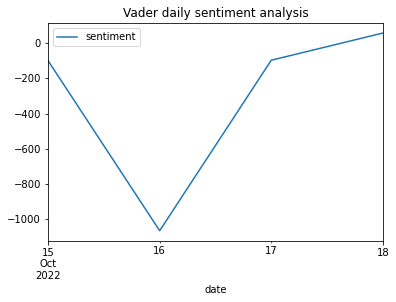

In [49]:
centiment_graph("daily","Vader", vader_lSentiment)

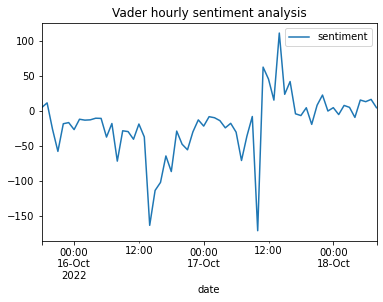

In [50]:
centiment_graph("hourly","Vader", vader_lSentiment)

In [51]:
def getAverageSentiment(sentiment):
    sum = 0
    for snt in sentiment:
        sum+=snt[1]
    print(sum/len(sentiment))

In [52]:
getAverageSentiment(count_lSentiment)

-0.07558604917095484


In [53]:
getAverageSentiment(vader_lSentiment)

-0.0276036935391656


In [54]:
len(count_lSentiment)

43725

In [55]:
len(tweets_df)

43725

In [56]:
def return_sentiment(x):
    if x > 0:
        return "positive"
    elif x < 0:
        return "negative"
    return "neutral"

tweets_df['sentiment_score_count'] = [score[1] for score in count_lSentiment]
tweets_df['sentiment_count'] = tweets_df['sentiment_score_count'].apply(return_sentiment)
tweets_df['sentiment_score_vader'] = [score[1] for score in vader_lSentiment]
tweets_df['sentiment_vader'] = tweets_df['sentiment_score_vader'].apply(return_sentiment)

In [57]:
tweets_df['sentiment_count'].value_counts()

neutral     27396
negative     9485
positive     6844
Name: sentiment_count, dtype: int64

In [58]:
tweets_df['sentiment_vader'].value_counts()

negative    16138
neutral     14704
positive    12883
Name: sentiment_vader, dtype: int64

# LDA Model

In [59]:
lTweets = []

for tweet_id in token_dic:
    date = token_dic[tweet_id]['time']
    lTokens = token_dic[tweet_id]['tokens']
    lTweets.append(' '.join(lTokens))

In [60]:
topicNum = 3
wordNumToDisplay = 10
featureNum = 100

In [61]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

tfVectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=featureNum, stop_words='english')
tf = tfVectorizer.fit_transform(lTweets)

tfFeatureNames = tfVectorizer.get_feature_names()

ldaModel = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(tf)

In [62]:
def display_topics(model, featureNames, numTopWords):
    for topicId, lTopicDist in enumerate(model.components_):
        print("Topic %d:" % (topicId))
        print(" ".join([featureNames[i] for i in lTopicDist.argsort()[:-numTopWords - 1:-1]]))

In [63]:
display_topics(ldaModel, tfFeatureNames, wordNumToDisplay)

Topic 0:
tax uk turn pay corporateate year recess goldman company avoid
Topic 1:
tax cut truss uk hunt chancellor reversee liz plan jeremy
Topic 2:
incomee pro million sell real receivee estatee portfolio commercialal rental


In [64]:
import pyLDAvis.sklearn

panel = pyLDAvis.sklearn.prepare(ldaModel, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:349: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/opt/anaconda3/lib/python3.8/site-packages/sklearn

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


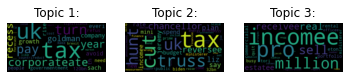

In [65]:
import numpy as np
import math
from wordcloud import WordCloud

def displayWordcloud(model, featureNames):

    normalisedComponents = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]

    topicNum = len(model.components_)
    plotColNum = 3
    plotRowNum = int(math.ceil(topicNum / plotColNum))

    for topicId, lTopicDist in enumerate(normalisedComponents):
        lWordProb = {featureNames[i] : wordProb for i,wordProb in enumerate(lTopicDist)}
        wordcloud = WordCloud(background_color='black')
        wordcloud.fit_words(frequencies=lWordProb)
        plt.subplot(plotRowNum, plotColNum, topicId+1)
        plt.title('Topic %d:' % (topicId+1))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

    plt.show(block=True)
displayWordcloud(ldaModel, tfFeatureNames)

In [66]:
import networkx as nx

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [67]:
energyGraph = nx.Graph()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [68]:
tweets_df.columns

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['id', 'text', 'time', 'hastags', 'mentions', 'language',
       'retweet count', 'like_count', 'country', 'author_id', 'username',
       'year', 'month', 'day', 'hour', 'sentiment_score_count',
       'sentiment_count', 'sentiment_score_vader', 'sentiment_vader'],
      dtype='object')

In [69]:
pos_data = tweets_df[tweets_df['sentiment_count'] ==  'positive'][['username', 'sentiment_score_count', 'author_id', 'retweet count', 'id']]
pos_data.head()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,username,sentiment_score_count,author_id,retweet count,id
4,VincitOmniaVe18,1,1357289132712751105,14,1582282135310077953
6,JourneyTrade,1,1043975488429993984,0,1582282098152329216
11,ditotts,1,1276912994258243584,0,1582281981450067971
34,astro_trader,1,201204167,1,1582281580088684544
45,ScotiaScoot,2,866943601,0,1582281167486980096


In [70]:
neg_data = tweets_df[tweets_df['sentiment_count'] ==  'negative'][['username', 'sentiment_score_count', 'author_id', 'retweet count', 'id']]
neg_data.head()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,username,sentiment_score_count,author_id,retweet count,id
1,dracuk,-1,227242988,162,1582282214968295427
7,IanRSlack2,-1,809362000698556416,68,1582282062920552449
14,dodiesinc,-1,48070940,162,1582281947526881280
19,Quicktake,-1,252751061,0,1582281855616753664
20,roslync81472124,-1,1241462736174960640,162,1582281843402952705


In [71]:
neg_data = neg_data[neg_data['retweet count'] != 0]
neg_data.shape

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(6955, 5)

In [72]:
neg_data = neg_data.head(1000)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [73]:
neg_data['retweet count'].sum()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


100725

In [74]:
len(neg_data)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1000

In [75]:
for i in neg_data.itertuples():
    energyGraph.add_node(i[1], score = i[2], retweets = i[4])
    for j in range(i[4]):
        energyGraph.add_node(f'{i[5]}_{j}', nature = 'neg')
        energyGraph.add_edge(i[2], f'{i[5]}_{j}')

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [76]:
len(energyGraph.nodes())

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


101688

In [77]:
with open('Graphs/TaxPolicyNeg.graphml', 'wb') as fOut:
    nx.write_graphml(energyGraph, fOut)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [85]:
energyGraph.clear()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [86]:
pos_data = pos_data[pos_data['retweet count'] != 0]

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [87]:
pos_data.shape

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(4336, 5)

In [88]:
pos_data = pos_data.head(1000)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [89]:
pos_data['retweet count'].sum()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


403468

In [90]:
len(pos_data)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1000

In [91]:
for i in pos_data.itertuples():
    energyGraph.add_node(i[1], score = i[2], retweets = i[4])
    for j in range(i[4]):
        energyGraph.add_node(f'{i[5]}_{j}', nature = 'pos')
        energyGraph.add_edge(i[2], f'{i[5]}_{j}')

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [92]:
len(energyGraph.nodes())

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


404415

In [93]:
with open('Graphs/TaxPolicyPos.graphml', 'wb') as fOut:
    nx.write_graphml(energyGraph, fOut)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
